Fix possible bug in the encoder-decoder reshaping, check results on different test cases (where validation runs and test runs are in interpolation as well as extrapolation regime)

Future:
- Check extrapolation (Higher BStrength compared to training)

- Loss function

- LR scheduler

- Latent space visualization

In [1]:
import os
import sys
import matplotlib
import matplotlib.pyplot
import matplotlib.pyplot as plt

import time
import datetime
import argparse
import numpy as np
import pandas as pd
from random import SystemRandom
import logging

import torch
import torch.nn as nn
from torch.nn.functional import relu
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, Dataset

from rich.progress import track
import tqdm

adjoint=True
if adjoint:
    from torchdiffeq import odeint_adjoint as odeint
else:
    from torchdiffeq import odeint

from sunpy.visualization import colormaps as cm    

import torchvision
import torchvision.transforms as T

import node_utils as nut
import data_utils as dut

In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [3]:
plt.rc("axes.spines", right=True, top=True)
plt.rc("figure", dpi=300, 
       figsize=(9, 3)
      )
plt.rc("font", family="serif")
plt.rc("legend", edgecolor="none", frameon=True)

In [4]:
device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
device

device(type='cuda', index=0)

In [5]:
args = {
    "niters": 2000,
    "lr": 1e-2,
    "save": "experiments/",
    "load": None,
    "r": 1991,
    "node-layers": 2,
    "mlp-layers": 1,
    "latents": 8,  # 68818 has 8 latent dims
    # "latents": 20, # 44467 expt ID, else only 8 dims
    "units": 50,
    "test_mode": "t5p4",
    "resize_dims": (32, 128),
    "param_scaling": [1, 1],
    "warm_start": 41574,
    "do_warm_start": False,
    "quadratic": False,
    "loss": "smooth_l1",
    "l2int": 0.1, # "int_t ||f||_2"
    "JFrobint": 0.1 # "int_t ||df/dx||_F"
    # "loss": "mae"
    # "test_mode" can take values "t2p1, t4p1" for now (number of training vs val and test sims)
}

args

{'niters': 2000,
 'lr': 0.01,
 'save': 'experiments/',
 'load': None,
 'r': 1991,
 'node-layers': 2,
 'mlp-layers': 1,
 'latents': 8,
 'units': 50,
 'test_mode': 't5p4',
 'resize_dims': (32, 128),
 'param_scaling': [1, 1],
 'warm_start': 41574,
 'do_warm_start': False,
 'quadratic': False,
 'loss': 'smooth_l1'}

In [6]:
validation_dir = "./validation_data"
validation_file = os.path.join(validation_dir, "CR2161_validation_PolarTensor.npy")
sim_file = os.path.join(validation_dir, "CR2161_SimID4edge_validation.npy")
param_file = os.path.join(validation_dir, "params_2161_validation.txt")

In [7]:
data_obj = dut.parse_datasets(validation_file, sim_file, param_file, args, device)

In [8]:
data_obj

{'train_dataloader': <generator object inf_generator at 0x7f57a68ae490>,
 'val_dataloader': <generator object inf_generator at 0x7f57a68ae180>,
 'test_dataloader': <generator object inf_generator at 0x7f57a68ae500>,
 'train_params': array([[ 5.18  ,  1.    ],
        [ 6.7339,  1.    ],
        [ 8.288 ,  1.    ],
        [14.5039,  1.    ],
        [16.058 ,  1.    ],
        [17.612 ,  1.    ]]),
 'val_params': array([[ 9.8419,  1.    ],
        [11.396 ,  1.    ],
        [11.7845,  1.    ],
        [19.166 ,  1.    ]]),
 'test_params': array([[12.95,  1.  ],
        [20.72,  1.  ]]),
 'train_dataset': [(tensor([[[0.1062, 0.0975, 0.0930,  ..., 0.1151, 5.1800, 1.0000],
            [0.1060, 0.0971, 0.0926,  ..., 0.1154, 5.1800, 1.0000],
            [0.1057, 0.0967, 0.0922,  ..., 0.1156, 5.1800, 1.0000],
            ...,
            [0.0999, 0.0847, 0.0789,  ..., 0.1223, 5.1800, 1.0000],
            [0.0999, 0.0846, 0.0787,  ..., 0.1225, 5.1800, 1.0000],
            [0.0999, 0.0845, 0.

In [9]:
model = nut.PNODE_Conv(input_dim=4096, latent_dim=args["latents"], param_dim=2, 
                       device=device,
                      n_layers=args["node-layers"],
                      n_units=args["units"],
                      quadratic=args["quadratic"]).to(device)


pEncoder = nut.count_parameters(model.encoder)
pPNODE = nut.count_parameters(model.pnode)
pDecoder = nut.count_parameters(model.decoder_mlp) + nut.count_parameters(model.decoder_conv)

print("Total Number of Parameters: ")
print(pEncoder + pPNODE + pDecoder)

nut.makedirs(os.path.join(os.getcwd(), "logs"))
logdir = os.path.join(os.getcwd(), "logs")

nut.makedirs(args["save"])
# nut.makedirs("./model_stopping")




if args["load"] is not None:
    experimentID = args["load"]
    print("Loading experiment")
else:
    if args["do_warm_start"] == True:
        experimentID = args["warm_start"]
        print("Warm starting previous experiment")
    else:
        experimentID = int(SystemRandom().random()*100000)
        print("Starting new experiment")

print("Experiment ID: ")
print(experimentID)

ckpt_path = os.path.join(args["save"], "experiment_" + str(experimentID) + '.ckpt')

print("Checkpoint Path: ")
print(ckpt_path)

logger = dut.get_logger(logpath=os.path.join(logdir, "expt_normalized_pnode_images_2.log"))
logger

logger.info(os.getcwd())
logger.info(model)
logger.info("Number of parameters: {}".format(pEncoder + pPNODE + pDecoder))
logger.info(args)
logger.info("Checkpoint Path")
logger.info(ckpt_path)
logger.info("Input Dim: ")
logger.info(data_obj["input_dim"])
logger.info("Param Dim: ")
logger.info(2)
logger.info("Latent Dim: ")
logger.info(args["latents"])
logger.info(device)

/home/ajivani/WLROM_new/WhiteLight
PNODE_Conv(
  (encoder): Sequential(
    (0): ZeroPad2d((7, 8, 7, 8))
    (1): Conv2d(1, 4, kernel_size=(16, 16), stride=(2, 2))
    (2): ELU(alpha=1.0)
    (3): ZeroPad2d((3, 4, 3, 4))
    (4): Conv2d(4, 8, kernel_size=(8, 8), stride=(2, 2))
    (5): ELU(alpha=1.0)
    (6): ZeroPad2d((1, 2, 1, 2))
    (7): Conv2d(8, 16, kernel_size=(4, 4), stride=(2, 2))
    (8): ELU(alpha=1.0)
    (9): ZeroPad2d((0, 1, 0, 1))
    (10): Conv2d(16, 32, kernel_size=(2, 2), stride=(2, 2))
    (11): ELU(alpha=1.0)
    (12): ZeroPad2d((0, 0, 0, 0))
    (13): Conv2d(32, 64, kernel_size=(1, 1), stride=(2, 2))
    (14): ELU(alpha=1.0)
    (15): Flatten(start_dim=1, end_dim=-1)
    (16): Linear(in_features=256, out_features=8, bias=True)
    (17): ELU(alpha=1.0)
  )
  (pnode): ODENet(
    (odenet): Sequential(
      (0): Linear(in_features=10, out_features=50, bias=True)
      (1): ELU(alpha=1.0)
      (2): Linear(in_features=50, out_features=50, bias=True)
      (3): ELU(alp

Using regular PNODE
Total Number of Parameters: 
90445
Starting new experiment
Experiment ID: 
73682
Checkpoint Path: 
experiments/experiment_73682.ckpt


In [10]:
experimentID

73682

In [11]:
torch.backends.cudnn.enabled = True  # Enable cuDNN
torch.backends.cudnn.benchmark = True  # Use cuDNN's auto-tuner for the best performance
# torch.multiprocessing.set_start_method('spawn')

In [12]:
# save optimizer state, and epoch. Load everything and warm start if interrupting kernel. also set ckpt_freq so its not
# saving the model at every successful reduction in validation loss.

In [13]:
# Credit to Hongfan Chen for the stopping and LR scheduling pipeline.

optimizer = optim.Adamax(model.parameters(), lr=args["lr"])
val_loss_list = []
train_loss_list = []
n_iters_to_viz = 1
num_batches = 1
early_stopping = nut.EarlyStopping(patience=60,
                                verbose=True,
                                path=ckpt_path)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.6, patience=40)
ckpt_freq=10
trainMax = data_obj["max_train"].item()
trainMin = data_obj["min_train"].item()

if args["load"] is None:
    # This is us trying to warm start predictions.
    if args["do_warm_start"] == True:
        checkpoint = torch.load(ckpt_path)
        model.load_state_dict(checkpoint['model'])
        start_epoch = checkpoint['epoch']
        optimizer.load_state_dict(checkpoint['optimizer_state'])
        print("Warm Starting Experiment {} from Epoch {}".format(experimentID, start_epoch))
    else:
        start_epoch = 0
        print("Starting a new experiment {} from Epoch {}".format(experimentID, start_epoch))
    
    # Resume training from a specific epoch
    for itr in track(range(start_epoch + 1, num_batches * (args["niters"] + 1)), description="Looping over Epochs..."):
    # for itr in track(range(1, num_batches * (args["niters"] + 1)), description="Looping over Epochs..."):
        optimizer.zero_grad()
        batch_dict = dut.get_next_batch(data_obj["train_dataloader"], device=device)

        raw_pred = model(batch_dict["tp_to_predict"], batch_dict["observed_data"])
        model_pred = torch.permute(torch.squeeze(raw_pred), (1, 0, 2)) * (trainMax - trainMin) + trainMin
        target = batch_dict["data_to_predict"] * (trainMax - trainMin) + trainMin

        loss = nut.oden_loss(target, model_pred, loss=args["loss"])
        loss.backward()
        optimizer.step()

        train_loss_list.append(loss.item())


        val_dict = dut.get_next_batch(data_obj["val_dataloader"], device=device)
        raw_val_pred = model(val_dict["tp_to_predict"], val_dict["observed_data"])
        val_pred = torch.permute(torch.squeeze(raw_val_pred), (1, 0, 2)) * (trainMax - trainMin) + trainMin
        val_target = val_dict["data_to_predict"] * (trainMax - trainMin) + trainMin

        val_loss = nut.oden_loss(val_target, val_pred, loss=args["loss"])

        val_loss_list.append(val_loss.item())

        message = 'Epoch {:04d}|Val loss {:.6e}|Train loss {:.6e}|LR {:.5f}|'.format(
                        itr//num_batches, 
                        val_loss.item(), 
                        loss.item(), 
                        optimizer.param_groups[0]["lr"])

        logger.info(message)
        scheduler.step(val_loss)
        if itr % ckpt_freq == 0:
            early_stopping(val_loss, model, optimizer, itr, args)


        if early_stopping.early_stop:
            print('Early stopping')
            torch.save(model.state_dict(), os.path.join(args["save"], "experiment_" + str(experimentID) + '_early_stopping.ckpt'))
            break
        
else:
    nut.get_ckpt_model(ckpt_path, model, device)

Output()

Starting a new experiment 35107 from Epoch 0


Epoch 0001|Val loss 9.732559e-02|Train loss 8.739521e-02|LR 0.01000|
Epoch 0002|Val loss 8.526673e-02|Train loss 8.989322e-02|LR 0.01000|
Epoch 0003|Val loss 9.166238e-02|Train loss 8.065522e-02|LR 0.01000|
Epoch 0004|Val loss 6.383687e-02|Train loss 8.548667e-02|LR 0.01000|
Epoch 0005|Val loss 2.357440e-01|Train loss 6.130029e-02|LR 0.01000|
Epoch 0006|Val loss 8.989254e-02|Train loss 2.217812e-01|LR 0.01000|
Epoch 0007|Val loss 1.240280e-01|Train loss 8.169804e-02|LR 0.01000|
Epoch 0008|Val loss 9.357712e-02|Train loss 1.198781e-01|LR 0.01000|
Epoch 0009|Val loss 5.473533e-02|Train loss 8.831231e-02|LR 0.01000|
Epoch 0010|Val loss 5.763648e-02|Train loss 4.880618e-02|LR 0.01000|


Validation loss decreased (inf --> 0.06).  Saving model ...

Epoch 0011|Val loss 5.937611e-02|Train loss 5.188973e-02|LR 0.01000|
Epoch 0012|Val loss 5.045059e-02|Train loss 5.537182e-02|LR 0.01000|
Epoch 0013|Val loss 5.375059e-02|Train loss 4.532661e-02|LR 0.01000|
Epoch 0014|Val loss 4.437964e-02|Train loss 4.899729e-02|LR 0.01000|
Epoch 0015|Val loss 4.506214e-02|Train loss 4.016462e-02|LR 0.01000|
Epoch 0016|Val loss 4.071928e-02|Train loss 4.052041e-02|LR 0.01000|
Epoch 0017|Val loss 3.978784e-02|Train loss 3.621073e-02|LR 0.01000|
Epoch 0018|Val loss 3.937656e-02|Train loss 3.471737e-02|LR 0.01000|
Epoch 0019|Val loss 3.863821e-02|Train loss 3.395939e-02|LR 0.01000|
Epoch 0020|Val loss 3.413222e-02|Train loss 3.328079e-02|LR 0.01000|


Validation loss decreased (0.06 --> 0.03).  Saving model ...

Epoch 0021|Val loss 3.343473e-02|Train loss 3.000854e-02|LR 0.01000|
Epoch 0022|Val loss 3.288870e-02|Train loss 2.963375e-02|LR 0.01000|
Epoch 0023|Val loss 3.149531e-02|Train loss 2.895790e-02|LR 0.01000|
Epoch 0024|Val loss 3.110374e-02|Train loss 2.741899e-02|LR 0.01000|
Epoch 0025|Val loss 3.080855e-02|Train loss 2.693688e-02|LR 0.01000|
Epoch 0026|Val loss 2.952750e-02|Train loss 2.645498e-02|LR 0.01000|
Epoch 0027|Val loss 2.926261e-02|Train loss 2.518198e-02|LR 0.01000|
Epoch 0028|Val loss 2.928174e-02|Train loss 2.526898e-02|LR 0.01000|
Epoch 0029|Val loss 2.796382e-02|Train loss 2.456077e-02|LR 0.01000|
Epoch 0030|Val loss 2.874449e-02|Train loss 2.421929e-02|LR 0.01000|


Validation loss decreased (0.03 --> 0.03).  Saving model ...

Epoch 0031|Val loss 2.683637e-02|Train loss 2.395030e-02|LR 0.01000|
Epoch 0032|Val loss 2.662744e-02|Train loss 2.241557e-02|LR 0.01000|
Epoch 0033|Val loss 2.767016e-02|Train loss 2.215085e-02|LR 0.01000|
Epoch 0034|Val loss 2.616067e-02|Train loss 2.265987e-02|LR 0.01000|
Epoch 0035|Val loss 2.672317e-02|Train loss 2.216472e-02|LR 0.01000|
Epoch 0036|Val loss 2.639650e-02|Train loss 2.177632e-02|LR 0.01000|
Epoch 0038|Val loss 2.607908e-02|Train loss 2.139486e-02|LR 0.01000|
Epoch 0039|Val loss 2.533577e-02|Train loss 2.119819e-02|LR 0.01000|
Epoch 0040|Val loss 2.500333e-02|Train loss 2.077166e-02|LR 0.01000|


Validation loss decreased (0.03 --> 0.03).  Saving model ...

Epoch 0041|Val loss 2.512434e-02|Train loss 2.069607e-02|LR 0.01000|
Epoch 0042|Val loss 2.501250e-02|Train loss 2.038008e-02|LR 0.01000|
Epoch 0043|Val loss 2.451643e-02|Train loss 2.018993e-02|LR 0.01000|
Epoch 0044|Val loss 2.458458e-02|Train loss 2.001130e-02|LR 0.01000|
Epoch 0045|Val loss 2.462811e-02|Train loss 1.964568e-02|LR 0.01000|
Epoch 0046|Val loss 2.416600e-02|Train loss 1.953030e-02|LR 0.01000|
Epoch 0047|Val loss 2.436681e-02|Train loss 1.938680e-02|LR 0.01000|
Epoch 0048|Val loss 2.427659e-02|Train loss 1.912464e-02|LR 0.01000|
Epoch 0049|Val loss 2.381881e-02|Train loss 1.894142e-02|LR 0.01000|
Epoch 0050|Val loss 2.441397e-02|Train loss 1.883447e-02|LR 0.01000|


Validation loss decreased (0.03 --> 0.02).  Saving model ...

Epoch 0051|Val loss 2.336255e-02|Train loss 1.881915e-02|LR 0.01000|
Epoch 0052|Val loss 2.422434e-02|Train loss 1.875537e-02|LR 0.01000|
Epoch 0053|Val loss 2.336089e-02|Train loss 1.868246e-02|LR 0.01000|
Epoch 0054|Val loss 2.354327e-02|Train loss 1.837861e-02|LR 0.01000|
Epoch 0055|Val loss 2.321150e-02|Train loss 1.804299e-02|LR 0.01000|
Epoch 0056|Val loss 2.332408e-02|Train loss 1.793387e-02|LR 0.01000|
Epoch 0057|Val loss 2.308050e-02|Train loss 1.777587e-02|LR 0.01000|
Epoch 0058|Val loss 2.315208e-02|Train loss 1.767957e-02|LR 0.01000|
Epoch 0059|Val loss 2.270334e-02|Train loss 1.755750e-02|LR 0.01000|
Epoch 0060|Val loss 2.310745e-02|Train loss 1.747622e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0061|Val loss 2.257128e-02|Train loss 1.745896e-02|LR 0.01000|
Epoch 0062|Val loss 2.310076e-02|Train loss 1.747476e-02|LR 0.01000|
Epoch 0063|Val loss 2.241993e-02|Train loss 1.745617e-02|LR 0.01000|
Epoch 0064|Val loss 2.244202e-02|Train loss 1.708137e-02|LR 0.01000|
Epoch 0065|Val loss 2.236334e-02|Train loss 1.690816e-02|LR 0.01000|
Epoch 0066|Val loss 2.218338e-02|Train loss 1.679680e-02|LR 0.01000|
Epoch 0067|Val loss 2.234598e-02|Train loss 1.681662e-02|LR 0.01000|
Epoch 0068|Val loss 2.190437e-02|Train loss 1.678012e-02|LR 0.01000|
Epoch 0069|Val loss 2.194596e-02|Train loss 1.657954e-02|LR 0.01000|
Epoch 0070|Val loss 2.187110e-02|Train loss 1.641628e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0071|Val loss 2.177054e-02|Train loss 1.631154e-02|LR 0.01000|
Epoch 0072|Val loss 2.178985e-02|Train loss 1.627984e-02|LR 0.01000|
Epoch 0073|Val loss 2.151112e-02|Train loss 1.623590e-02|LR 0.01000|
Epoch 0074|Val loss 2.156081e-02|Train loss 1.615820e-02|LR 0.01000|
Epoch 0075|Val loss 2.144119e-02|Train loss 1.602363e-02|LR 0.01000|
Epoch 0076|Val loss 2.132501e-02|Train loss 1.590457e-02|LR 0.01000|
Epoch 0077|Val loss 2.128332e-02|Train loss 1.580690e-02|LR 0.01000|
Epoch 0078|Val loss 2.125569e-02|Train loss 1.574657e-02|LR 0.01000|
Epoch 0079|Val loss 2.126180e-02|Train loss 1.568873e-02|LR 0.01000|
Epoch 0080|Val loss 2.112105e-02|Train loss 1.562203e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0081|Val loss 2.112707e-02|Train loss 1.553632e-02|LR 0.01000|
Epoch 0082|Val loss 2.107104e-02|Train loss 1.543107e-02|LR 0.01000|
Epoch 0083|Val loss 2.100898e-02|Train loss 1.534356e-02|LR 0.01000|
Epoch 0084|Val loss 2.094503e-02|Train loss 1.526121e-02|LR 0.01000|
Epoch 0085|Val loss 2.097512e-02|Train loss 1.519329e-02|LR 0.01000|
Epoch 0086|Val loss 2.091094e-02|Train loss 1.513048e-02|LR 0.01000|
Epoch 0087|Val loss 2.089604e-02|Train loss 1.506748e-02|LR 0.01000|
Epoch 0088|Val loss 2.087138e-02|Train loss 1.501633e-02|LR 0.01000|
Epoch 0089|Val loss 2.088387e-02|Train loss 1.497255e-02|LR 0.01000|
Epoch 0090|Val loss 2.076556e-02|Train loss 1.494219e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0091|Val loss 2.091686e-02|Train loss 1.495828e-02|LR 0.01000|
Epoch 0092|Val loss 2.078391e-02|Train loss 1.503427e-02|LR 0.01000|
Epoch 0093|Val loss 2.081951e-02|Train loss 1.507666e-02|LR 0.01000|
Epoch 0094|Val loss 2.069434e-02|Train loss 1.504376e-02|LR 0.01000|
Epoch 0095|Val loss 2.051420e-02|Train loss 1.483844e-02|LR 0.01000|
Epoch 0096|Val loss 2.045266e-02|Train loss 1.466712e-02|LR 0.01000|
Epoch 0097|Val loss 2.050718e-02|Train loss 1.460104e-02|LR 0.01000|
Epoch 0098|Val loss 2.059545e-02|Train loss 1.461547e-02|LR 0.01000|
Epoch 0099|Val loss 2.061390e-02|Train loss 1.472018e-02|LR 0.01000|
Epoch 0100|Val loss 2.049967e-02|Train loss 1.477574e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0101|Val loss 2.037179e-02|Train loss 1.471238e-02|LR 0.01000|
Epoch 0102|Val loss 2.014836e-02|Train loss 1.449069e-02|LR 0.01000|
Epoch 0103|Val loss 2.015595e-02|Train loss 1.438452e-02|LR 0.01000|
Epoch 0104|Val loss 2.009374e-02|Train loss 1.434253e-02|LR 0.01000|
Epoch 0105|Val loss 2.009264e-02|Train loss 1.431363e-02|LR 0.01000|
Epoch 0106|Val loss 2.022896e-02|Train loss 1.431975e-02|LR 0.01000|
Epoch 0107|Val loss 2.008974e-02|Train loss 1.438018e-02|LR 0.01000|
Epoch 0108|Val loss 2.023448e-02|Train loss 1.441009e-02|LR 0.01000|
Epoch 0109|Val loss 2.003199e-02|Train loss 1.441110e-02|LR 0.01000|
Epoch 0110|Val loss 1.999301e-02|Train loss 1.432715e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0111|Val loss 1.983927e-02|Train loss 1.420204e-02|LR 0.01000|
Epoch 0112|Val loss 1.977853e-02|Train loss 1.409784e-02|LR 0.01000|
Epoch 0113|Val loss 1.977664e-02|Train loss 1.402964e-02|LR 0.01000|
Epoch 0114|Val loss 1.974249e-02|Train loss 1.400821e-02|LR 0.01000|
Epoch 0115|Val loss 1.986572e-02|Train loss 1.402933e-02|LR 0.01000|
Epoch 0116|Val loss 1.973428e-02|Train loss 1.407462e-02|LR 0.01000|
Epoch 0117|Val loss 1.991167e-02|Train loss 1.411727e-02|LR 0.01000|
Epoch 0118|Val loss 1.958835e-02|Train loss 1.412998e-02|LR 0.01000|
Epoch 0119|Val loss 1.969644e-02|Train loss 1.404874e-02|LR 0.01000|
Epoch 0120|Val loss 1.948657e-02|Train loss 1.397497e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0121|Val loss 1.951217e-02|Train loss 1.387673e-02|LR 0.01000|
Epoch 0122|Val loss 1.948112e-02|Train loss 1.382644e-02|LR 0.01000|
Epoch 0123|Val loss 1.942494e-02|Train loss 1.380564e-02|LR 0.01000|
Epoch 0124|Val loss 1.950310e-02|Train loss 1.381564e-02|LR 0.01000|
Epoch 0125|Val loss 1.936957e-02|Train loss 1.383596e-02|LR 0.01000|
Epoch 0126|Val loss 1.950751e-02|Train loss 1.385559e-02|LR 0.01000|
Epoch 0127|Val loss 1.925139e-02|Train loss 1.382298e-02|LR 0.01000|
Epoch 0128|Val loss 1.930536e-02|Train loss 1.373115e-02|LR 0.01000|
Epoch 0129|Val loss 1.917836e-02|Train loss 1.365376e-02|LR 0.01000|
Epoch 0130|Val loss 1.922200e-02|Train loss 1.360347e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0131|Val loss 1.915787e-02|Train loss 1.357497e-02|LR 0.01000|
Epoch 0132|Val loss 1.913404e-02|Train loss 1.356460e-02|LR 0.01000|
Epoch 0133|Val loss 1.915171e-02|Train loss 1.359917e-02|LR 0.01000|
Epoch 0134|Val loss 1.908443e-02|Train loss 1.369719e-02|LR 0.01000|
Epoch 0135|Val loss 1.911315e-02|Train loss 1.382331e-02|LR 0.01000|
Epoch 0136|Val loss 1.888096e-02|Train loss 1.358542e-02|LR 0.01000|
Epoch 0137|Val loss 1.896820e-02|Train loss 1.346608e-02|LR 0.01000|
Epoch 0138|Val loss 1.889778e-02|Train loss 1.347662e-02|LR 0.01000|
Epoch 0139|Val loss 1.901585e-02|Train loss 1.354452e-02|LR 0.01000|
Epoch 0140|Val loss 1.887923e-02|Train loss 1.356873e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0141|Val loss 1.901172e-02|Train loss 1.345650e-02|LR 0.01000|
Epoch 0142|Val loss 1.889231e-02|Train loss 1.348629e-02|LR 0.01000|
Epoch 0143|Val loss 1.923183e-02|Train loss 1.367225e-02|LR 0.01000|
Epoch 0144|Val loss 1.878353e-02|Train loss 1.365022e-02|LR 0.01000|
Epoch 0145|Val loss 1.898436e-02|Train loss 1.355025e-02|LR 0.01000|
Epoch 0146|Val loss 1.868555e-02|Train loss 1.351778e-02|LR 0.01000|
Epoch 0147|Val loss 1.878055e-02|Train loss 1.336077e-02|LR 0.01000|
Epoch 0148|Val loss 1.867447e-02|Train loss 1.329323e-02|LR 0.01000|
Epoch 0149|Val loss 1.887527e-02|Train loss 1.330421e-02|LR 0.01000|
Epoch 0150|Val loss 1.857622e-02|Train loss 1.328521e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0151|Val loss 1.890619e-02|Train loss 1.328120e-02|LR 0.01000|
Epoch 0152|Val loss 1.859295e-02|Train loss 1.331613e-02|LR 0.01000|
Epoch 0153|Val loss 1.902713e-02|Train loss 1.339665e-02|LR 0.01000|
Epoch 0154|Val loss 1.867251e-02|Train loss 1.349392e-02|LR 0.01000|
Epoch 0155|Val loss 1.880212e-02|Train loss 1.343398e-02|LR 0.01000|
Epoch 0156|Val loss 1.841335e-02|Train loss 1.329965e-02|LR 0.01000|
Epoch 0157|Val loss 1.871103e-02|Train loss 1.318557e-02|LR 0.01000|
Epoch 0158|Val loss 1.835392e-02|Train loss 1.315516e-02|LR 0.01000|
Epoch 0159|Val loss 1.864787e-02|Train loss 1.310632e-02|LR 0.01000|
Epoch 0160|Val loss 1.835067e-02|Train loss 1.307054e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0161|Val loss 1.858073e-02|Train loss 1.306594e-02|LR 0.01000|
Epoch 0162|Val loss 1.831634e-02|Train loss 1.302980e-02|LR 0.01000|
Epoch 0163|Val loss 1.849826e-02|Train loss 1.299088e-02|LR 0.01000|
Epoch 0164|Val loss 1.822913e-02|Train loss 1.296731e-02|LR 0.01000|
Epoch 0165|Val loss 1.855883e-02|Train loss 1.300583e-02|LR 0.01000|
Epoch 0166|Val loss 1.834377e-02|Train loss 1.308955e-02|LR 0.01000|
Epoch 0167|Val loss 1.867758e-02|Train loss 1.316524e-02|LR 0.01000|
Epoch 0168|Val loss 1.823540e-02|Train loss 1.321946e-02|LR 0.01000|
Epoch 0169|Val loss 1.840128e-02|Train loss 1.306406e-02|LR 0.01000|
Epoch 0170|Val loss 1.810959e-02|Train loss 1.290840e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0171|Val loss 1.828873e-02|Train loss 1.284806e-02|LR 0.01000|
Epoch 0172|Val loss 1.812995e-02|Train loss 1.280258e-02|LR 0.01000|
Epoch 0173|Val loss 1.830883e-02|Train loss 1.279679e-02|LR 0.01000|
Epoch 0174|Val loss 1.809400e-02|Train loss 1.280759e-02|LR 0.01000|
Epoch 0175|Val loss 1.821950e-02|Train loss 1.281959e-02|LR 0.01000|
Epoch 0176|Val loss 1.798650e-02|Train loss 1.274644e-02|LR 0.01000|
Epoch 0177|Val loss 1.814871e-02|Train loss 1.269981e-02|LR 0.01000|
Epoch 0178|Val loss 1.794158e-02|Train loss 1.268501e-02|LR 0.01000|
Epoch 0179|Val loss 1.823131e-02|Train loss 1.268742e-02|LR 0.01000|
Epoch 0180|Val loss 1.797488e-02|Train loss 1.273550e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0181|Val loss 1.857796e-02|Train loss 1.288259e-02|LR 0.01000|
Epoch 0182|Val loss 1.801005e-02|Train loss 1.311843e-02|LR 0.01000|
Epoch 0183|Val loss 1.832029e-02|Train loss 1.301622e-02|LR 0.01000|
Epoch 0184|Val loss 1.781768e-02|Train loss 1.277665e-02|LR 0.01000|
Epoch 0185|Val loss 1.796241e-02|Train loss 1.259685e-02|LR 0.01000|
Epoch 0186|Val loss 1.790164e-02|Train loss 1.254049e-02|LR 0.01000|
Epoch 0187|Val loss 1.789171e-02|Train loss 1.251818e-02|LR 0.01000|
Epoch 0188|Val loss 1.805766e-02|Train loss 1.255868e-02|LR 0.01000|
Epoch 0189|Val loss 1.780936e-02|Train loss 1.262902e-02|LR 0.01000|
Epoch 0190|Val loss 1.831606e-02|Train loss 1.267868e-02|LR 0.01000|


EarlyStopping counter: 1 out of 60

Epoch 0191|Val loss 1.770807e-02|Train loss 1.274634e-02|LR 0.01000|
Epoch 0192|Val loss 1.816314e-02|Train loss 1.270115e-02|LR 0.01000|
Epoch 0193|Val loss 1.762310e-02|Train loss 1.258958e-02|LR 0.01000|
Epoch 0194|Val loss 1.784728e-02|Train loss 1.251038e-02|LR 0.01000|
Epoch 0195|Val loss 1.763469e-02|Train loss 1.239364e-02|LR 0.01000|
Epoch 0196|Val loss 1.777815e-02|Train loss 1.232541e-02|LR 0.01000|
Epoch 0197|Val loss 1.759444e-02|Train loss 1.230963e-02|LR 0.01000|
Epoch 0198|Val loss 1.778291e-02|Train loss 1.231800e-02|LR 0.01000|
Epoch 0199|Val loss 1.756285e-02|Train loss 1.232864e-02|LR 0.01000|
Epoch 0200|Val loss 1.794354e-02|Train loss 1.235780e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0201|Val loss 1.754479e-02|Train loss 1.249486e-02|LR 0.01000|
Epoch 0202|Val loss 1.796011e-02|Train loss 1.250689e-02|LR 0.01000|
Epoch 0203|Val loss 1.746082e-02|Train loss 1.245808e-02|LR 0.01000|
Epoch 0204|Val loss 1.776196e-02|Train loss 1.230149e-02|LR 0.01000|
Epoch 0205|Val loss 1.739521e-02|Train loss 1.220794e-02|LR 0.01000|
Epoch 0206|Val loss 1.767472e-02|Train loss 1.217294e-02|LR 0.01000|
Epoch 0207|Val loss 1.738049e-02|Train loss 1.218014e-02|LR 0.01000|
Epoch 0208|Val loss 1.768047e-02|Train loss 1.215595e-02|LR 0.01000|
Epoch 0209|Val loss 1.729609e-02|Train loss 1.213811e-02|LR 0.01000|
Epoch 0210|Val loss 1.771646e-02|Train loss 1.214408e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0211|Val loss 1.743477e-02|Train loss 1.223352e-02|LR 0.01000|
Epoch 0212|Val loss 1.780443e-02|Train loss 1.236371e-02|LR 0.01000|
Epoch 0213|Val loss 1.732147e-02|Train loss 1.234094e-02|LR 0.01000|
Epoch 0214|Val loss 1.739057e-02|Train loss 1.208700e-02|LR 0.01000|
Epoch 0215|Val loss 1.723703e-02|Train loss 1.194375e-02|LR 0.01000|
Epoch 0216|Val loss 1.740495e-02|Train loss 1.188896e-02|LR 0.01000|
Epoch 0217|Val loss 1.719465e-02|Train loss 1.188998e-02|LR 0.01000|
Epoch 0218|Val loss 1.741215e-02|Train loss 1.190937e-02|LR 0.01000|
Epoch 0219|Val loss 1.714055e-02|Train loss 1.190628e-02|LR 0.01000|
Epoch 0220|Val loss 1.730363e-02|Train loss 1.185230e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0221|Val loss 1.710298e-02|Train loss 1.179273e-02|LR 0.01000|
Epoch 0222|Val loss 1.723517e-02|Train loss 1.175690e-02|LR 0.01000|
Epoch 0223|Val loss 1.708587e-02|Train loss 1.175096e-02|LR 0.01000|
Epoch 0224|Val loss 1.751499e-02|Train loss 1.182645e-02|LR 0.01000|
Epoch 0225|Val loss 1.716208e-02|Train loss 1.204405e-02|LR 0.01000|
Epoch 0226|Val loss 1.759218e-02|Train loss 1.218483e-02|LR 0.01000|
Epoch 0227|Val loss 1.698808e-02|Train loss 1.205960e-02|LR 0.01000|
Epoch 0228|Val loss 1.726247e-02|Train loss 1.184359e-02|LR 0.01000|
Epoch 0229|Val loss 1.693734e-02|Train loss 1.168036e-02|LR 0.01000|
Epoch 0230|Val loss 1.712176e-02|Train loss 1.162478e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0231|Val loss 1.694768e-02|Train loss 1.164299e-02|LR 0.01000|
Epoch 0232|Val loss 1.731525e-02|Train loss 1.169619e-02|LR 0.01000|
Epoch 0233|Val loss 1.691403e-02|Train loss 1.176461e-02|LR 0.01000|
Epoch 0234|Val loss 1.733167e-02|Train loss 1.182974e-02|LR 0.01000|
Epoch 0235|Val loss 1.684608e-02|Train loss 1.177889e-02|LR 0.01000|
Epoch 0236|Val loss 1.714141e-02|Train loss 1.167982e-02|LR 0.01000|
Epoch 0237|Val loss 1.679764e-02|Train loss 1.160230e-02|LR 0.01000|
Epoch 0238|Val loss 1.700717e-02|Train loss 1.153784e-02|LR 0.01000|
Epoch 0239|Val loss 1.677743e-02|Train loss 1.154995e-02|LR 0.01000|
Epoch 0240|Val loss 1.711935e-02|Train loss 1.150383e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0241|Val loss 1.669247e-02|Train loss 1.149901e-02|LR 0.01000|
Epoch 0242|Val loss 1.704467e-02|Train loss 1.149021e-02|LR 0.01000|
Epoch 0243|Val loss 1.668552e-02|Train loss 1.145185e-02|LR 0.01000|
Epoch 0244|Val loss 1.705002e-02|Train loss 1.143524e-02|LR 0.01000|
Epoch 0245|Val loss 1.666673e-02|Train loss 1.149084e-02|LR 0.01000|
Epoch 0246|Val loss 1.689717e-02|Train loss 1.144971e-02|LR 0.01000|
Epoch 0247|Val loss 1.658957e-02|Train loss 1.136331e-02|LR 0.01000|
Epoch 0248|Val loss 1.684454e-02|Train loss 1.127409e-02|LR 0.01000|
Epoch 0249|Val loss 1.648808e-02|Train loss 1.123937e-02|LR 0.01000|
Epoch 0250|Val loss 1.685764e-02|Train loss 1.123757e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0251|Val loss 1.650653e-02|Train loss 1.125274e-02|LR 0.01000|
Epoch 0252|Val loss 1.690246e-02|Train loss 1.126874e-02|LR 0.01000|
Epoch 0253|Val loss 1.648878e-02|Train loss 1.129712e-02|LR 0.01000|
Epoch 0254|Val loss 1.674313e-02|Train loss 1.126324e-02|LR 0.01000|
Epoch 0255|Val loss 1.646279e-02|Train loss 1.117129e-02|LR 0.01000|
Epoch 0256|Val loss 1.664009e-02|Train loss 1.108253e-02|LR 0.01000|
Epoch 0257|Val loss 1.638581e-02|Train loss 1.105243e-02|LR 0.01000|
Epoch 0258|Val loss 1.672912e-02|Train loss 1.105172e-02|LR 0.01000|
Epoch 0259|Val loss 1.637198e-02|Train loss 1.110328e-02|LR 0.01000|
Epoch 0260|Val loss 1.682051e-02|Train loss 1.113904e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0261|Val loss 1.630885e-02|Train loss 1.113202e-02|LR 0.01000|
Epoch 0262|Val loss 1.659611e-02|Train loss 1.104337e-02|LR 0.01000|
Epoch 0263|Val loss 1.628319e-02|Train loss 1.096231e-02|LR 0.01000|
Epoch 0264|Val loss 1.644922e-02|Train loss 1.092478e-02|LR 0.01000|
Epoch 0265|Val loss 1.628971e-02|Train loss 1.094243e-02|LR 0.01000|
Epoch 0266|Val loss 1.630360e-02|Train loss 1.089295e-02|LR 0.01000|
Epoch 0267|Val loss 1.623383e-02|Train loss 1.085302e-02|LR 0.01000|
Epoch 0268|Val loss 1.620009e-02|Train loss 1.074755e-02|LR 0.01000|
Epoch 0269|Val loss 1.617190e-02|Train loss 1.068741e-02|LR 0.01000|
Epoch 0270|Val loss 1.626759e-02|Train loss 1.066604e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0271|Val loss 1.620495e-02|Train loss 1.072198e-02|LR 0.01000|
Epoch 0272|Val loss 1.670098e-02|Train loss 1.086177e-02|LR 0.01000|
Epoch 0273|Val loss 1.618929e-02|Train loss 1.109819e-02|LR 0.01000|
Epoch 0274|Val loss 1.661669e-02|Train loss 1.106074e-02|LR 0.01000|
Epoch 0275|Val loss 1.597835e-02|Train loss 1.089245e-02|LR 0.01000|
Epoch 0276|Val loss 1.621023e-02|Train loss 1.069212e-02|LR 0.01000|
Epoch 0277|Val loss 1.602319e-02|Train loss 1.062336e-02|LR 0.01000|
Epoch 0278|Val loss 1.606452e-02|Train loss 1.058003e-02|LR 0.01000|
Epoch 0279|Val loss 1.594313e-02|Train loss 1.053664e-02|LR 0.01000|
Epoch 0280|Val loss 1.616294e-02|Train loss 1.047731e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0281|Val loss 1.596181e-02|Train loss 1.052192e-02|LR 0.01000|
Epoch 0282|Val loss 1.668274e-02|Train loss 1.074604e-02|LR 0.01000|
Epoch 0283|Val loss 1.597180e-02|Train loss 1.101871e-02|LR 0.01000|
Epoch 0284|Val loss 1.618807e-02|Train loss 1.072548e-02|LR 0.01000|
Epoch 0285|Val loss 1.581914e-02|Train loss 1.048545e-02|LR 0.01000|
Epoch 0286|Val loss 1.607597e-02|Train loss 1.043080e-02|LR 0.01000|
Epoch 0287|Val loss 1.587403e-02|Train loss 1.043253e-02|LR 0.01000|
Epoch 0288|Val loss 1.602008e-02|Train loss 1.044542e-02|LR 0.01000|
Epoch 0289|Val loss 1.574844e-02|Train loss 1.042847e-02|LR 0.01000|
Epoch 0290|Val loss 1.626190e-02|Train loss 1.043318e-02|LR 0.01000|


EarlyStopping counter: 1 out of 60

Epoch 0291|Val loss 1.583253e-02|Train loss 1.058148e-02|LR 0.01000|
Epoch 0292|Val loss 1.616594e-02|Train loss 1.055341e-02|LR 0.01000|
Epoch 0293|Val loss 1.568144e-02|Train loss 1.045906e-02|LR 0.01000|
Epoch 0294|Val loss 1.603418e-02|Train loss 1.035753e-02|LR 0.01000|
Epoch 0295|Val loss 1.564564e-02|Train loss 1.033872e-02|LR 0.01000|
Epoch 0296|Val loss 1.591641e-02|Train loss 1.030061e-02|LR 0.01000|
Epoch 0297|Val loss 1.561870e-02|Train loss 1.027812e-02|LR 0.01000|
Epoch 0298|Val loss 1.600477e-02|Train loss 1.029096e-02|LR 0.01000|
Epoch 0299|Val loss 1.570980e-02|Train loss 1.038478e-02|LR 0.01000|
Epoch 0300|Val loss 1.597944e-02|Train loss 1.033019e-02|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0301|Val loss 1.556858e-02|Train loss 1.027505e-02|LR 0.01000|
Epoch 0302|Val loss 1.595571e-02|Train loss 1.022145e-02|LR 0.01000|
Epoch 0303|Val loss 1.545225e-02|Train loss 1.024390e-02|LR 0.01000|
Epoch 0304|Val loss 1.580345e-02|Train loss 1.016014e-02|LR 0.01000|
Epoch 0305|Val loss 1.543476e-02|Train loss 1.012109e-02|LR 0.01000|
Epoch 0306|Val loss 1.574002e-02|Train loss 1.011587e-02|LR 0.01000|
Epoch 0307|Val loss 1.552937e-02|Train loss 1.023006e-02|LR 0.01000|
Epoch 0308|Val loss 1.556336e-02|Train loss 1.005112e-02|LR 0.01000|
Epoch 0309|Val loss 1.545328e-02|Train loss 9.957823e-03|LR 0.01000|
Epoch 0310|Val loss 1.543327e-02|Train loss 9.894329e-03|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0312|Val loss 1.548443e-02|Train loss 9.881807e-03|LR 0.01000|
Epoch 0313|Val loss 1.532841e-02|Train loss 9.912139e-03|LR 0.01000|
Epoch 0314|Val loss 1.569009e-02|Train loss 9.952332e-03|LR 0.01000|
Epoch 0315|Val loss 1.531043e-02|Train loss 1.010669e-02|LR 0.01000|
Epoch 0316|Val loss 1.585219e-02|Train loss 1.011747e-02|LR 0.01000|
Epoch 0317|Val loss 1.526011e-02|Train loss 1.024480e-02|LR 0.01000|
Epoch 0318|Val loss 1.552844e-02|Train loss 1.019474e-02|LR 0.01000|
Epoch 0319|Val loss 1.507670e-02|Train loss 9.883586e-03|LR 0.01000|
Epoch 0320|Val loss 1.511904e-02|Train loss 9.673560e-03|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0321|Val loss 1.521422e-02|Train loss 9.636442e-03|LR 0.01000|
Epoch 0322|Val loss 1.515556e-02|Train loss 9.692960e-03|LR 0.01000|
Epoch 0323|Val loss 1.565712e-02|Train loss 9.849325e-03|LR 0.01000|
Epoch 0324|Val loss 1.510205e-02|Train loss 1.010723e-02|LR 0.01000|
Epoch 0325|Val loss 1.559741e-02|Train loss 1.006133e-02|LR 0.01000|
Epoch 0326|Val loss 1.498012e-02|Train loss 9.945132e-03|LR 0.01000|
Epoch 0327|Val loss 1.509369e-02|Train loss 9.645029e-03|LR 0.01000|
Epoch 0328|Val loss 1.504938e-02|Train loss 9.562983e-03|LR 0.01000|
Epoch 0329|Val loss 1.496807e-02|Train loss 9.538775e-03|LR 0.01000|
Epoch 0330|Val loss 1.513744e-02|Train loss 9.573213e-03|LR 0.01000|


EarlyStopping counter: 1 out of 60

Epoch 0331|Val loss 1.492208e-02|Train loss 9.580723e-03|LR 0.01000|
Epoch 0332|Val loss 1.517928e-02|Train loss 9.657254e-03|LR 0.01000|
Epoch 0333|Val loss 1.480644e-02|Train loss 9.573277e-03|LR 0.01000|
Epoch 0334|Val loss 1.498601e-02|Train loss 9.472671e-03|LR 0.01000|
Epoch 0335|Val loss 1.483343e-02|Train loss 9.446984e-03|LR 0.01000|
Epoch 0336|Val loss 1.501706e-02|Train loss 9.492094e-03|LR 0.01000|
Epoch 0337|Val loss 1.482388e-02|Train loss 9.568587e-03|LR 0.01000|
Epoch 0338|Val loss 1.546832e-02|Train loss 9.629631e-03|LR 0.01000|
Epoch 0339|Val loss 1.494023e-02|Train loss 9.993612e-03|LR 0.01000|
Epoch 0340|Val loss 1.510012e-02|Train loss 9.793741e-03|LR 0.01000|


Validation loss decreased (0.02 --> 0.02).  Saving model ...

Epoch 0341|Val loss 1.467742e-02|Train loss 9.775000e-03|LR 0.01000|
Epoch 0342|Val loss 1.486987e-02|Train loss 9.312209e-03|LR 0.01000|
Epoch 0343|Val loss 1.472741e-02|Train loss 9.364501e-03|LR 0.01000|
Epoch 0344|Val loss 1.487427e-02|Train loss 9.319759e-03|LR 0.01000|
Epoch 0345|Val loss 1.512943e-02|Train loss 9.509536e-03|LR 0.01000|
Epoch 0347|Val loss 1.508392e-02|Train loss 9.599688e-03|LR 0.01000|
Epoch 0348|Val loss 1.455264e-02|Train loss 9.550340e-03|LR 0.01000|
Epoch 0349|Val loss 1.469975e-02|Train loss 9.225777e-03|LR 0.01000|
Epoch 0350|Val loss 1.462673e-02|Train loss 9.108408e-03|LR 0.01000|


Validation loss decreased (0.02 --> 0.01).  Saving model ...

Epoch 0351|Val loss 1.454407e-02|Train loss 9.078179e-03|LR 0.01000|
Epoch 0352|Val loss 1.498699e-02|Train loss 9.189052e-03|LR 0.01000|
Epoch 0353|Val loss 1.458415e-02|Train loss 9.399700e-03|LR 0.01000|
Epoch 0354|Val loss 1.498321e-02|Train loss 9.566588e-03|LR 0.01000|
Epoch 0355|Val loss 1.446333e-02|Train loss 9.409482e-03|LR 0.01000|
Epoch 0356|Val loss 1.459674e-02|Train loss 9.154489e-03|LR 0.01000|
Epoch 0357|Val loss 1.443787e-02|Train loss 9.054910e-03|LR 0.01000|
Epoch 0358|Val loss 1.477956e-02|Train loss 9.046862e-03|LR 0.01000|
Epoch 0359|Val loss 1.441661e-02|Train loss 9.140817e-03|LR 0.01000|
Epoch 0360|Val loss 1.489006e-02|Train loss 9.335139e-03|LR 0.01000|


EarlyStopping counter: 1 out of 60

Epoch 0361|Val loss 1.431180e-02|Train loss 9.294194e-03|LR 0.01000|
Epoch 0362|Val loss 1.445810e-02|Train loss 9.029237e-03|LR 0.01000|
Epoch 0363|Val loss 1.437230e-02|Train loss 8.939752e-03|LR 0.01000|
Epoch 0364|Val loss 1.439596e-02|Train loss 8.916066e-03|LR 0.01000|
Epoch 0365|Val loss 1.430972e-02|Train loss 8.943315e-03|LR 0.01000|
Epoch 0366|Val loss 1.449783e-02|Train loss 8.954138e-03|LR 0.01000|
Epoch 0367|Val loss 1.423891e-02|Train loss 9.009335e-03|LR 0.01000|
Epoch 0368|Val loss 1.475282e-02|Train loss 9.102677e-03|LR 0.01000|
Epoch 0369|Val loss 1.408678e-02|Train loss 9.201988e-03|LR 0.01000|
Epoch 0370|Val loss 1.428525e-02|Train loss 8.894811e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0371|Val loss 1.407503e-02|Train loss 8.755133e-03|LR 0.01000|
Epoch 0372|Val loss 1.431965e-02|Train loss 8.757996e-03|LR 0.01000|
Epoch 0373|Val loss 1.411475e-02|Train loss 8.911546e-03|LR 0.01000|
Epoch 0374|Val loss 1.424315e-02|Train loss 8.916018e-03|LR 0.01000|
Epoch 0375|Val loss 1.401333e-02|Train loss 8.928151e-03|LR 0.01000|
Epoch 0376|Val loss 1.405715e-02|Train loss 8.745690e-03|LR 0.01000|
Epoch 0377|Val loss 1.388061e-02|Train loss 8.618159e-03|LR 0.01000|
Epoch 0378|Val loss 1.398268e-02|Train loss 8.583323e-03|LR 0.01000|
Epoch 0379|Val loss 1.398694e-02|Train loss 8.627321e-03|LR 0.01000|
Epoch 0380|Val loss 1.412227e-02|Train loss 8.753939e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0381|Val loss 1.392326e-02|Train loss 8.828613e-03|LR 0.01000|
Epoch 0382|Val loss 1.456125e-02|Train loss 8.921852e-03|LR 0.01000|
Epoch 0383|Val loss 1.378325e-02|Train loss 9.155047e-03|LR 0.01000|
Epoch 0384|Val loss 1.394242e-02|Train loss 8.726503e-03|LR 0.01000|
Epoch 0385|Val loss 1.378078e-02|Train loss 8.501429e-03|LR 0.01000|
Epoch 0386|Val loss 1.392206e-02|Train loss 8.474147e-03|LR 0.01000|
Epoch 0387|Val loss 1.380291e-02|Train loss 8.476384e-03|LR 0.01000|
Epoch 0388|Val loss 1.384308e-02|Train loss 8.473084e-03|LR 0.01000|
Epoch 0389|Val loss 1.369936e-02|Train loss 8.409198e-03|LR 0.01000|
Epoch 0390|Val loss 1.378641e-02|Train loss 8.346612e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0391|Val loss 1.368418e-02|Train loss 8.306016e-03|LR 0.01000|
Epoch 0392|Val loss 1.370447e-02|Train loss 8.275519e-03|LR 0.01000|
Epoch 0393|Val loss 1.362432e-02|Train loss 8.260749e-03|LR 0.01000|
Epoch 0394|Val loss 1.393624e-02|Train loss 8.296929e-03|LR 0.01000|
Epoch 0395|Val loss 1.374085e-02|Train loss 8.485124e-03|LR 0.01000|
Epoch 0396|Val loss 1.411487e-02|Train loss 8.677945e-03|LR 0.01000|
Epoch 0397|Val loss 1.380423e-02|Train loss 8.746258e-03|LR 0.01000|
Epoch 0398|Val loss 1.395773e-02|Train loss 8.622644e-03|LR 0.01000|
Epoch 0399|Val loss 1.367272e-02|Train loss 8.570245e-03|LR 0.01000|
Epoch 0400|Val loss 1.378117e-02|Train loss 8.434523e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0401|Val loss 1.351898e-02|Train loss 8.374709e-03|LR 0.01000|
Epoch 0402|Val loss 1.398095e-02|Train loss 8.368651e-03|LR 0.01000|
Epoch 0403|Val loss 1.356136e-02|Train loss 8.459662e-03|LR 0.01000|
Epoch 0404|Val loss 1.379997e-02|Train loss 8.431850e-03|LR 0.01000|
Epoch 0405|Val loss 1.347258e-02|Train loss 8.386741e-03|LR 0.01000|
Epoch 0406|Val loss 1.363478e-02|Train loss 8.219172e-03|LR 0.01000|
Epoch 0407|Val loss 1.340230e-02|Train loss 8.158565e-03|LR 0.01000|
Epoch 0408|Val loss 1.360102e-02|Train loss 8.127862e-03|LR 0.01000|
Epoch 0409|Val loss 1.344373e-02|Train loss 8.244059e-03|LR 0.01000|
Epoch 0410|Val loss 1.373331e-02|Train loss 8.272214e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0411|Val loss 1.352909e-02|Train loss 8.356777e-03|LR 0.01000|
Epoch 0412|Val loss 1.378945e-02|Train loss 8.363068e-03|LR 0.01000|
Epoch 0413|Val loss 1.342523e-02|Train loss 8.462355e-03|LR 0.01000|
Epoch 0414|Val loss 1.347309e-02|Train loss 8.213385e-03|LR 0.01000|
Epoch 0415|Val loss 1.324088e-02|Train loss 8.076173e-03|LR 0.01000|
Epoch 0416|Val loss 1.356259e-02|Train loss 8.003574e-03|LR 0.01000|
Epoch 0417|Val loss 1.334997e-02|Train loss 8.109777e-03|LR 0.01000|
Epoch 0418|Val loss 1.367871e-02|Train loss 8.295123e-03|LR 0.01000|
Epoch 0419|Val loss 1.332789e-02|Train loss 8.405418e-03|LR 0.01000|
Epoch 0420|Val loss 1.334293e-02|Train loss 8.143806e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0421|Val loss 1.324342e-02|Train loss 7.991158e-03|LR 0.01000|
Epoch 0422|Val loss 1.319362e-02|Train loss 7.881876e-03|LR 0.01000|
Epoch 0423|Val loss 1.333969e-02|Train loss 7.896316e-03|LR 0.01000|
Epoch 0424|Val loss 1.323786e-02|Train loss 8.050672e-03|LR 0.01000|
Epoch 0425|Val loss 1.354364e-02|Train loss 8.062820e-03|LR 0.01000|
Epoch 0426|Val loss 1.326951e-02|Train loss 8.166512e-03|LR 0.01000|
Epoch 0427|Val loss 1.343918e-02|Train loss 8.166947e-03|LR 0.01000|
Epoch 0428|Val loss 1.314370e-02|Train loss 8.028232e-03|LR 0.01000|
Epoch 0429|Val loss 1.321253e-02|Train loss 7.861370e-03|LR 0.01000|
Epoch 0430|Val loss 1.312786e-02|Train loss 7.829857e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0431|Val loss 1.336737e-02|Train loss 7.863679e-03|LR 0.01000|
Epoch 0432|Val loss 1.321480e-02|Train loss 8.034524e-03|LR 0.01000|
Epoch 0433|Val loss 1.353954e-02|Train loss 8.127159e-03|LR 0.01000|
Epoch 0434|Val loss 1.312572e-02|Train loss 8.236546e-03|LR 0.01000|
Epoch 0435|Val loss 1.320023e-02|Train loss 7.916937e-03|LR 0.01000|
Epoch 0436|Val loss 1.299617e-02|Train loss 7.756874e-03|LR 0.01000|
Epoch 0437|Val loss 1.316415e-02|Train loss 7.669760e-03|LR 0.01000|
Epoch 0438|Val loss 1.303924e-02|Train loss 7.685503e-03|LR 0.01000|
Epoch 0439|Val loss 1.341781e-02|Train loss 7.837060e-03|LR 0.01000|
Epoch 0440|Val loss 1.318374e-02|Train loss 8.176648e-03|LR 0.01000|


EarlyStopping counter: 1 out of 60

Epoch 0441|Val loss 1.315866e-02|Train loss 8.100838e-03|LR 0.01000|
Epoch 0442|Val loss 1.291217e-02|Train loss 7.796961e-03|LR 0.01000|
Epoch 0443|Val loss 1.301901e-02|Train loss 7.595362e-03|LR 0.01000|
Epoch 0444|Val loss 1.314869e-02|Train loss 7.658169e-03|LR 0.01000|
Epoch 0445|Val loss 1.320152e-02|Train loss 7.896758e-03|LR 0.01000|
Epoch 0446|Val loss 1.294178e-02|Train loss 7.971777e-03|LR 0.01000|
Epoch 0447|Val loss 1.306227e-02|Train loss 7.759091e-03|LR 0.01000|
Epoch 0448|Val loss 1.293492e-02|Train loss 7.745641e-03|LR 0.01000|
Epoch 0449|Val loss 1.332392e-02|Train loss 7.901842e-03|LR 0.01000|
Epoch 0450|Val loss 1.298205e-02|Train loss 7.994632e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0451|Val loss 1.296217e-02|Train loss 7.760630e-03|LR 0.01000|
Epoch 0452|Val loss 1.279139e-02|Train loss 7.539510e-03|LR 0.01000|
Epoch 0453|Val loss 1.284708e-02|Train loss 7.466197e-03|LR 0.01000|
Epoch 0454|Val loss 1.291206e-02|Train loss 7.505625e-03|LR 0.01000|
Epoch 0455|Val loss 1.298629e-02|Train loss 7.576420e-03|LR 0.01000|
Epoch 0456|Val loss 1.294997e-02|Train loss 7.678329e-03|LR 0.01000|
Epoch 0457|Val loss 1.342719e-02|Train loss 7.853874e-03|LR 0.01000|
Epoch 0458|Val loss 1.285189e-02|Train loss 8.064025e-03|LR 0.01000|
Epoch 0459|Val loss 1.287309e-02|Train loss 7.691256e-03|LR 0.01000|
Epoch 0460|Val loss 1.275123e-02|Train loss 7.486538e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0461|Val loss 1.293542e-02|Train loss 7.401838e-03|LR 0.01000|
Epoch 0462|Val loss 1.275004e-02|Train loss 7.437858e-03|LR 0.01000|
Epoch 0463|Val loss 1.289238e-02|Train loss 7.459573e-03|LR 0.01000|
Epoch 0464|Val loss 1.279690e-02|Train loss 7.521565e-03|LR 0.01000|
Epoch 0465|Val loss 1.294077e-02|Train loss 7.502508e-03|LR 0.01000|
Epoch 0466|Val loss 1.272633e-02|Train loss 7.597197e-03|LR 0.01000|
Epoch 0467|Val loss 1.299914e-02|Train loss 7.569527e-03|LR 0.01000|
Epoch 0468|Val loss 1.283149e-02|Train loss 7.629007e-03|LR 0.01000|
Epoch 0469|Val loss 1.298961e-02|Train loss 7.618324e-03|LR 0.01000|
Epoch 0470|Val loss 1.273791e-02|Train loss 7.778742e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0471|Val loss 1.285506e-02|Train loss 7.603355e-03|LR 0.01000|
Epoch 0472|Val loss 1.267089e-02|Train loss 7.471004e-03|LR 0.01000|
Epoch 0473|Val loss 1.274912e-02|Train loss 7.398474e-03|LR 0.01000|
Epoch 0474|Val loss 1.258994e-02|Train loss 7.396406e-03|LR 0.01000|
Epoch 0475|Val loss 1.291194e-02|Train loss 7.449997e-03|LR 0.01000|
Epoch 0476|Val loss 1.261752e-02|Train loss 7.564337e-03|LR 0.01000|
Epoch 0477|Val loss 1.276858e-02|Train loss 7.455361e-03|LR 0.01000|
Epoch 0478|Val loss 1.258039e-02|Train loss 7.398190e-03|LR 0.01000|
Epoch 0479|Val loss 1.270590e-02|Train loss 7.262685e-03|LR 0.01000|
Epoch 0480|Val loss 1.258020e-02|Train loss 7.294623e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0481|Val loss 1.273772e-02|Train loss 7.369181e-03|LR 0.01000|
Epoch 0482|Val loss 1.268967e-02|Train loss 7.409389e-03|LR 0.01000|
Epoch 0483|Val loss 1.268827e-02|Train loss 7.449989e-03|LR 0.01000|
Epoch 0484|Val loss 1.246285e-02|Train loss 7.308229e-03|LR 0.01000|
Epoch 0485|Val loss 1.264912e-02|Train loss 7.264519e-03|LR 0.01000|
Epoch 0486|Val loss 1.258204e-02|Train loss 7.310105e-03|LR 0.01000|
Epoch 0487|Val loss 1.295214e-02|Train loss 7.380659e-03|LR 0.01000|
Epoch 0488|Val loss 1.263537e-02|Train loss 7.723957e-03|LR 0.01000|
Epoch 0489|Val loss 1.277345e-02|Train loss 7.523980e-03|LR 0.01000|
Epoch 0490|Val loss 1.242481e-02|Train loss 7.407972e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0491|Val loss 1.249478e-02|Train loss 7.144419e-03|LR 0.01000|
Epoch 0492|Val loss 1.246316e-02|Train loss 7.087004e-03|LR 0.01000|
Epoch 0493|Val loss 1.272546e-02|Train loss 7.137821e-03|LR 0.01000|
Epoch 0494|Val loss 1.252162e-02|Train loss 7.299848e-03|LR 0.01000|
Epoch 0495|Val loss 1.263041e-02|Train loss 7.374544e-03|LR 0.01000|
Epoch 0496|Val loss 1.246458e-02|Train loss 7.253160e-03|LR 0.01000|
Epoch 0497|Val loss 1.249693e-02|Train loss 7.094957e-03|LR 0.01000|
Epoch 0498|Val loss 1.232936e-02|Train loss 7.012516e-03|LR 0.01000|
Epoch 0499|Val loss 1.250841e-02|Train loss 6.994953e-03|LR 0.01000|
Epoch 0500|Val loss 1.245142e-02|Train loss 7.073535e-03|LR 0.01000|


EarlyStopping counter: 1 out of 60

Epoch 0501|Val loss 1.273418e-02|Train loss 7.194313e-03|LR 0.01000|
Epoch 0502|Val loss 1.247590e-02|Train loss 7.407005e-03|LR 0.01000|
Epoch 0503|Val loss 1.271034e-02|Train loss 7.323912e-03|LR 0.01000|
Epoch 0504|Val loss 1.236432e-02|Train loss 7.293910e-03|LR 0.01000|
Epoch 0505|Val loss 1.240247e-02|Train loss 7.065102e-03|LR 0.01000|
Epoch 0506|Val loss 1.231166e-02|Train loss 6.991612e-03|LR 0.01000|
Epoch 0507|Val loss 1.246991e-02|Train loss 6.962646e-03|LR 0.01000|
Epoch 0508|Val loss 1.234411e-02|Train loss 7.039144e-03|LR 0.01000|
Epoch 0509|Val loss 1.257491e-02|Train loss 7.094227e-03|LR 0.01000|
Epoch 0510|Val loss 1.233283e-02|Train loss 7.134694e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0511|Val loss 1.258709e-02|Train loss 7.077551e-03|LR 0.01000|
Epoch 0512|Val loss 1.232010e-02|Train loss 7.076665e-03|LR 0.01000|
Epoch 0513|Val loss 1.247403e-02|Train loss 7.024861e-03|LR 0.01000|
Epoch 0514|Val loss 1.224614e-02|Train loss 6.974443e-03|LR 0.01000|
Epoch 0515|Val loss 1.246244e-02|Train loss 6.967073e-03|LR 0.01000|
Epoch 0516|Val loss 1.235246e-02|Train loss 7.032218e-03|LR 0.01000|
Epoch 0517|Val loss 1.239557e-02|Train loss 7.085855e-03|LR 0.01000|
Epoch 0518|Val loss 1.221480e-02|Train loss 7.010001e-03|LR 0.01000|
Epoch 0519|Val loss 1.230857e-02|Train loss 6.900456e-03|LR 0.01000|
Epoch 0520|Val loss 1.216627e-02|Train loss 6.834553e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0521|Val loss 1.233515e-02|Train loss 6.833052e-03|LR 0.01000|
Epoch 0522|Val loss 1.222301e-02|Train loss 6.890020e-03|LR 0.01000|
Epoch 0523|Val loss 1.240797e-02|Train loss 6.930369e-03|LR 0.01000|
Epoch 0524|Val loss 1.223228e-02|Train loss 6.973395e-03|LR 0.01000|
Epoch 0525|Val loss 1.229081e-02|Train loss 6.904188e-03|LR 0.01000|
Epoch 0526|Val loss 1.208970e-02|Train loss 6.822370e-03|LR 0.01000|
Epoch 0527|Val loss 1.223866e-02|Train loss 6.721283e-03|LR 0.01000|
Epoch 0528|Val loss 1.220290e-02|Train loss 6.738063e-03|LR 0.01000|
Epoch 0529|Val loss 1.263247e-02|Train loss 6.877123e-03|LR 0.01000|
Epoch 0530|Val loss 1.241334e-02|Train loss 7.309583e-03|LR 0.01000|


EarlyStopping counter: 1 out of 60

Epoch 0531|Val loss 1.247485e-02|Train loss 7.190325e-03|LR 0.01000|
Epoch 0532|Val loss 1.212264e-02|Train loss 7.025372e-03|LR 0.01000|
Epoch 0533|Val loss 1.207293e-02|Train loss 6.673873e-03|LR 0.01000|
Epoch 0534|Val loss 1.202651e-02|Train loss 6.569512e-03|LR 0.01000|
Epoch 0535|Val loss 1.230233e-02|Train loss 6.641265e-03|LR 0.01000|
Epoch 0536|Val loss 1.214009e-02|Train loss 6.798016e-03|LR 0.01000|
Epoch 0537|Val loss 1.221352e-02|Train loss 6.844504e-03|LR 0.01000|
Epoch 0538|Val loss 1.211599e-02|Train loss 6.688992e-03|LR 0.01000|
Epoch 0539|Val loss 1.212023e-02|Train loss 6.609571e-03|LR 0.01000|
Epoch 0540|Val loss 1.215074e-02|Train loss 6.635619e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0541|Val loss 1.217136e-02|Train loss 6.657324e-03|LR 0.01000|
Epoch 0542|Val loss 1.202702e-02|Train loss 6.707590e-03|LR 0.01000|
Epoch 0543|Val loss 1.237702e-02|Train loss 6.747518e-03|LR 0.01000|
Epoch 0544|Val loss 1.216363e-02|Train loss 6.936483e-03|LR 0.01000|
Epoch 0545|Val loss 1.228316e-02|Train loss 6.855353e-03|LR 0.01000|
Epoch 0546|Val loss 1.201439e-02|Train loss 6.777440e-03|LR 0.01000|
Epoch 0547|Val loss 1.205791e-02|Train loss 6.622065e-03|LR 0.01000|
Epoch 0548|Val loss 1.196359e-02|Train loss 6.510599e-03|LR 0.01000|
Epoch 0549|Val loss 1.207811e-02|Train loss 6.465388e-03|LR 0.01000|
Epoch 0550|Val loss 1.195981e-02|Train loss 6.514889e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0551|Val loss 1.223469e-02|Train loss 6.555157e-03|LR 0.01000|
Epoch 0552|Val loss 1.205591e-02|Train loss 6.713731e-03|LR 0.01000|
Epoch 0553|Val loss 1.217762e-02|Train loss 6.657328e-03|LR 0.01000|
Epoch 0554|Val loss 1.200016e-02|Train loss 6.638392e-03|LR 0.01000|
Epoch 0555|Val loss 1.211489e-02|Train loss 6.560799e-03|LR 0.01000|
Epoch 0556|Val loss 1.194186e-02|Train loss 6.578531e-03|LR 0.01000|
Epoch 0557|Val loss 1.205678e-02|Train loss 6.513117e-03|LR 0.01000|
Epoch 0558|Val loss 1.193669e-02|Train loss 6.571574e-03|LR 0.01000|
Epoch 0559|Val loss 1.200547e-02|Train loss 6.485856e-03|LR 0.01000|
Epoch 0560|Val loss 1.182953e-02|Train loss 6.499135e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0561|Val loss 1.213131e-02|Train loss 6.475212e-03|LR 0.01000|
Epoch 0562|Val loss 1.184547e-02|Train loss 6.585157e-03|LR 0.01000|
Epoch 0563|Val loss 1.208019e-02|Train loss 6.457117e-03|LR 0.01000|
Epoch 0564|Val loss 1.207443e-02|Train loss 6.518133e-03|LR 0.01000|
Epoch 0565|Val loss 1.207792e-02|Train loss 6.649361e-03|LR 0.01000|
Epoch 0566|Val loss 1.181112e-02|Train loss 6.535018e-03|LR 0.01000|
Epoch 0567|Val loss 1.181517e-02|Train loss 6.408799e-03|LR 0.01000|
Epoch 0568|Val loss 1.181870e-02|Train loss 6.273643e-03|LR 0.01000|
Epoch 0569|Val loss 1.177921e-02|Train loss 6.269226e-03|LR 0.01000|
Epoch 0570|Val loss 1.179741e-02|Train loss 6.290230e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0571|Val loss 1.201823e-02|Train loss 6.370841e-03|LR 0.01000|
Epoch 0572|Val loss 1.181714e-02|Train loss 6.416723e-03|LR 0.01000|
Epoch 0573|Val loss 1.191456e-02|Train loss 6.438850e-03|LR 0.01000|
Epoch 0574|Val loss 1.180944e-02|Train loss 6.405618e-03|LR 0.01000|
Epoch 0575|Val loss 1.194837e-02|Train loss 6.386948e-03|LR 0.01000|
Epoch 0576|Val loss 1.181962e-02|Train loss 6.349383e-03|LR 0.01000|
Epoch 0577|Val loss 1.195423e-02|Train loss 6.308792e-03|LR 0.01000|
Epoch 0578|Val loss 1.192630e-02|Train loss 6.518035e-03|LR 0.01000|
Epoch 0579|Val loss 1.198018e-02|Train loss 6.417065e-03|LR 0.01000|
Epoch 0580|Val loss 1.183473e-02|Train loss 6.539265e-03|LR 0.01000|


EarlyStopping counter: 1 out of 60

Epoch 0581|Val loss 1.164797e-02|Train loss 6.283396e-03|LR 0.01000|
Epoch 0582|Val loss 1.157399e-02|Train loss 6.081562e-03|LR 0.01000|
Epoch 0583|Val loss 1.169543e-02|Train loss 6.104497e-03|LR 0.01000|
Epoch 0584|Val loss 1.169125e-02|Train loss 6.130452e-03|LR 0.01000|
Epoch 0585|Val loss 1.180450e-02|Train loss 6.124309e-03|LR 0.01000|
Epoch 0586|Val loss 1.174843e-02|Train loss 6.261804e-03|LR 0.01000|
Epoch 0587|Val loss 1.165894e-02|Train loss 6.154594e-03|LR 0.01000|
Epoch 0588|Val loss 1.157207e-02|Train loss 6.051091e-03|LR 0.01000|
Epoch 0589|Val loss 1.176827e-02|Train loss 6.129485e-03|LR 0.01000|
Epoch 0590|Val loss 1.167750e-02|Train loss 6.159902e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0591|Val loss 1.180178e-02|Train loss 6.181740e-03|LR 0.01000|
Epoch 0592|Val loss 1.178158e-02|Train loss 6.388172e-03|LR 0.01000|
Epoch 0593|Val loss 1.179329e-02|Train loss 6.341625e-03|LR 0.01000|
Epoch 0594|Val loss 1.157768e-02|Train loss 6.226753e-03|LR 0.01000|
Epoch 0595|Val loss 1.163881e-02|Train loss 6.070040e-03|LR 0.01000|
Epoch 0596|Val loss 1.168981e-02|Train loss 6.071587e-03|LR 0.01000|
Epoch 0597|Val loss 1.174303e-02|Train loss 6.155889e-03|LR 0.01000|
Epoch 0598|Val loss 1.164915e-02|Train loss 6.392530e-03|LR 0.01000|
Epoch 0599|Val loss 1.180273e-02|Train loss 6.238849e-03|LR 0.01000|
Epoch 0600|Val loss 1.160848e-02|Train loss 6.269264e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0601|Val loss 1.155343e-02|Train loss 6.073134e-03|LR 0.01000|
Epoch 0602|Val loss 1.154177e-02|Train loss 6.051097e-03|LR 0.01000|
Epoch 0603|Val loss 1.155056e-02|Train loss 5.965850e-03|LR 0.01000|
Epoch 0604|Val loss 1.160816e-02|Train loss 5.986094e-03|LR 0.01000|
Epoch 0605|Val loss 1.179300e-02|Train loss 6.145165e-03|LR 0.01000|
Epoch 0606|Val loss 1.153282e-02|Train loss 6.389574e-03|LR 0.01000|
Epoch 0607|Val loss 1.148245e-02|Train loss 6.099172e-03|LR 0.01000|
Epoch 0608|Val loss 1.144131e-02|Train loss 5.956018e-03|LR 0.01000|
Epoch 0609|Val loss 1.148127e-02|Train loss 5.858297e-03|LR 0.01000|
Epoch 0610|Val loss 1.140437e-02|Train loss 5.895189e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0611|Val loss 1.161898e-02|Train loss 5.920580e-03|LR 0.01000|
Epoch 0612|Val loss 1.156454e-02|Train loss 6.011833e-03|LR 0.01000|
Epoch 0613|Val loss 1.158068e-02|Train loss 6.111173e-03|LR 0.01000|
Epoch 0614|Val loss 1.150922e-02|Train loss 6.167816e-03|LR 0.01000|
Epoch 0615|Val loss 1.148898e-02|Train loss 6.079613e-03|LR 0.01000|
Epoch 0616|Val loss 1.126125e-02|Train loss 5.887001e-03|LR 0.01000|
Epoch 0617|Val loss 1.125240e-02|Train loss 5.766182e-03|LR 0.01000|
Epoch 0618|Val loss 1.131340e-02|Train loss 5.757135e-03|LR 0.01000|
Epoch 0619|Val loss 1.143129e-02|Train loss 5.791689e-03|LR 0.01000|
Epoch 0620|Val loss 1.149163e-02|Train loss 5.952606e-03|LR 0.01000|


EarlyStopping counter: 1 out of 60

Epoch 0621|Val loss 1.130080e-02|Train loss 6.092023e-03|LR 0.01000|
Epoch 0622|Val loss 1.116974e-02|Train loss 5.840397e-03|LR 0.01000|
Epoch 0623|Val loss 1.128625e-02|Train loss 5.693667e-03|LR 0.01000|
Epoch 0624|Val loss 1.123555e-02|Train loss 5.732434e-03|LR 0.01000|
Epoch 0625|Val loss 1.140214e-02|Train loss 5.819585e-03|LR 0.01000|
Epoch 0626|Val loss 1.138263e-02|Train loss 5.929655e-03|LR 0.01000|
Epoch 0627|Val loss 1.146474e-02|Train loss 5.918177e-03|LR 0.01000|
Epoch 0628|Val loss 1.145901e-02|Train loss 6.039339e-03|LR 0.01000|
Epoch 0629|Val loss 1.136859e-02|Train loss 5.973689e-03|LR 0.01000|
Epoch 0630|Val loss 1.135167e-02|Train loss 5.995995e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0631|Val loss 1.135795e-02|Train loss 5.922941e-03|LR 0.01000|
Epoch 0632|Val loss 1.130292e-02|Train loss 5.987997e-03|LR 0.01000|
Epoch 0633|Val loss 1.132166e-02|Train loss 5.905625e-03|LR 0.01000|
Epoch 0634|Val loss 1.122912e-02|Train loss 5.972538e-03|LR 0.01000|
Epoch 0635|Val loss 1.130813e-02|Train loss 5.834694e-03|LR 0.01000|
Epoch 0636|Val loss 1.121859e-02|Train loss 5.796166e-03|LR 0.01000|
Epoch 0637|Val loss 1.121668e-02|Train loss 5.735749e-03|LR 0.01000|
Epoch 0638|Val loss 1.116599e-02|Train loss 5.712142e-03|LR 0.01000|
Epoch 0639|Val loss 1.121473e-02|Train loss 5.661747e-03|LR 0.01000|
Epoch 0640|Val loss 1.122310e-02|Train loss 5.761551e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0641|Val loss 1.118091e-02|Train loss 5.773674e-03|LR 0.01000|
Epoch 0642|Val loss 1.101255e-02|Train loss 5.720756e-03|LR 0.01000|
Epoch 0643|Val loss 1.115917e-02|Train loss 5.647107e-03|LR 0.01000|
Epoch 0644|Val loss 1.100398e-02|Train loss 5.661362e-03|LR 0.01000|
Epoch 0645|Val loss 1.111838e-02|Train loss 5.676362e-03|LR 0.01000|
Epoch 0646|Val loss 1.107440e-02|Train loss 5.689264e-03|LR 0.01000|
Epoch 0647|Val loss 1.100807e-02|Train loss 5.656495e-03|LR 0.01000|
Epoch 0648|Val loss 1.103920e-02|Train loss 5.647430e-03|LR 0.01000|
Epoch 0649|Val loss 1.089197e-02|Train loss 5.615838e-03|LR 0.01000|
Epoch 0650|Val loss 1.094683e-02|Train loss 5.584849e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0651|Val loss 1.096326e-02|Train loss 5.564838e-03|LR 0.01000|
Epoch 0652|Val loss 1.088268e-02|Train loss 5.539818e-03|LR 0.01000|
Epoch 0653|Val loss 1.091829e-02|Train loss 5.587855e-03|LR 0.01000|
Epoch 0654|Val loss 1.078026e-02|Train loss 5.519042e-03|LR 0.01000|
Epoch 0655|Val loss 1.085582e-02|Train loss 5.461760e-03|LR 0.01000|
Epoch 0656|Val loss 1.087552e-02|Train loss 5.421344e-03|LR 0.01000|
Epoch 0657|Val loss 1.125487e-02|Train loss 5.583247e-03|LR 0.01000|
Epoch 0658|Val loss 1.135825e-02|Train loss 6.097412e-03|LR 0.01000|
Epoch 0659|Val loss 1.086910e-02|Train loss 6.202444e-03|LR 0.01000|
Epoch 0660|Val loss 1.080543e-02|Train loss 5.440956e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0661|Val loss 1.089571e-02|Train loss 5.298709e-03|LR 0.01000|
Epoch 0662|Val loss 1.094469e-02|Train loss 5.422420e-03|LR 0.01000|
Epoch 0663|Val loss 1.111118e-02|Train loss 5.638507e-03|LR 0.01000|
Epoch 0664|Val loss 1.086133e-02|Train loss 6.032434e-03|LR 0.01000|
Epoch 0665|Val loss 1.083667e-02|Train loss 5.532859e-03|LR 0.01000|
Epoch 0666|Val loss 1.080618e-02|Train loss 5.416967e-03|LR 0.01000|
Epoch 0667|Val loss 1.076456e-02|Train loss 5.343132e-03|LR 0.01000|
Epoch 0668|Val loss 1.118689e-02|Train loss 5.571818e-03|LR 0.01000|
Epoch 0669|Val loss 1.092665e-02|Train loss 5.880082e-03|LR 0.01000|
Epoch 0670|Val loss 1.066304e-02|Train loss 5.629546e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0671|Val loss 1.077625e-02|Train loss 5.347124e-03|LR 0.01000|
Epoch 0672|Val loss 1.060832e-02|Train loss 5.276824e-03|LR 0.01000|
Epoch 0673|Val loss 1.076789e-02|Train loss 5.321105e-03|LR 0.01000|
Epoch 0674|Val loss 1.059291e-02|Train loss 5.367712e-03|LR 0.01000|
Epoch 0675|Val loss 1.065266e-02|Train loss 5.419028e-03|LR 0.01000|
Epoch 0676|Val loss 1.080482e-02|Train loss 5.427669e-03|LR 0.01000|
Epoch 0677|Val loss 1.080989e-02|Train loss 5.544750e-03|LR 0.01000|
Epoch 0678|Val loss 1.083723e-02|Train loss 5.647177e-03|LR 0.01000|
Epoch 0679|Val loss 1.071588e-02|Train loss 5.589261e-03|LR 0.01000|
Epoch 0680|Val loss 1.053414e-02|Train loss 5.296533e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0681|Val loss 1.072578e-02|Train loss 5.272912e-03|LR 0.01000|
Epoch 0682|Val loss 1.043833e-02|Train loss 5.303908e-03|LR 0.01000|
Epoch 0683|Val loss 1.051788e-02|Train loss 5.256426e-03|LR 0.01000|
Epoch 0684|Val loss 1.059275e-02|Train loss 5.232010e-03|LR 0.01000|
Epoch 0685|Val loss 1.056988e-02|Train loss 5.335395e-03|LR 0.01000|
Epoch 0686|Val loss 1.087389e-02|Train loss 5.435909e-03|LR 0.01000|
Epoch 0687|Val loss 1.074523e-02|Train loss 5.640005e-03|LR 0.01000|
Epoch 0688|Val loss 1.057852e-02|Train loss 5.437085e-03|LR 0.01000|
Epoch 0689|Val loss 1.064497e-02|Train loss 5.336595e-03|LR 0.01000|
Epoch 0690|Val loss 1.043455e-02|Train loss 5.237349e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0691|Val loss 1.046905e-02|Train loss 5.187897e-03|LR 0.01000|
Epoch 0692|Val loss 1.037726e-02|Train loss 5.148679e-03|LR 0.01000|
Epoch 0693|Val loss 1.045753e-02|Train loss 5.120219e-03|LR 0.01000|
Epoch 0694|Val loss 1.064350e-02|Train loss 5.210512e-03|LR 0.01000|
Epoch 0695|Val loss 1.071599e-02|Train loss 5.437266e-03|LR 0.01000|
Epoch 0696|Val loss 1.075470e-02|Train loss 5.589930e-03|LR 0.01000|
Epoch 0697|Val loss 1.061267e-02|Train loss 5.599049e-03|LR 0.01000|
Epoch 0698|Val loss 1.045798e-02|Train loss 5.236952e-03|LR 0.01000|
Epoch 0699|Val loss 1.048543e-02|Train loss 5.156008e-03|LR 0.01000|
Epoch 0700|Val loss 1.030168e-02|Train loss 5.104529e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0701|Val loss 1.047495e-02|Train loss 5.095529e-03|LR 0.01000|
Epoch 0702|Val loss 1.037032e-02|Train loss 5.119789e-03|LR 0.01000|
Epoch 0703|Val loss 1.057513e-02|Train loss 5.125933e-03|LR 0.01000|
Epoch 0704|Val loss 1.068320e-02|Train loss 5.304321e-03|LR 0.01000|
Epoch 0705|Val loss 1.068221e-02|Train loss 5.604018e-03|LR 0.01000|
Epoch 0706|Val loss 1.037959e-02|Train loss 5.318164e-03|LR 0.01000|
Epoch 0707|Val loss 1.050154e-02|Train loss 5.189821e-03|LR 0.01000|
Epoch 0708|Val loss 1.036260e-02|Train loss 5.136250e-03|LR 0.01000|
Epoch 0709|Val loss 1.033998e-02|Train loss 5.250920e-03|LR 0.01000|
Epoch 0710|Val loss 1.039823e-02|Train loss 5.155706e-03|LR 0.01000|


EarlyStopping counter: 1 out of 60

Epoch 0711|Val loss 1.033025e-02|Train loss 5.156086e-03|LR 0.01000|
Epoch 0712|Val loss 1.053585e-02|Train loss 5.125469e-03|LR 0.01000|
Epoch 0713|Val loss 1.040059e-02|Train loss 5.272831e-03|LR 0.01000|
Epoch 0714|Val loss 1.049215e-02|Train loss 5.286050e-03|LR 0.01000|
Epoch 0715|Val loss 1.060273e-02|Train loss 5.264404e-03|LR 0.01000|
Epoch 0716|Val loss 1.055444e-02|Train loss 5.318252e-03|LR 0.01000|
Epoch 0717|Val loss 1.037584e-02|Train loss 5.416497e-03|LR 0.01000|
Epoch 0718|Val loss 1.044742e-02|Train loss 5.125014e-03|LR 0.01000|
Epoch 0719|Val loss 1.029156e-02|Train loss 5.082665e-03|LR 0.01000|
Epoch 0720|Val loss 1.071785e-02|Train loss 5.154022e-03|LR 0.01000|


EarlyStopping counter: 2 out of 60

Epoch 0721|Val loss 1.036264e-02|Train loss 5.334107e-03|LR 0.01000|
Epoch 0722|Val loss 1.049430e-02|Train loss 5.248708e-03|LR 0.01000|
Epoch 0723|Val loss 1.041032e-02|Train loss 5.219322e-03|LR 0.01000|
Epoch 0724|Val loss 1.026789e-02|Train loss 5.131456e-03|LR 0.01000|
Epoch 0725|Val loss 1.033877e-02|Train loss 5.114302e-03|LR 0.01000|
Epoch 0726|Val loss 1.022176e-02|Train loss 5.025131e-03|LR 0.01000|
Epoch 0727|Val loss 1.026337e-02|Train loss 4.942161e-03|LR 0.01000|
Epoch 0728|Val loss 1.039263e-02|Train loss 5.039282e-03|LR 0.01000|
Epoch 0729|Val loss 1.036121e-02|Train loss 5.104812e-03|LR 0.01000|
Epoch 0730|Val loss 1.047940e-02|Train loss 5.248271e-03|LR 0.01000|


EarlyStopping counter: 3 out of 60

Epoch 0731|Val loss 1.024736e-02|Train loss 5.103489e-03|LR 0.01000|
Epoch 0732|Val loss 1.045835e-02|Train loss 5.088787e-03|LR 0.01000|
Epoch 0733|Val loss 1.068282e-02|Train loss 5.260247e-03|LR 0.01000|
Epoch 0734|Val loss 1.067548e-02|Train loss 5.444949e-03|LR 0.01000|
Epoch 0735|Val loss 1.033655e-02|Train loss 5.682750e-03|LR 0.01000|
Epoch 0736|Val loss 1.020027e-02|Train loss 5.043230e-03|LR 0.01000|
Epoch 0737|Val loss 1.014884e-02|Train loss 4.860584e-03|LR 0.01000|
Epoch 0738|Val loss 1.047496e-02|Train loss 4.868517e-03|LR 0.01000|
Epoch 0739|Val loss 1.044197e-02|Train loss 5.110923e-03|LR 0.01000|
Epoch 0740|Val loss 1.029687e-02|Train loss 5.431899e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0741|Val loss 1.057579e-02|Train loss 5.165287e-03|LR 0.01000|
Epoch 0742|Val loss 1.017628e-02|Train loss 5.200151e-03|LR 0.01000|
Epoch 0743|Val loss 1.040544e-02|Train loss 5.162322e-03|LR 0.01000|
Epoch 0744|Val loss 1.016717e-02|Train loss 4.937877e-03|LR 0.01000|
Epoch 0745|Val loss 1.010467e-02|Train loss 4.804642e-03|LR 0.01000|
Epoch 0746|Val loss 1.026541e-02|Train loss 4.793046e-03|LR 0.01000|
Epoch 0747|Val loss 1.025849e-02|Train loss 4.968192e-03|LR 0.01000|
Epoch 0748|Val loss 1.025163e-02|Train loss 5.076317e-03|LR 0.01000|
Epoch 0749|Val loss 1.024886e-02|Train loss 5.002996e-03|LR 0.01000|
Epoch 0750|Val loss 1.004515e-02|Train loss 4.900602e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0751|Val loss 1.028555e-02|Train loss 4.906430e-03|LR 0.01000|
Epoch 0752|Val loss 9.988673e-03|Train loss 4.870251e-03|LR 0.01000|
Epoch 0753|Val loss 1.022973e-02|Train loss 4.765559e-03|LR 0.01000|
Epoch 0754|Val loss 1.032553e-02|Train loss 4.819613e-03|LR 0.01000|
Epoch 0755|Val loss 1.063980e-02|Train loss 5.167015e-03|LR 0.01000|
Epoch 0756|Val loss 1.034750e-02|Train loss 5.553590e-03|LR 0.01000|
Epoch 0757|Val loss 1.022371e-02|Train loss 5.113502e-03|LR 0.01000|
Epoch 0758|Val loss 1.008744e-02|Train loss 4.894171e-03|LR 0.01000|
Epoch 0759|Val loss 1.010324e-02|Train loss 4.769339e-03|LR 0.01000|
Epoch 0760|Val loss 1.021124e-02|Train loss 4.716533e-03|LR 0.01000|


EarlyStopping counter: 1 out of 60

Epoch 0761|Val loss 1.034653e-02|Train loss 4.858050e-03|LR 0.01000|
Epoch 0762|Val loss 1.029977e-02|Train loss 5.115290e-03|LR 0.01000|
Epoch 0763|Val loss 1.044211e-02|Train loss 5.190691e-03|LR 0.01000|
Epoch 0764|Val loss 1.015658e-02|Train loss 5.147045e-03|LR 0.01000|
Epoch 0765|Val loss 1.014103e-02|Train loss 4.799554e-03|LR 0.01000|
Epoch 0766|Val loss 1.011718e-02|Train loss 4.701857e-03|LR 0.01000|
Epoch 0767|Val loss 1.015360e-02|Train loss 4.713869e-03|LR 0.01000|
Epoch 0768|Val loss 1.015177e-02|Train loss 4.798274e-03|LR 0.01000|
Epoch 0769|Val loss 1.046241e-02|Train loss 4.907018e-03|LR 0.01000|
Epoch 0770|Val loss 1.021522e-02|Train loss 5.215482e-03|LR 0.01000|


EarlyStopping counter: 2 out of 60

Epoch 0771|Val loss 1.029915e-02|Train loss 5.065190e-03|LR 0.01000|
Epoch 0772|Val loss 1.014051e-02|Train loss 4.896849e-03|LR 0.01000|
Epoch 0773|Val loss 1.014887e-02|Train loss 4.762860e-03|LR 0.01000|
Epoch 0774|Val loss 1.014120e-02|Train loss 4.759385e-03|LR 0.01000|
Epoch 0775|Val loss 1.041053e-02|Train loss 4.928600e-03|LR 0.01000|
Epoch 0776|Val loss 1.009635e-02|Train loss 5.036339e-03|LR 0.01000|
Epoch 0777|Val loss 1.014979e-02|Train loss 4.890008e-03|LR 0.01000|
Epoch 0778|Val loss 9.982181e-03|Train loss 4.688311e-03|LR 0.01000|
Epoch 0779|Val loss 1.004751e-02|Train loss 4.607702e-03|LR 0.01000|
Epoch 0780|Val loss 1.009146e-02|Train loss 4.620809e-03|LR 0.01000|


EarlyStopping counter: 3 out of 60

Epoch 0781|Val loss 1.026333e-02|Train loss 4.753977e-03|LR 0.01000|
Epoch 0782|Val loss 1.008669e-02|Train loss 4.912421e-03|LR 0.01000|
Epoch 0783|Val loss 1.003545e-02|Train loss 4.910692e-03|LR 0.01000|
Epoch 0784|Val loss 1.006263e-02|Train loss 4.717714e-03|LR 0.01000|
Epoch 0785|Val loss 1.013382e-02|Train loss 4.648956e-03|LR 0.01000|
Epoch 0786|Val loss 1.013003e-02|Train loss 4.754136e-03|LR 0.01000|
Epoch 0787|Val loss 1.040528e-02|Train loss 4.861789e-03|LR 0.01000|
Epoch 0788|Val loss 1.018598e-02|Train loss 5.057635e-03|LR 0.01000|
Epoch 0789|Val loss 1.031268e-02|Train loss 5.066012e-03|LR 0.01000|
Epoch 0790|Val loss 1.020654e-02|Train loss 4.962012e-03|LR 0.01000|


EarlyStopping counter: 4 out of 60

Epoch 0791|Val loss 1.001403e-02|Train loss 4.687177e-03|LR 0.01000|
Epoch 0792|Val loss 1.023710e-02|Train loss 4.703037e-03|LR 0.01000|
Epoch 0793|Val loss 9.960785e-03|Train loss 4.668786e-03|LR 0.01000|
Epoch 0794|Val loss 1.003479e-02|Train loss 4.692330e-03|LR 0.01000|
Epoch 0795|Val loss 1.014798e-02|Train loss 4.643122e-03|LR 0.01000|
Epoch 0796|Val loss 1.010332e-02|Train loss 4.775648e-03|LR 0.01000|
Epoch 0797|Val loss 1.049965e-02|Train loss 4.982688e-03|LR 0.01000|
Epoch 0798|Val loss 1.006796e-02|Train loss 5.083626e-03|LR 0.01000|
Epoch 0799|Val loss 1.004610e-02|Train loss 4.727762e-03|LR 0.01000|
Epoch 0800|Val loss 1.004247e-02|Train loss 4.553264e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0801|Val loss 9.980660e-03|Train loss 4.571117e-03|LR 0.01000|
Epoch 0802|Val loss 1.021045e-02|Train loss 4.612261e-03|LR 0.01000|
Epoch 0803|Val loss 1.005242e-02|Train loss 4.738135e-03|LR 0.01000|
Epoch 0804|Val loss 1.002890e-02|Train loss 4.727963e-03|LR 0.01000|
Epoch 0805|Val loss 1.015611e-02|Train loss 4.773118e-03|LR 0.01000|
Epoch 0806|Val loss 9.813758e-03|Train loss 4.678802e-03|LR 0.01000|
Epoch 0807|Val loss 1.014036e-02|Train loss 4.592465e-03|LR 0.01000|
Epoch 0808|Val loss 9.757167e-03|Train loss 4.514912e-03|LR 0.01000|
Epoch 0809|Val loss 1.017736e-02|Train loss 4.525343e-03|LR 0.01000|
Epoch 0810|Val loss 9.883349e-03|Train loss 4.632267e-03|LR 0.01000|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0811|Val loss 1.038030e-02|Train loss 4.777337e-03|LR 0.01000|
Epoch 0812|Val loss 1.008286e-02|Train loss 4.935399e-03|LR 0.01000|
Epoch 0813|Val loss 1.014171e-02|Train loss 4.877671e-03|LR 0.01000|
Epoch 0814|Val loss 1.017545e-02|Train loss 4.753327e-03|LR 0.01000|
Epoch 0815|Val loss 1.008459e-02|Train loss 4.670497e-03|LR 0.01000|
Epoch 0816|Val loss 1.005883e-02|Train loss 4.798551e-03|LR 0.01000|
Epoch 0817|Val loss 1.016161e-02|Train loss 4.690770e-03|LR 0.01000|
Epoch 0818|Val loss 1.001791e-02|Train loss 4.711153e-03|LR 0.01000|
Epoch 0819|Val loss 1.042765e-02|Train loss 4.849907e-03|LR 0.01000|
Epoch 0820|Val loss 9.975281e-03|Train loss 4.927132e-03|LR 0.01000|


EarlyStopping counter: 1 out of 60

Epoch 0821|Val loss 1.003681e-02|Train loss 4.676212e-03|LR 0.01000|
Epoch 0822|Val loss 1.020327e-02|Train loss 4.590254e-03|LR 0.01000|
Epoch 0823|Val loss 1.000655e-02|Train loss 4.589735e-03|LR 0.01000|
Epoch 0824|Val loss 1.003425e-02|Train loss 4.729859e-03|LR 0.01000|
Epoch 0825|Val loss 1.001376e-02|Train loss 4.605487e-03|LR 0.01000|
Epoch 0826|Val loss 9.812040e-03|Train loss 4.561326e-03|LR 0.01000|
Epoch 0827|Val loss 1.043438e-02|Train loss 4.658932e-03|LR 0.01000|
Epoch 0828|Val loss 9.771444e-03|Train loss 4.913723e-03|LR 0.01000|
Epoch 0829|Val loss 9.990743e-03|Train loss 4.548576e-03|LR 0.01000|
Epoch 0830|Val loss 9.950857e-03|Train loss 4.367507e-03|LR 0.01000|


EarlyStopping counter: 2 out of 60

Epoch 0831|Val loss 9.799477e-03|Train loss 4.434183e-03|LR 0.01000|
Epoch 0832|Val loss 1.028096e-02|Train loss 4.589968e-03|LR 0.01000|
Epoch 0833|Val loss 9.906291e-03|Train loss 4.820360e-03|LR 0.01000|
Epoch 0834|Val loss 9.943825e-03|Train loss 4.552987e-03|LR 0.01000|
Epoch 0835|Val loss 9.970886e-03|Train loss 4.413407e-03|LR 0.01000|
Epoch 0836|Val loss 9.967270e-03|Train loss 4.465023e-03|LR 0.01000|
Epoch 0837|Val loss 1.035457e-02|Train loss 4.756085e-03|LR 0.01000|
Epoch 0838|Val loss 9.927815e-03|Train loss 4.881929e-03|LR 0.01000|
Epoch 0839|Val loss 1.002991e-02|Train loss 4.628336e-03|LR 0.01000|
Epoch 0840|Val loss 1.004797e-02|Train loss 4.516242e-03|LR 0.01000|


EarlyStopping counter: 3 out of 60

Epoch 0841|Val loss 9.849997e-03|Train loss 4.514378e-03|LR 0.01000|
Epoch 0842|Val loss 1.009088e-02|Train loss 4.573789e-03|LR 0.01000|
Epoch 0843|Val loss 1.008395e-02|Train loss 4.607656e-03|LR 0.01000|
Epoch 0844|Val loss 9.855359e-03|Train loss 4.660265e-03|LR 0.01000|
Epoch 0845|Val loss 1.026454e-02|Train loss 4.693295e-03|LR 0.01000|
Epoch 0846|Val loss 9.842830e-03|Train loss 4.738447e-03|LR 0.01000|
Epoch 0847|Val loss 9.978614e-03|Train loss 4.422149e-03|LR 0.01000|
Epoch 0848|Val loss 1.003966e-02|Train loss 4.431231e-03|LR 0.01000|
Epoch 0849|Val loss 9.786779e-03|Train loss 4.398673e-03|LR 0.01000|
Epoch 0850|Val loss 9.750673e-03|Train loss 4.387946e-03|LR 0.00600|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0851|Val loss 9.954480e-03|Train loss 4.128808e-03|LR 0.00600|
Epoch 0852|Val loss 9.774076e-03|Train loss 4.254621e-03|LR 0.00600|
Epoch 0853|Val loss 9.646741e-03|Train loss 4.193703e-03|LR 0.00600|
Epoch 0854|Val loss 9.822215e-03|Train loss 4.146683e-03|LR 0.00600|
Epoch 0855|Val loss 9.803688e-03|Train loss 4.201193e-03|LR 0.00600|
Epoch 0856|Val loss 9.573797e-03|Train loss 4.143466e-03|LR 0.00600|
Epoch 0857|Val loss 9.672014e-03|Train loss 4.147133e-03|LR 0.00600|
Epoch 0858|Val loss 9.848942e-03|Train loss 4.113453e-03|LR 0.00600|
Epoch 0859|Val loss 9.640465e-03|Train loss 4.157786e-03|LR 0.00600|
Epoch 0860|Val loss 9.589828e-03|Train loss 4.072692e-03|LR 0.00600|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0861|Val loss 9.777740e-03|Train loss 4.126005e-03|LR 0.00600|
Epoch 0862|Val loss 9.697678e-03|Train loss 4.095422e-03|LR 0.00600|
Epoch 0863|Val loss 9.589335e-03|Train loss 4.058116e-03|LR 0.00600|
Epoch 0864|Val loss 9.714565e-03|Train loss 4.094649e-03|LR 0.00600|
Epoch 0865|Val loss 9.697889e-03|Train loss 4.069690e-03|LR 0.00600|
Epoch 0866|Val loss 9.606963e-03|Train loss 4.042574e-03|LR 0.00600|
Epoch 0867|Val loss 9.665223e-03|Train loss 4.068138e-03|LR 0.00600|
Epoch 0868|Val loss 9.656603e-03|Train loss 4.049334e-03|LR 0.00600|
Epoch 0869|Val loss 9.612116e-03|Train loss 4.036599e-03|LR 0.00600|
Epoch 0870|Val loss 9.639090e-03|Train loss 4.029994e-03|LR 0.00600|


EarlyStopping counter: 1 out of 60

Epoch 0871|Val loss 9.630954e-03|Train loss 4.024321e-03|LR 0.00600|
Epoch 0872|Val loss 9.617426e-03|Train loss 4.038231e-03|LR 0.00600|
Epoch 0873|Val loss 9.594763e-03|Train loss 4.012023e-03|LR 0.00600|
Epoch 0874|Val loss 9.612232e-03|Train loss 3.998544e-03|LR 0.00600|
Epoch 0875|Val loss 9.602343e-03|Train loss 4.010047e-03|LR 0.00600|
Epoch 0876|Val loss 9.585574e-03|Train loss 3.999591e-03|LR 0.00600|
Epoch 0878|Val loss 9.563949e-03|Train loss 3.996568e-03|LR 0.00600|
Epoch 0879|Val loss 9.559825e-03|Train loss 3.978141e-03|LR 0.00600|
Epoch 0880|Val loss 9.622857e-03|Train loss 3.972482e-03|LR 0.00600|


EarlyStopping counter: 2 out of 60

Epoch 0881|Val loss 9.554269e-03|Train loss 3.978707e-03|LR 0.00600|
Epoch 0882|Val loss 9.573603e-03|Train loss 3.972636e-03|LR 0.00600|
Epoch 0883|Val loss 9.590121e-03|Train loss 3.972583e-03|LR 0.00600|
Epoch 0884|Val loss 9.576982e-03|Train loss 3.971440e-03|LR 0.00600|
Epoch 0885|Val loss 9.546684e-03|Train loss 3.957829e-03|LR 0.00600|
Epoch 0886|Val loss 9.595173e-03|Train loss 3.951126e-03|LR 0.00600|
Epoch 0887|Val loss 9.544882e-03|Train loss 3.951615e-03|LR 0.00600|
Epoch 0888|Val loss 9.567469e-03|Train loss 3.945675e-03|LR 0.00600|
Epoch 0889|Val loss 9.563533e-03|Train loss 3.939378e-03|LR 0.00600|
Epoch 0890|Val loss 9.553276e-03|Train loss 3.938509e-03|LR 0.00600|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0891|Val loss 9.540808e-03|Train loss 3.935956e-03|LR 0.00600|
Epoch 0892|Val loss 9.563115e-03|Train loss 3.931697e-03|LR 0.00600|
Epoch 0893|Val loss 9.519376e-03|Train loss 3.931433e-03|LR 0.00600|
Epoch 0894|Val loss 9.574098e-03|Train loss 3.937561e-03|LR 0.00600|
Epoch 0895|Val loss 9.522527e-03|Train loss 3.938969e-03|LR 0.00600|
Epoch 0896|Val loss 9.567792e-03|Train loss 3.938667e-03|LR 0.00600|
Epoch 0897|Val loss 9.528536e-03|Train loss 3.940104e-03|LR 0.00600|
Epoch 0898|Val loss 9.568203e-03|Train loss 3.940290e-03|LR 0.00600|
Epoch 0899|Val loss 9.511231e-03|Train loss 3.935050e-03|LR 0.00600|
Epoch 0900|Val loss 9.575112e-03|Train loss 3.930415e-03|LR 0.00600|


EarlyStopping counter: 1 out of 60

Epoch 0901|Val loss 9.505835e-03|Train loss 3.924571e-03|LR 0.00600|
Epoch 0902|Val loss 9.557187e-03|Train loss 3.918779e-03|LR 0.00600|
Epoch 0903|Val loss 9.523567e-03|Train loss 3.916486e-03|LR 0.00600|
Epoch 0904|Val loss 9.546348e-03|Train loss 3.919654e-03|LR 0.00600|
Epoch 0905|Val loss 9.518397e-03|Train loss 3.921693e-03|LR 0.00600|
Epoch 0906|Val loss 9.577654e-03|Train loss 3.921767e-03|LR 0.00600|
Epoch 0907|Val loss 9.505562e-03|Train loss 3.922091e-03|LR 0.00600|
Epoch 0908|Val loss 9.573096e-03|Train loss 3.923552e-03|LR 0.00600|
Epoch 0909|Val loss 9.505667e-03|Train loss 3.918906e-03|LR 0.00600|
Epoch 0910|Val loss 9.556597e-03|Train loss 3.913430e-03|LR 0.00600|


EarlyStopping counter: 2 out of 60

Epoch 0911|Val loss 9.506627e-03|Train loss 3.909362e-03|LR 0.00600|
Epoch 0912|Val loss 9.558116e-03|Train loss 3.907915e-03|LR 0.00600|
Epoch 0913|Val loss 9.498877e-03|Train loss 3.906401e-03|LR 0.00600|
Epoch 0914|Val loss 9.562177e-03|Train loss 3.907407e-03|LR 0.00600|
Epoch 0915|Val loss 9.494930e-03|Train loss 3.907898e-03|LR 0.00600|
Epoch 0916|Val loss 9.564744e-03|Train loss 3.905989e-03|LR 0.00600|
Epoch 0917|Val loss 9.500490e-03|Train loss 3.903239e-03|LR 0.00600|
Epoch 0918|Val loss 9.551850e-03|Train loss 3.903006e-03|LR 0.00600|
Epoch 0919|Val loss 9.504007e-03|Train loss 3.900170e-03|LR 0.00600|
Epoch 0920|Val loss 9.566070e-03|Train loss 3.899454e-03|LR 0.00600|


EarlyStopping counter: 3 out of 60

Epoch 0921|Val loss 9.490981e-03|Train loss 3.899403e-03|LR 0.00600|
Epoch 0922|Val loss 9.562947e-03|Train loss 3.899261e-03|LR 0.00600|
Epoch 0923|Val loss 9.486306e-03|Train loss 3.894878e-03|LR 0.00600|
Epoch 0924|Val loss 9.543791e-03|Train loss 3.888579e-03|LR 0.00600|
Epoch 0925|Val loss 9.492354e-03|Train loss 3.884285e-03|LR 0.00600|
Epoch 0926|Val loss 9.556027e-03|Train loss 3.885802e-03|LR 0.00600|
Epoch 0927|Val loss 9.486835e-03|Train loss 3.890530e-03|LR 0.00600|
Epoch 0928|Val loss 9.570735e-03|Train loss 3.893896e-03|LR 0.00600|
Epoch 0929|Val loss 9.478998e-03|Train loss 3.893991e-03|LR 0.00600|
Epoch 0930|Val loss 9.553596e-03|Train loss 3.888383e-03|LR 0.00600|


EarlyStopping counter: 4 out of 60

Epoch 0931|Val loss 9.485730e-03|Train loss 3.880542e-03|LR 0.00600|
Epoch 0932|Val loss 9.540542e-03|Train loss 3.875446e-03|LR 0.00600|
Epoch 0933|Val loss 9.479747e-03|Train loss 3.872947e-03|LR 0.00600|
Epoch 0934|Val loss 9.548842e-03|Train loss 3.872863e-03|LR 0.00600|
Epoch 0935|Val loss 9.477899e-03|Train loss 3.873314e-03|LR 0.00600|
Epoch 0936|Val loss 9.544910e-03|Train loss 3.873312e-03|LR 0.00600|
Epoch 0937|Val loss 9.473322e-03|Train loss 3.872791e-03|LR 0.00600|
Epoch 0938|Val loss 9.548532e-03|Train loss 3.873169e-03|LR 0.00600|
Epoch 0939|Val loss 9.465301e-03|Train loss 3.872596e-03|LR 0.00600|
Epoch 0940|Val loss 9.556300e-03|Train loss 3.871241e-03|LR 0.00600|


EarlyStopping counter: 5 out of 60

Epoch 0941|Val loss 9.461242e-03|Train loss 3.868940e-03|LR 0.00600|
Epoch 0942|Val loss 9.542409e-03|Train loss 3.861916e-03|LR 0.00600|
Epoch 0943|Val loss 9.456001e-03|Train loss 3.856639e-03|LR 0.00600|
Epoch 0944|Val loss 9.538201e-03|Train loss 3.850421e-03|LR 0.00600|
Epoch 0945|Val loss 9.448756e-03|Train loss 3.850840e-03|LR 0.00600|
Epoch 0946|Val loss 9.551905e-03|Train loss 3.853129e-03|LR 0.00600|
Epoch 0947|Val loss 9.455710e-03|Train loss 3.863521e-03|LR 0.00600|
Epoch 0948|Val loss 9.551818e-03|Train loss 3.869093e-03|LR 0.00600|
Epoch 0949|Val loss 9.473845e-03|Train loss 3.876233e-03|LR 0.00600|
Epoch 0950|Val loss 9.557031e-03|Train loss 3.879874e-03|LR 0.00600|


EarlyStopping counter: 6 out of 60

Epoch 0951|Val loss 9.511878e-03|Train loss 3.913126e-03|LR 0.00600|
Epoch 0952|Val loss 9.547298e-03|Train loss 3.914793e-03|LR 0.00600|
Epoch 0953|Val loss 9.476600e-03|Train loss 3.904859e-03|LR 0.00600|
Epoch 0954|Val loss 9.545945e-03|Train loss 3.868897e-03|LR 0.00600|
Epoch 0955|Val loss 9.455285e-03|Train loss 3.861190e-03|LR 0.00600|
Epoch 0956|Val loss 9.546003e-03|Train loss 3.855727e-03|LR 0.00600|
Epoch 0957|Val loss 9.472166e-03|Train loss 3.866771e-03|LR 0.00600|
Epoch 0958|Val loss 9.548693e-03|Train loss 3.874949e-03|LR 0.00600|
Epoch 0959|Val loss 9.497277e-03|Train loss 3.903556e-03|LR 0.00600|
Epoch 0960|Val loss 9.540390e-03|Train loss 3.890991e-03|LR 0.00600|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0961|Val loss 9.449207e-03|Train loss 3.888439e-03|LR 0.00600|
Epoch 0962|Val loss 9.528999e-03|Train loss 3.851558e-03|LR 0.00600|
Epoch 0963|Val loss 9.430086e-03|Train loss 3.835428e-03|LR 0.00600|
Epoch 0964|Val loss 9.516635e-03|Train loss 3.820977e-03|LR 0.00600|
Epoch 0965|Val loss 9.456005e-03|Train loss 3.832908e-03|LR 0.00600|
Epoch 0966|Val loss 9.537284e-03|Train loss 3.847060e-03|LR 0.00600|
Epoch 0967|Val loss 9.469415e-03|Train loss 3.884920e-03|LR 0.00600|
Epoch 0968|Val loss 9.536371e-03|Train loss 3.879624e-03|LR 0.00600|
Epoch 0969|Val loss 9.445935e-03|Train loss 3.873452e-03|LR 0.00600|
Epoch 0970|Val loss 9.522224e-03|Train loss 3.842360e-03|LR 0.00600|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0971|Val loss 9.429706e-03|Train loss 3.835711e-03|LR 0.00600|
Epoch 0972|Val loss 9.516804e-03|Train loss 3.820338e-03|LR 0.00600|
Epoch 0973|Val loss 9.423431e-03|Train loss 3.829651e-03|LR 0.00600|
Epoch 0974|Val loss 9.525540e-03|Train loss 3.830107e-03|LR 0.00600|
Epoch 0975|Val loss 9.461063e-03|Train loss 3.856077e-03|LR 0.00600|
Epoch 0976|Val loss 9.514850e-03|Train loss 3.853673e-03|LR 0.00600|
Epoch 0977|Val loss 9.435207e-03|Train loss 3.856643e-03|LR 0.00600|
Epoch 0978|Val loss 9.524216e-03|Train loss 3.831482e-03|LR 0.00600|
Epoch 0979|Val loss 9.405335e-03|Train loss 3.826316e-03|LR 0.00600|
Epoch 0980|Val loss 9.529927e-03|Train loss 3.809428e-03|LR 0.00600|


EarlyStopping counter: 1 out of 60

Epoch 0981|Val loss 9.416112e-03|Train loss 3.810117e-03|LR 0.00600|
Epoch 0982|Val loss 9.508739e-03|Train loss 3.798800e-03|LR 0.00600|
Epoch 0983|Val loss 9.441724e-03|Train loss 3.811058e-03|LR 0.00600|
Epoch 0984|Val loss 9.509468e-03|Train loss 3.814872e-03|LR 0.00600|
Epoch 0985|Val loss 9.421301e-03|Train loss 3.836545e-03|LR 0.00600|
Epoch 0986|Val loss 9.537161e-03|Train loss 3.834085e-03|LR 0.00600|
Epoch 0987|Val loss 9.422694e-03|Train loss 3.840767e-03|LR 0.00600|
Epoch 0988|Val loss 9.496070e-03|Train loss 3.807552e-03|LR 0.00600|
Epoch 0989|Val loss 9.427981e-03|Train loss 3.803521e-03|LR 0.00600|
Epoch 0990|Val loss 9.497170e-03|Train loss 3.788587e-03|LR 0.00600|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 0991|Val loss 9.402302e-03|Train loss 3.800487e-03|LR 0.00600|
Epoch 0992|Val loss 9.518956e-03|Train loss 3.800188e-03|LR 0.00600|
Epoch 0993|Val loss 9.401994e-03|Train loss 3.816031e-03|LR 0.00600|
Epoch 0994|Val loss 9.502073e-03|Train loss 3.793127e-03|LR 0.00600|
Epoch 0995|Val loss 9.413609e-03|Train loss 3.801219e-03|LR 0.00600|
Epoch 0996|Val loss 9.512086e-03|Train loss 3.795576e-03|LR 0.00600|
Epoch 0997|Val loss 9.400110e-03|Train loss 3.812021e-03|LR 0.00600|
Epoch 0998|Val loss 9.526071e-03|Train loss 3.802114e-03|LR 0.00600|
Epoch 0999|Val loss 9.395832e-03|Train loss 3.801803e-03|LR 0.00600|
Epoch 1000|Val loss 9.530446e-03|Train loss 3.784847e-03|LR 0.00600|


EarlyStopping counter: 1 out of 60

Epoch 1001|Val loss 9.389922e-03|Train loss 3.792408e-03|LR 0.00600|
Epoch 1002|Val loss 9.617033e-03|Train loss 3.816713e-03|LR 0.00600|
Epoch 1003|Val loss 9.407900e-03|Train loss 3.881092e-03|LR 0.00600|
Epoch 1004|Val loss 9.531894e-03|Train loss 3.876397e-03|LR 0.00600|
Epoch 1005|Val loss 9.430462e-03|Train loss 3.816522e-03|LR 0.00600|
Epoch 1006|Val loss 9.439480e-03|Train loss 3.790203e-03|LR 0.00600|
Epoch 1007|Val loss 9.440161e-03|Train loss 3.759378e-03|LR 0.00600|
Epoch 1008|Val loss 9.457722e-03|Train loss 3.781358e-03|LR 0.00600|
Epoch 1009|Val loss 9.427796e-03|Train loss 3.798805e-03|LR 0.00600|
Epoch 1010|Val loss 9.516934e-03|Train loss 3.836334e-03|LR 0.00600|


EarlyStopping counter: 2 out of 60

Epoch 1011|Val loss 9.387120e-03|Train loss 3.809149e-03|LR 0.00600|
Epoch 1012|Val loss 9.484446e-03|Train loss 3.777349e-03|LR 0.00600|
Epoch 1013|Val loss 9.345635e-03|Train loss 3.754893e-03|LR 0.00600|
Epoch 1014|Val loss 9.530632e-03|Train loss 3.765161e-03|LR 0.00600|
Epoch 1015|Val loss 9.339442e-03|Train loss 3.777505e-03|LR 0.00600|
Epoch 1016|Val loss 9.539580e-03|Train loss 3.789707e-03|LR 0.00600|
Epoch 1017|Val loss 9.364967e-03|Train loss 3.792179e-03|LR 0.00600|
Epoch 1018|Val loss 9.474766e-03|Train loss 3.771404e-03|LR 0.00600|
Epoch 1019|Val loss 9.339364e-03|Train loss 3.731951e-03|LR 0.00600|
Epoch 1020|Val loss 9.470394e-03|Train loss 3.712833e-03|LR 0.00600|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1021|Val loss 9.337005e-03|Train loss 3.721735e-03|LR 0.00600|
Epoch 1022|Val loss 9.525420e-03|Train loss 3.758842e-03|LR 0.00600|
Epoch 1023|Val loss 9.345526e-03|Train loss 3.792862e-03|LR 0.00600|
Epoch 1024|Val loss 9.436726e-03|Train loss 3.773602e-03|LR 0.00600|
Epoch 1025|Val loss 9.392496e-03|Train loss 3.731362e-03|LR 0.00600|
Epoch 1026|Val loss 9.401530e-03|Train loss 3.720270e-03|LR 0.00600|
Epoch 1027|Val loss 9.385712e-03|Train loss 3.720250e-03|LR 0.00600|
Epoch 1028|Val loss 9.415596e-03|Train loss 3.725859e-03|LR 0.00600|
Epoch 1029|Val loss 9.358282e-03|Train loss 3.716060e-03|LR 0.00600|
Epoch 1030|Val loss 9.397801e-03|Train loss 3.716712e-03|LR 0.00600|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1031|Val loss 9.349423e-03|Train loss 3.704843e-03|LR 0.00600|
Epoch 1032|Val loss 9.386276e-03|Train loss 3.711594e-03|LR 0.00600|
Epoch 1033|Val loss 9.358855e-03|Train loss 3.710201e-03|LR 0.00600|
Epoch 1034|Val loss 9.458077e-03|Train loss 3.729026e-03|LR 0.00600|
Epoch 1035|Val loss 9.305198e-03|Train loss 3.736587e-03|LR 0.00600|
Epoch 1036|Val loss 9.492239e-03|Train loss 3.750034e-03|LR 0.00600|
Epoch 1037|Val loss 9.280399e-03|Train loss 3.754488e-03|LR 0.00600|
Epoch 1038|Val loss 9.464604e-03|Train loss 3.739594e-03|LR 0.00600|
Epoch 1039|Val loss 9.374654e-03|Train loss 3.759207e-03|LR 0.00600|
Epoch 1040|Val loss 9.482197e-03|Train loss 3.783831e-03|LR 0.00600|


EarlyStopping counter: 1 out of 60

Epoch 1041|Val loss 9.441840e-03|Train loss 3.862979e-03|LR 0.00600|
Epoch 1042|Val loss 9.478219e-03|Train loss 3.875889e-03|LR 0.00600|
Epoch 1043|Val loss 9.368269e-03|Train loss 3.860106e-03|LR 0.00600|
Epoch 1044|Val loss 9.469579e-03|Train loss 3.748680e-03|LR 0.00600|
Epoch 1045|Val loss 9.340945e-03|Train loss 3.740264e-03|LR 0.00600|
Epoch 1046|Val loss 9.462810e-03|Train loss 3.722505e-03|LR 0.00600|
Epoch 1047|Val loss 9.382089e-03|Train loss 3.766292e-03|LR 0.00600|
Epoch 1048|Val loss 9.506783e-03|Train loss 3.808686e-03|LR 0.00600|
Epoch 1049|Val loss 9.414237e-03|Train loss 3.862811e-03|LR 0.00600|
Epoch 1050|Val loss 9.435467e-03|Train loss 3.779877e-03|LR 0.00600|


EarlyStopping counter: 2 out of 60

Epoch 1051|Val loss 9.341992e-03|Train loss 3.744456e-03|LR 0.00600|
Epoch 1052|Val loss 9.408826e-03|Train loss 3.672034e-03|LR 0.00600|
Epoch 1053|Val loss 9.280117e-03|Train loss 3.654345e-03|LR 0.00600|
Epoch 1054|Val loss 9.499255e-03|Train loss 3.684454e-03|LR 0.00600|
Epoch 1055|Val loss 9.339139e-03|Train loss 3.769753e-03|LR 0.00600|
Epoch 1056|Val loss 9.486705e-03|Train loss 3.784867e-03|LR 0.00600|
Epoch 1057|Val loss 9.376666e-03|Train loss 3.808739e-03|LR 0.00600|
Epoch 1058|Val loss 9.391763e-03|Train loss 3.711710e-03|LR 0.00600|
Epoch 1059|Val loss 9.337639e-03|Train loss 3.660199e-03|LR 0.00600|
Epoch 1060|Val loss 9.397984e-03|Train loss 3.646431e-03|LR 0.00600|


EarlyStopping counter: 3 out of 60

Epoch 1061|Val loss 9.329987e-03|Train loss 3.672176e-03|LR 0.00600|
Epoch 1062|Val loss 9.479671e-03|Train loss 3.704854e-03|LR 0.00600|
Epoch 1063|Val loss 9.320866e-03|Train loss 3.784070e-03|LR 0.00600|
Epoch 1064|Val loss 9.505334e-03|Train loss 3.770321e-03|LR 0.00600|
Epoch 1065|Val loss 9.309581e-03|Train loss 3.754045e-03|LR 0.00600|
Epoch 1066|Val loss 9.409800e-03|Train loss 3.669509e-03|LR 0.00600|
Epoch 1067|Val loss 9.299039e-03|Train loss 3.640858e-03|LR 0.00600|
Epoch 1068|Val loss 9.423827e-03|Train loss 3.616704e-03|LR 0.00600|
Epoch 1069|Val loss 9.290728e-03|Train loss 3.645246e-03|LR 0.00600|
Epoch 1070|Val loss 9.488209e-03|Train loss 3.688036e-03|LR 0.00600|


EarlyStopping counter: 4 out of 60

Epoch 1071|Val loss 9.322305e-03|Train loss 3.760131e-03|LR 0.00600|
Epoch 1072|Val loss 9.446494e-03|Train loss 3.735028e-03|LR 0.00600|
Epoch 1073|Val loss 9.323409e-03|Train loss 3.704343e-03|LR 0.00600|
Epoch 1074|Val loss 9.379068e-03|Train loss 3.649194e-03|LR 0.00600|
Epoch 1075|Val loss 9.344669e-03|Train loss 3.639717e-03|LR 0.00600|
Epoch 1076|Val loss 9.424328e-03|Train loss 3.638161e-03|LR 0.00600|
Epoch 1077|Val loss 9.311994e-03|Train loss 3.677814e-03|LR 0.00600|
Epoch 1078|Val loss 9.496301e-03|Train loss 3.683519e-03|LR 0.00600|
Epoch 1079|Val loss 9.251281e-03|Train loss 3.705166e-03|LR 0.00360|
Epoch 1080|Val loss 9.278061e-03|Train loss 3.459917e-03|LR 0.00360|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1081|Val loss 9.356277e-03|Train loss 3.614927e-03|LR 0.00360|
Epoch 1082|Val loss 9.305415e-03|Train loss 3.527355e-03|LR 0.00360|
Epoch 1083|Val loss 9.262348e-03|Train loss 3.501124e-03|LR 0.00360|
Epoch 1084|Val loss 9.277840e-03|Train loss 3.579564e-03|LR 0.00360|
Epoch 1085|Val loss 9.322439e-03|Train loss 3.455827e-03|LR 0.00360|
Epoch 1086|Val loss 9.228753e-03|Train loss 3.545183e-03|LR 0.00360|
Epoch 1087|Val loss 9.276064e-03|Train loss 3.475740e-03|LR 0.00360|
Epoch 1088|Val loss 9.283223e-03|Train loss 3.482135e-03|LR 0.00360|
Epoch 1089|Val loss 9.199327e-03|Train loss 3.505274e-03|LR 0.00360|
Epoch 1090|Val loss 9.276274e-03|Train loss 3.447234e-03|LR 0.00360|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1091|Val loss 9.274319e-03|Train loss 3.494201e-03|LR 0.00360|
Epoch 1092|Val loss 9.188415e-03|Train loss 3.458905e-03|LR 0.00360|
Epoch 1093|Val loss 9.237276e-03|Train loss 3.452615e-03|LR 0.00360|
Epoch 1094|Val loss 9.277934e-03|Train loss 3.472451e-03|LR 0.00360|
Epoch 1095|Val loss 9.180550e-03|Train loss 3.442364e-03|LR 0.00360|
Epoch 1096|Val loss 9.195989e-03|Train loss 3.447714e-03|LR 0.00360|
Epoch 1097|Val loss 9.280917e-03|Train loss 3.449118e-03|LR 0.00360|
Epoch 1098|Val loss 9.188357e-03|Train loss 3.436351e-03|LR 0.00360|
Epoch 1099|Val loss 9.158370e-03|Train loss 3.432323e-03|LR 0.00360|
Epoch 1100|Val loss 9.249067e-03|Train loss 3.435048e-03|LR 0.00360|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1101|Val loss 9.191665e-03|Train loss 3.426569e-03|LR 0.00360|
Epoch 1102|Val loss 9.145016e-03|Train loss 3.421056e-03|LR 0.00360|
Epoch 1103|Val loss 9.219413e-03|Train loss 3.423434e-03|LR 0.00360|
Epoch 1104|Val loss 9.192907e-03|Train loss 3.416891e-03|LR 0.00360|
Epoch 1105|Val loss 9.155315e-03|Train loss 3.412129e-03|LR 0.00360|
Epoch 1106|Val loss 9.197279e-03|Train loss 3.412358e-03|LR 0.00360|
Epoch 1107|Val loss 9.179902e-03|Train loss 3.407726e-03|LR 0.00360|
Epoch 1108|Val loss 9.158142e-03|Train loss 3.404742e-03|LR 0.00360|
Epoch 1109|Val loss 9.180844e-03|Train loss 3.402597e-03|LR 0.00360|
Epoch 1110|Val loss 9.171005e-03|Train loss 3.399275e-03|LR 0.00360|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1111|Val loss 9.164109e-03|Train loss 3.398815e-03|LR 0.00360|
Epoch 1112|Val loss 9.167711e-03|Train loss 3.395785e-03|LR 0.00360|
Epoch 1113|Val loss 9.158406e-03|Train loss 3.390800e-03|LR 0.00360|
Epoch 1114|Val loss 9.168908e-03|Train loss 3.391696e-03|LR 0.00360|
Epoch 1115|Val loss 9.160116e-03|Train loss 3.390816e-03|LR 0.00360|
Epoch 1116|Val loss 9.155042e-03|Train loss 3.385098e-03|LR 0.00360|
Epoch 1117|Val loss 9.163044e-03|Train loss 3.383611e-03|LR 0.00360|
Epoch 1118|Val loss 9.150425e-03|Train loss 3.384387e-03|LR 0.00360|
Epoch 1119|Val loss 9.154877e-03|Train loss 3.379895e-03|LR 0.00360|
Epoch 1120|Val loss 9.147055e-03|Train loss 3.376582e-03|LR 0.00360|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1121|Val loss 9.150662e-03|Train loss 3.375574e-03|LR 0.00360|
Epoch 1122|Val loss 9.154230e-03|Train loss 3.374207e-03|LR 0.00360|
Epoch 1123|Val loss 9.135309e-03|Train loss 3.372276e-03|LR 0.00360|
Epoch 1124|Val loss 9.155648e-03|Train loss 3.369977e-03|LR 0.00360|
Epoch 1125|Val loss 9.139507e-03|Train loss 3.368016e-03|LR 0.00360|
Epoch 1126|Val loss 9.138182e-03|Train loss 3.366044e-03|LR 0.00360|
Epoch 1127|Val loss 9.153314e-03|Train loss 3.364488e-03|LR 0.00360|
Epoch 1128|Val loss 9.129452e-03|Train loss 3.363003e-03|LR 0.00360|
Epoch 1129|Val loss 9.144580e-03|Train loss 3.361238e-03|LR 0.00360|
Epoch 1130|Val loss 9.139936e-03|Train loss 3.359083e-03|LR 0.00360|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1131|Val loss 9.131378e-03|Train loss 3.356868e-03|LR 0.00360|
Epoch 1132|Val loss 9.139150e-03|Train loss 3.354947e-03|LR 0.00360|
Epoch 1133|Val loss 9.130025e-03|Train loss 3.353327e-03|LR 0.00360|
Epoch 1134|Val loss 9.133243e-03|Train loss 3.351891e-03|LR 0.00360|
Epoch 1135|Val loss 9.131329e-03|Train loss 3.351236e-03|LR 0.00360|
Epoch 1136|Val loss 9.127900e-03|Train loss 3.350145e-03|LR 0.00360|
Epoch 1137|Val loss 9.130530e-03|Train loss 3.347966e-03|LR 0.00360|
Epoch 1138|Val loss 9.124583e-03|Train loss 3.345887e-03|LR 0.00360|
Epoch 1139|Val loss 9.126106e-03|Train loss 3.344470e-03|LR 0.00360|
Epoch 1140|Val loss 9.123572e-03|Train loss 3.343605e-03|LR 0.00360|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1141|Val loss 9.123092e-03|Train loss 3.343005e-03|LR 0.00360|
Epoch 1142|Val loss 9.128230e-03|Train loss 3.343312e-03|LR 0.00360|
Epoch 1143|Val loss 9.119779e-03|Train loss 3.344982e-03|LR 0.00360|
Epoch 1144|Val loss 9.146364e-03|Train loss 3.349656e-03|LR 0.00360|
Epoch 1145|Val loss 9.110016e-03|Train loss 3.356766e-03|LR 0.00360|
Epoch 1146|Val loss 9.155472e-03|Train loss 3.358520e-03|LR 0.00360|
Epoch 1147|Val loss 9.106602e-03|Train loss 3.353148e-03|LR 0.00360|
Epoch 1148|Val loss 9.139890e-03|Train loss 3.343830e-03|LR 0.00360|
Epoch 1149|Val loss 9.112186e-03|Train loss 3.337448e-03|LR 0.00360|
Epoch 1150|Val loss 9.131544e-03|Train loss 3.334590e-03|LR 0.00360|


EarlyStopping counter: 1 out of 60

Epoch 1151|Val loss 9.104263e-03|Train loss 3.333268e-03|LR 0.00360|
Epoch 1152|Val loss 9.136887e-03|Train loss 3.331626e-03|LR 0.00360|
Epoch 1153|Val loss 9.094866e-03|Train loss 3.333310e-03|LR 0.00360|
Epoch 1154|Val loss 9.145220e-03|Train loss 3.337579e-03|LR 0.00360|
Epoch 1155|Val loss 9.094445e-03|Train loss 3.343598e-03|LR 0.00360|
Epoch 1156|Val loss 9.146377e-03|Train loss 3.345764e-03|LR 0.00360|
Epoch 1157|Val loss 9.102821e-03|Train loss 3.344613e-03|LR 0.00360|
Epoch 1158|Val loss 9.129344e-03|Train loss 3.338149e-03|LR 0.00360|
Epoch 1159|Val loss 9.102445e-03|Train loss 3.331924e-03|LR 0.00360|
Epoch 1160|Val loss 9.129075e-03|Train loss 3.326619e-03|LR 0.00360|


EarlyStopping counter: 2 out of 60

Epoch 1161|Val loss 9.089303e-03|Train loss 3.324642e-03|LR 0.00360|
Epoch 1162|Val loss 9.136051e-03|Train loss 3.323869e-03|LR 0.00360|
Epoch 1163|Val loss 9.081271e-03|Train loss 3.324497e-03|LR 0.00360|
Epoch 1164|Val loss 9.140553e-03|Train loss 3.325171e-03|LR 0.00360|
Epoch 1165|Val loss 9.085858e-03|Train loss 3.328023e-03|LR 0.00360|
Epoch 1166|Val loss 9.139015e-03|Train loss 3.329257e-03|LR 0.00360|
Epoch 1167|Val loss 9.089624e-03|Train loss 3.331481e-03|LR 0.00360|
Epoch 1168|Val loss 9.136941e-03|Train loss 3.330836e-03|LR 0.00360|
Epoch 1169|Val loss 9.087992e-03|Train loss 3.328902e-03|LR 0.00360|
Epoch 1170|Val loss 9.125251e-03|Train loss 3.323364e-03|LR 0.00360|


EarlyStopping counter: 3 out of 60

Epoch 1171|Val loss 9.090454e-03|Train loss 3.317707e-03|LR 0.00360|
Epoch 1172|Val loss 9.121071e-03|Train loss 3.312757e-03|LR 0.00360|
Epoch 1173|Val loss 9.082720e-03|Train loss 3.310653e-03|LR 0.00360|
Epoch 1174|Val loss 9.129745e-03|Train loss 3.311043e-03|LR 0.00360|
Epoch 1175|Val loss 9.078039e-03|Train loss 3.314292e-03|LR 0.00360|
Epoch 1176|Val loss 9.128967e-03|Train loss 3.316204e-03|LR 0.00360|
Epoch 1177|Val loss 9.078997e-03|Train loss 3.316117e-03|LR 0.00360|
Epoch 1178|Val loss 9.122690e-03|Train loss 3.312398e-03|LR 0.00360|
Epoch 1179|Val loss 9.081078e-03|Train loss 3.309368e-03|LR 0.00360|
Epoch 1180|Val loss 9.120801e-03|Train loss 3.308108e-03|LR 0.00360|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1181|Val loss 9.076826e-03|Train loss 3.311415e-03|LR 0.00360|
Epoch 1182|Val loss 9.133798e-03|Train loss 3.314011e-03|LR 0.00360|
Epoch 1183|Val loss 9.064476e-03|Train loss 3.314984e-03|LR 0.00360|
Epoch 1184|Val loss 9.136900e-03|Train loss 3.312504e-03|LR 0.00360|
Epoch 1185|Val loss 9.064999e-03|Train loss 3.310135e-03|LR 0.00360|
Epoch 1186|Val loss 9.126255e-03|Train loss 3.305774e-03|LR 0.00360|
Epoch 1187|Val loss 9.066069e-03|Train loss 3.302591e-03|LR 0.00360|
Epoch 1188|Val loss 9.122214e-03|Train loss 3.299465e-03|LR 0.00360|
Epoch 1189|Val loss 9.064334e-03|Train loss 3.299827e-03|LR 0.00360|
Epoch 1190|Val loss 9.124720e-03|Train loss 3.301481e-03|LR 0.00360|


EarlyStopping counter: 1 out of 60

Epoch 1191|Val loss 9.061382e-03|Train loss 3.304474e-03|LR 0.00360|
Epoch 1192|Val loss 9.121005e-03|Train loss 3.303374e-03|LR 0.00360|
Epoch 1193|Val loss 9.062237e-03|Train loss 3.301408e-03|LR 0.00360|
Epoch 1194|Val loss 9.120181e-03|Train loss 3.297510e-03|LR 0.00360|
Epoch 1195|Val loss 9.059161e-03|Train loss 3.297168e-03|LR 0.00360|
Epoch 1196|Val loss 9.121244e-03|Train loss 3.296710e-03|LR 0.00360|
Epoch 1197|Val loss 9.062432e-03|Train loss 3.297844e-03|LR 0.00360|
Epoch 1198|Val loss 9.112119e-03|Train loss 3.296086e-03|LR 0.00360|
Epoch 1199|Val loss 9.060471e-03|Train loss 3.292395e-03|LR 0.00360|
Epoch 1200|Val loss 9.105548e-03|Train loss 3.287799e-03|LR 0.00360|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1201|Val loss 9.053175e-03|Train loss 3.284069e-03|LR 0.00360|
Epoch 1202|Val loss 9.110815e-03|Train loss 3.282905e-03|LR 0.00360|
Epoch 1203|Val loss 9.049678e-03|Train loss 3.286251e-03|LR 0.00360|
Epoch 1204|Val loss 9.119152e-03|Train loss 3.290726e-03|LR 0.00360|
Epoch 1205|Val loss 9.052017e-03|Train loss 3.296114e-03|LR 0.00360|
Epoch 1206|Val loss 9.120569e-03|Train loss 3.296699e-03|LR 0.00360|
Epoch 1207|Val loss 9.047670e-03|Train loss 3.294987e-03|LR 0.00360|
Epoch 1208|Val loss 9.116791e-03|Train loss 3.289641e-03|LR 0.00360|
Epoch 1209|Val loss 9.045569e-03|Train loss 3.283355e-03|LR 0.00360|
Epoch 1210|Val loss 9.108758e-03|Train loss 3.278175e-03|LR 0.00360|


EarlyStopping counter: 1 out of 60

Epoch 1211|Val loss 9.037226e-03|Train loss 3.275874e-03|LR 0.00360|
Epoch 1212|Val loss 9.104871e-03|Train loss 3.272116e-03|LR 0.00360|
Epoch 1213|Val loss 9.035823e-03|Train loss 3.271605e-03|LR 0.00360|
Epoch 1214|Val loss 9.104648e-03|Train loss 3.272082e-03|LR 0.00360|
Epoch 1215|Val loss 9.045737e-03|Train loss 3.276787e-03|LR 0.00360|
Epoch 1216|Val loss 9.108863e-03|Train loss 3.281840e-03|LR 0.00360|
Epoch 1217|Val loss 9.049390e-03|Train loss 3.286086e-03|LR 0.00360|
Epoch 1218|Val loss 9.110341e-03|Train loss 3.285831e-03|LR 0.00360|
Epoch 1219|Val loss 9.043631e-03|Train loss 3.282605e-03|LR 0.00360|
Epoch 1220|Val loss 9.099498e-03|Train loss 3.274087e-03|LR 0.00360|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1221|Val loss 9.038136e-03|Train loss 3.265807e-03|LR 0.00360|
Epoch 1222|Val loss 9.087377e-03|Train loss 3.259022e-03|LR 0.00360|
Epoch 1223|Val loss 9.031347e-03|Train loss 3.256183e-03|LR 0.00360|
Epoch 1224|Val loss 9.099641e-03|Train loss 3.257286e-03|LR 0.00360|
Epoch 1225|Val loss 9.016486e-03|Train loss 3.261614e-03|LR 0.00360|
Epoch 1226|Val loss 9.114355e-03|Train loss 3.266579e-03|LR 0.00360|
Epoch 1227|Val loss 9.028085e-03|Train loss 3.273414e-03|LR 0.00360|
Epoch 1228|Val loss 9.108206e-03|Train loss 3.278029e-03|LR 0.00360|
Epoch 1229|Val loss 9.042241e-03|Train loss 3.280576e-03|LR 0.00360|
Epoch 1230|Val loss 9.091145e-03|Train loss 3.275159e-03|LR 0.00360|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1231|Val loss 9.032073e-03|Train loss 3.266231e-03|LR 0.00360|
Epoch 1232|Val loss 9.088211e-03|Train loss 3.255022e-03|LR 0.00360|
Epoch 1233|Val loss 9.018394e-03|Train loss 3.249480e-03|LR 0.00360|
Epoch 1234|Val loss 9.084222e-03|Train loss 3.246437e-03|LR 0.00360|
Epoch 1235|Val loss 9.015137e-03|Train loss 3.248136e-03|LR 0.00360|
Epoch 1236|Val loss 9.091478e-03|Train loss 3.248558e-03|LR 0.00360|
Epoch 1237|Val loss 9.010775e-03|Train loss 3.250329e-03|LR 0.00360|
Epoch 1238|Val loss 9.104929e-03|Train loss 3.253045e-03|LR 0.00360|
Epoch 1239|Val loss 9.014033e-03|Train loss 3.258318e-03|LR 0.00360|
Epoch 1240|Val loss 9.107471e-03|Train loss 3.260663e-03|LR 0.00360|


EarlyStopping counter: 1 out of 60

Epoch 1241|Val loss 9.020409e-03|Train loss 3.264108e-03|LR 0.00360|
Epoch 1242|Val loss 9.097060e-03|Train loss 3.261756e-03|LR 0.00360|
Epoch 1243|Val loss 9.018573e-03|Train loss 3.257561e-03|LR 0.00360|
Epoch 1244|Val loss 9.079939e-03|Train loss 3.250999e-03|LR 0.00360|
Epoch 1245|Val loss 9.020450e-03|Train loss 3.245810e-03|LR 0.00360|
Epoch 1246|Val loss 9.056755e-03|Train loss 3.239969e-03|LR 0.00360|
Epoch 1247|Val loss 9.025156e-03|Train loss 3.235663e-03|LR 0.00360|
Epoch 1248|Val loss 9.071872e-03|Train loss 3.236974e-03|LR 0.00360|
Epoch 1249|Val loss 9.021695e-03|Train loss 3.244123e-03|LR 0.00360|
Epoch 1250|Val loss 9.107703e-03|Train loss 3.254255e-03|LR 0.00360|


EarlyStopping counter: 2 out of 60

Epoch 1251|Val loss 8.995669e-03|Train loss 3.262492e-03|LR 0.00360|
Epoch 1252|Val loss 9.108190e-03|Train loss 3.258490e-03|LR 0.00360|
Epoch 1253|Val loss 9.000905e-03|Train loss 3.248137e-03|LR 0.00360|
Epoch 1254|Val loss 9.079479e-03|Train loss 3.234862e-03|LR 0.00360|
Epoch 1255|Val loss 9.007310e-03|Train loss 3.226475e-03|LR 0.00360|
Epoch 1256|Val loss 9.075311e-03|Train loss 3.222505e-03|LR 0.00360|
Epoch 1257|Val loss 9.000943e-03|Train loss 3.225002e-03|LR 0.00360|
Epoch 1258|Val loss 9.081963e-03|Train loss 3.230868e-03|LR 0.00360|
Epoch 1259|Val loss 9.010573e-03|Train loss 3.240072e-03|LR 0.00360|
Epoch 1260|Val loss 9.074932e-03|Train loss 3.245369e-03|LR 0.00360|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1261|Val loss 9.020415e-03|Train loss 3.247016e-03|LR 0.00360|
Epoch 1262|Val loss 9.075290e-03|Train loss 3.241020e-03|LR 0.00360|
Epoch 1263|Val loss 8.992323e-03|Train loss 3.232588e-03|LR 0.00360|
Epoch 1264|Val loss 9.090221e-03|Train loss 3.225298e-03|LR 0.00360|
Epoch 1265|Val loss 8.972178e-03|Train loss 3.222581e-03|LR 0.00360|
Epoch 1266|Val loss 9.084819e-03|Train loss 3.218664e-03|LR 0.00360|
Epoch 1267|Val loss 8.987156e-03|Train loss 3.216983e-03|LR 0.00360|
Epoch 1268|Val loss 9.068632e-03|Train loss 3.215353e-03|LR 0.00360|
Epoch 1269|Val loss 8.999069e-03|Train loss 3.218510e-03|LR 0.00360|
Epoch 1270|Val loss 9.069231e-03|Train loss 3.220363e-03|LR 0.00360|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1271|Val loss 8.990875e-03|Train loss 3.223636e-03|LR 0.00360|
Epoch 1272|Val loss 9.073677e-03|Train loss 3.220604e-03|LR 0.00360|
Epoch 1273|Val loss 8.984911e-03|Train loss 3.216438e-03|LR 0.00360|
Epoch 1274|Val loss 9.072875e-03|Train loss 3.211869e-03|LR 0.00360|
Epoch 1275|Val loss 8.986332e-03|Train loss 3.214506e-03|LR 0.00360|
Epoch 1276|Val loss 9.073675e-03|Train loss 3.219716e-03|LR 0.00360|
Epoch 1277|Val loss 8.989032e-03|Train loss 3.226904e-03|LR 0.00360|
Epoch 1278|Val loss 9.058788e-03|Train loss 3.221477e-03|LR 0.00360|
Epoch 1279|Val loss 8.977245e-03|Train loss 3.210378e-03|LR 0.00360|
Epoch 1280|Val loss 9.042718e-03|Train loss 3.198206e-03|LR 0.00360|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1281|Val loss 8.975913e-03|Train loss 3.193327e-03|LR 0.00360|
Epoch 1282|Val loss 9.047300e-03|Train loss 3.191866e-03|LR 0.00360|
Epoch 1283|Val loss 8.972627e-03|Train loss 3.198347e-03|LR 0.00360|
Epoch 1284|Val loss 9.074667e-03|Train loss 3.208590e-03|LR 0.00360|
Epoch 1285|Val loss 8.967240e-03|Train loss 3.222197e-03|LR 0.00360|
Epoch 1286|Val loss 9.086110e-03|Train loss 3.224429e-03|LR 0.00360|
Epoch 1288|Val loss 9.061125e-03|Train loss 3.213701e-03|LR 0.00360|
Epoch 1289|Val loss 8.979211e-03|Train loss 3.202436e-03|LR 0.00360|
Epoch 1290|Val loss 9.048674e-03|Train loss 3.187998e-03|LR 0.00360|


EarlyStopping counter: 1 out of 60

Epoch 1291|Val loss 8.944452e-03|Train loss 3.175927e-03|LR 0.00360|
Epoch 1292|Val loss 9.053767e-03|Train loss 3.172826e-03|LR 0.00360|
Epoch 1293|Val loss 8.947789e-03|Train loss 3.184488e-03|LR 0.00360|
Epoch 1294|Val loss 9.084541e-03|Train loss 3.206583e-03|LR 0.00360|
Epoch 1295|Val loss 8.939974e-03|Train loss 3.215174e-03|LR 0.00360|
Epoch 1296|Val loss 9.086780e-03|Train loss 3.212886e-03|LR 0.00360|
Epoch 1297|Val loss 8.968505e-03|Train loss 3.211772e-03|LR 0.00360|
Epoch 1298|Val loss 9.081283e-03|Train loss 3.219236e-03|LR 0.00360|
Epoch 1299|Val loss 8.973487e-03|Train loss 3.230663e-03|LR 0.00360|
Epoch 1300|Val loss 9.043060e-03|Train loss 3.197755e-03|LR 0.00360|


EarlyStopping counter: 2 out of 60

Epoch 1301|Val loss 8.974022e-03|Train loss 3.175588e-03|LR 0.00360|
Epoch 1302|Val loss 9.074267e-03|Train loss 3.176587e-03|LR 0.00360|
Epoch 1303|Val loss 8.982884e-03|Train loss 3.222309e-03|LR 0.00360|
Epoch 1304|Val loss 9.106549e-03|Train loss 3.258727e-03|LR 0.00360|
Epoch 1305|Val loss 8.997863e-03|Train loss 3.286986e-03|LR 0.00360|
Epoch 1306|Val loss 9.055954e-03|Train loss 3.258596e-03|LR 0.00360|
Epoch 1307|Val loss 9.004114e-03|Train loss 3.221545e-03|LR 0.00360|
Epoch 1308|Val loss 9.024233e-03|Train loss 3.194798e-03|LR 0.00360|
Epoch 1309|Val loss 8.971629e-03|Train loss 3.181101e-03|LR 0.00360|
Epoch 1310|Val loss 9.054277e-03|Train loss 3.178890e-03|LR 0.00360|


EarlyStopping counter: 3 out of 60

Epoch 1311|Val loss 8.972136e-03|Train loss 3.194706e-03|LR 0.00360|
Epoch 1312|Val loss 9.079299e-03|Train loss 3.219619e-03|LR 0.00360|
Epoch 1313|Val loss 8.979440e-03|Train loss 3.252374e-03|LR 0.00360|
Epoch 1314|Val loss 9.084689e-03|Train loss 3.246261e-03|LR 0.00360|
Epoch 1315|Val loss 8.978635e-03|Train loss 3.233844e-03|LR 0.00360|
Epoch 1316|Val loss 9.033526e-03|Train loss 3.203470e-03|LR 0.00360|
Epoch 1317|Val loss 8.975714e-03|Train loss 3.188444e-03|LR 0.00360|
Epoch 1318|Val loss 9.053390e-03|Train loss 3.177967e-03|LR 0.00360|
Epoch 1319|Val loss 8.984439e-03|Train loss 3.188080e-03|LR 0.00360|
Epoch 1320|Val loss 9.071712e-03|Train loss 3.205490e-03|LR 0.00360|


EarlyStopping counter: 4 out of 60

Epoch 1321|Val loss 8.978966e-03|Train loss 3.234485e-03|LR 0.00360|
Epoch 1322|Val loss 9.075122e-03|Train loss 3.234673e-03|LR 0.00360|
Epoch 1323|Val loss 8.961523e-03|Train loss 3.219613e-03|LR 0.00360|
Epoch 1324|Val loss 9.048167e-03|Train loss 3.190226e-03|LR 0.00360|
Epoch 1325|Val loss 8.967251e-03|Train loss 3.179972e-03|LR 0.00360|
Epoch 1326|Val loss 9.036675e-03|Train loss 3.174393e-03|LR 0.00360|
Epoch 1327|Val loss 8.970359e-03|Train loss 3.179198e-03|LR 0.00360|
Epoch 1328|Val loss 9.060414e-03|Train loss 3.186839e-03|LR 0.00360|
Epoch 1329|Val loss 8.967600e-03|Train loss 3.202999e-03|LR 0.00360|
Epoch 1330|Val loss 9.072730e-03|Train loss 3.210924e-03|LR 0.00360|


EarlyStopping counter: 5 out of 60

Epoch 1331|Val loss 8.957810e-03|Train loss 3.218160e-03|LR 0.00360|
Epoch 1332|Val loss 9.064077e-03|Train loss 3.200597e-03|LR 0.00360|
Epoch 1333|Val loss 8.952499e-03|Train loss 3.184983e-03|LR 0.00360|
Epoch 1334|Val loss 9.038375e-03|Train loss 3.164782e-03|LR 0.00360|
Epoch 1335|Val loss 8.970150e-03|Train loss 3.158795e-03|LR 0.00360|
Epoch 1336|Val loss 9.039789e-03|Train loss 3.162656e-03|LR 0.00360|
Epoch 1337|Val loss 8.944482e-03|Train loss 3.178251e-03|LR 0.00216|
Epoch 1338|Val loss 8.967402e-03|Train loss 3.060813e-03|LR 0.00216|
Epoch 1339|Val loss 8.996163e-03|Train loss 3.127441e-03|LR 0.00216|
Epoch 1340|Val loss 8.966029e-03|Train loss 3.094797e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1341|Val loss 8.950546e-03|Train loss 3.070594e-03|LR 0.00216|
Epoch 1342|Val loss 8.948508e-03|Train loss 3.118353e-03|LR 0.00216|
Epoch 1343|Val loss 8.974915e-03|Train loss 3.051705e-03|LR 0.00216|
Epoch 1344|Val loss 8.930638e-03|Train loss 3.098929e-03|LR 0.00216|
Epoch 1345|Val loss 8.950415e-03|Train loss 3.067510e-03|LR 0.00216|
Epoch 1346|Val loss 8.972076e-03|Train loss 3.062092e-03|LR 0.00216|
Epoch 1347|Val loss 8.917276e-03|Train loss 3.083554e-03|LR 0.00216|
Epoch 1348|Val loss 8.933243e-03|Train loss 3.047867e-03|LR 0.00216|
Epoch 1349|Val loss 8.966631e-03|Train loss 3.070160e-03|LR 0.00216|
Epoch 1350|Val loss 8.928956e-03|Train loss 3.057592e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1351|Val loss 8.912893e-03|Train loss 3.047292e-03|LR 0.00216|
Epoch 1352|Val loss 8.946141e-03|Train loss 3.062541e-03|LR 0.00216|
Epoch 1353|Val loss 8.934719e-03|Train loss 3.042358e-03|LR 0.00216|
Epoch 1354|Val loss 8.903289e-03|Train loss 3.048394e-03|LR 0.00216|
Epoch 1355|Val loss 8.930684e-03|Train loss 3.050577e-03|LR 0.00216|
Epoch 1356|Val loss 8.938377e-03|Train loss 3.036013e-03|LR 0.00216|
Epoch 1357|Val loss 8.901605e-03|Train loss 3.046280e-03|LR 0.00216|
Epoch 1358|Val loss 8.919035e-03|Train loss 3.039954e-03|LR 0.00216|
Epoch 1359|Val loss 8.938063e-03|Train loss 3.033100e-03|LR 0.00216|
Epoch 1360|Val loss 8.905509e-03|Train loss 3.041036e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1361|Val loss 8.906208e-03|Train loss 3.032774e-03|LR 0.00216|
Epoch 1362|Val loss 8.926851e-03|Train loss 3.029924e-03|LR 0.00216|
Epoch 1363|Val loss 8.903434e-03|Train loss 3.034688e-03|LR 0.00216|
Epoch 1364|Val loss 8.894952e-03|Train loss 3.027643e-03|LR 0.00216|
Epoch 1365|Val loss 8.913707e-03|Train loss 3.026243e-03|LR 0.00216|
Epoch 1366|Val loss 8.902358e-03|Train loss 3.029235e-03|LR 0.00216|
Epoch 1367|Val loss 8.895670e-03|Train loss 3.023585e-03|LR 0.00216|
Epoch 1368|Val loss 8.907571e-03|Train loss 3.022335e-03|LR 0.00216|
Epoch 1369|Val loss 8.896989e-03|Train loss 3.024578e-03|LR 0.00216|
Epoch 1370|Val loss 8.900453e-03|Train loss 3.020247e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1371|Val loss 8.902919e-03|Train loss 3.018702e-03|LR 0.00216|
Epoch 1372|Val loss 8.891498e-03|Train loss 3.020156e-03|LR 0.00216|
Epoch 1373|Val loss 8.901334e-03|Train loss 3.017303e-03|LR 0.00216|
Epoch 1374|Val loss 8.899269e-03|Train loss 3.015473e-03|LR 0.00216|
Epoch 1375|Val loss 8.890037e-03|Train loss 3.015915e-03|LR 0.00216|
Epoch 1376|Val loss 8.896136e-03|Train loss 3.014258e-03|LR 0.00216|
Epoch 1377|Val loss 8.893289e-03|Train loss 3.012163e-03|LR 0.00216|
Epoch 1378|Val loss 8.887783e-03|Train loss 3.012006e-03|LR 0.00216|
Epoch 1379|Val loss 8.890586e-03|Train loss 3.011310e-03|LR 0.00216|
Epoch 1380|Val loss 8.892521e-03|Train loss 3.009099e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1381|Val loss 8.885330e-03|Train loss 3.008276e-03|LR 0.00216|
Epoch 1382|Val loss 8.887392e-03|Train loss 3.008049e-03|LR 0.00216|
Epoch 1383|Val loss 8.890576e-03|Train loss 3.006404e-03|LR 0.00216|
Epoch 1384|Val loss 8.880870e-03|Train loss 3.004960e-03|LR 0.00216|
Epoch 1385|Val loss 8.886960e-03|Train loss 3.004476e-03|LR 0.00216|
Epoch 1386|Val loss 8.887524e-03|Train loss 3.003614e-03|LR 0.00216|
Epoch 1387|Val loss 8.879541e-03|Train loss 3.002097e-03|LR 0.00216|
Epoch 1388|Val loss 8.884599e-03|Train loss 3.000945e-03|LR 0.00216|
Epoch 1389|Val loss 8.884441e-03|Train loss 3.000345e-03|LR 0.00216|
Epoch 1390|Val loss 8.877371e-03|Train loss 2.999456e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1391|Val loss 8.880215e-03|Train loss 2.998120e-03|LR 0.00216|
Epoch 1392|Val loss 8.882669e-03|Train loss 2.996977e-03|LR 0.00216|
Epoch 1393|Val loss 8.876108e-03|Train loss 2.996285e-03|LR 0.00216|
Epoch 1394|Val loss 8.877488e-03|Train loss 2.995431e-03|LR 0.00216|
Epoch 1395|Val loss 8.877267e-03|Train loss 2.994190e-03|LR 0.00216|
Epoch 1396|Val loss 8.875628e-03|Train loss 2.993106e-03|LR 0.00216|
Epoch 1397|Val loss 8.873254e-03|Train loss 2.992322e-03|LR 0.00216|
Epoch 1398|Val loss 8.877764e-03|Train loss 2.991443e-03|LR 0.00216|
Epoch 1399|Val loss 8.870318e-03|Train loss 2.990384e-03|LR 0.00216|
Epoch 1400|Val loss 8.877655e-03|Train loss 2.989330e-03|LR 0.00216|


EarlyStopping counter: 1 out of 60

Epoch 1401|Val loss 8.869902e-03|Train loss 2.988545e-03|LR 0.00216|
Epoch 1402|Val loss 8.875278e-03|Train loss 2.987911e-03|LR 0.00216|
Epoch 1403|Val loss 8.867740e-03|Train loss 2.987348e-03|LR 0.00216|
Epoch 1404|Val loss 8.877195e-03|Train loss 2.986855e-03|LR 0.00216|
Epoch 1405|Val loss 8.864500e-03|Train loss 2.986536e-03|LR 0.00216|
Epoch 1406|Val loss 8.876244e-03|Train loss 2.986502e-03|LR 0.00216|
Epoch 1407|Val loss 8.864415e-03|Train loss 2.985960e-03|LR 0.00216|
Epoch 1408|Val loss 8.872908e-03|Train loss 2.985276e-03|LR 0.00216|
Epoch 1409|Val loss 8.871146e-03|Train loss 2.983827e-03|LR 0.00216|
Epoch 1410|Val loss 8.864474e-03|Train loss 2.982699e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1411|Val loss 8.872605e-03|Train loss 2.981175e-03|LR 0.00216|
Epoch 1412|Val loss 8.864720e-03|Train loss 2.979990e-03|LR 0.00216|
Epoch 1413|Val loss 8.866559e-03|Train loss 2.978683e-03|LR 0.00216|
Epoch 1414|Val loss 8.871695e-03|Train loss 2.977909e-03|LR 0.00216|
Epoch 1415|Val loss 8.862135e-03|Train loss 2.977396e-03|LR 0.00216|
Epoch 1416|Val loss 8.874345e-03|Train loss 2.977327e-03|LR 0.00216|
Epoch 1417|Val loss 8.857937e-03|Train loss 2.976735e-03|LR 0.00216|
Epoch 1418|Val loss 8.872485e-03|Train loss 2.976229e-03|LR 0.00216|
Epoch 1419|Val loss 8.861562e-03|Train loss 2.974871e-03|LR 0.00216|
Epoch 1420|Val loss 8.867315e-03|Train loss 2.973819e-03|LR 0.00216|


EarlyStopping counter: 1 out of 60

Epoch 1421|Val loss 8.866224e-03|Train loss 2.972196e-03|LR 0.00216|
Epoch 1422|Val loss 8.861449e-03|Train loss 2.971306e-03|LR 0.00216|
Epoch 1423|Val loss 8.865636e-03|Train loss 2.970575e-03|LR 0.00216|
Epoch 1424|Val loss 8.862464e-03|Train loss 2.970405e-03|LR 0.00216|
Epoch 1425|Val loss 8.866128e-03|Train loss 2.969630e-03|LR 0.00216|
Epoch 1426|Val loss 8.858819e-03|Train loss 2.969213e-03|LR 0.00216|
Epoch 1427|Val loss 8.861773e-03|Train loss 2.968129e-03|LR 0.00216|
Epoch 1428|Val loss 8.866994e-03|Train loss 2.967679e-03|LR 0.00216|
Epoch 1429|Val loss 8.855739e-03|Train loss 2.966790e-03|LR 0.00216|
Epoch 1430|Val loss 8.868690e-03|Train loss 2.966225e-03|LR 0.00216|


EarlyStopping counter: 2 out of 60

Epoch 1431|Val loss 8.855862e-03|Train loss 2.964503e-03|LR 0.00216|
Epoch 1432|Val loss 8.862533e-03|Train loss 2.963641e-03|LR 0.00216|
Epoch 1433|Val loss 8.859823e-03|Train loss 2.962381e-03|LR 0.00216|
Epoch 1434|Val loss 8.858670e-03|Train loss 2.961844e-03|LR 0.00216|
Epoch 1435|Val loss 8.860232e-03|Train loss 2.961108e-03|LR 0.00216|
Epoch 1436|Val loss 8.856071e-03|Train loss 2.961061e-03|LR 0.00216|
Epoch 1437|Val loss 8.859314e-03|Train loss 2.960558e-03|LR 0.00216|
Epoch 1438|Val loss 8.855779e-03|Train loss 2.960788e-03|LR 0.00216|
Epoch 1439|Val loss 8.855780e-03|Train loss 2.959458e-03|LR 0.00216|
Epoch 1440|Val loss 8.856699e-03|Train loss 2.958424e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1441|Val loss 8.852281e-03|Train loss 2.956299e-03|LR 0.00216|
Epoch 1442|Val loss 8.858223e-03|Train loss 2.955197e-03|LR 0.00216|
Epoch 1443|Val loss 8.851764e-03|Train loss 2.953594e-03|LR 0.00216|
Epoch 1444|Val loss 8.855455e-03|Train loss 2.952685e-03|LR 0.00216|
Epoch 1445|Val loss 8.850281e-03|Train loss 2.951603e-03|LR 0.00216|
Epoch 1446|Val loss 8.856371e-03|Train loss 2.951456e-03|LR 0.00216|
Epoch 1447|Val loss 8.850511e-03|Train loss 2.950837e-03|LR 0.00216|
Epoch 1448|Val loss 8.851917e-03|Train loss 2.951025e-03|LR 0.00216|
Epoch 1449|Val loss 8.853423e-03|Train loss 2.950184e-03|LR 0.00216|
Epoch 1450|Val loss 8.847149e-03|Train loss 2.950003e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1451|Val loss 8.856285e-03|Train loss 2.948975e-03|LR 0.00216|
Epoch 1452|Val loss 8.847476e-03|Train loss 2.948707e-03|LR 0.00216|
Epoch 1453|Val loss 8.852067e-03|Train loss 2.947545e-03|LR 0.00216|
Epoch 1454|Val loss 8.849746e-03|Train loss 2.947729e-03|LR 0.00216|
Epoch 1455|Val loss 8.851117e-03|Train loss 2.946964e-03|LR 0.00216|
Epoch 1456|Val loss 8.848180e-03|Train loss 2.946483e-03|LR 0.00216|
Epoch 1457|Val loss 8.848853e-03|Train loss 2.944758e-03|LR 0.00216|
Epoch 1458|Val loss 8.849054e-03|Train loss 2.943707e-03|LR 0.00216|
Epoch 1459|Val loss 8.845841e-03|Train loss 2.941946e-03|LR 0.00216|
Epoch 1460|Val loss 8.848284e-03|Train loss 2.941482e-03|LR 0.00216|


EarlyStopping counter: 1 out of 60

Epoch 1461|Val loss 8.843517e-03|Train loss 2.940208e-03|LR 0.00216|
Epoch 1462|Val loss 8.847001e-03|Train loss 2.940325e-03|LR 0.00216|
Epoch 1463|Val loss 8.846037e-03|Train loss 2.939210e-03|LR 0.00216|
Epoch 1464|Val loss 8.840784e-03|Train loss 2.938469e-03|LR 0.00216|
Epoch 1465|Val loss 8.845059e-03|Train loss 2.936524e-03|LR 0.00216|
Epoch 1466|Val loss 8.839594e-03|Train loss 2.935895e-03|LR 0.00216|
Epoch 1467|Val loss 8.846607e-03|Train loss 2.935014e-03|LR 0.00216|
Epoch 1468|Val loss 8.841686e-03|Train loss 2.935149e-03|LR 0.00216|
Epoch 1469|Val loss 8.844520e-03|Train loss 2.934408e-03|LR 0.00216|
Epoch 1470|Val loss 8.841358e-03|Train loss 2.935315e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1471|Val loss 8.843124e-03|Train loss 2.935474e-03|LR 0.00216|
Epoch 1472|Val loss 8.843428e-03|Train loss 2.936746e-03|LR 0.00216|
Epoch 1473|Val loss 8.842721e-03|Train loss 2.935290e-03|LR 0.00216|
Epoch 1474|Val loss 8.833501e-03|Train loss 2.934244e-03|LR 0.00216|
Epoch 1475|Val loss 8.842167e-03|Train loss 2.931736e-03|LR 0.00216|
Epoch 1476|Val loss 8.831803e-03|Train loss 2.929888e-03|LR 0.00216|
Epoch 1477|Val loss 8.840783e-03|Train loss 2.927449e-03|LR 0.00216|
Epoch 1478|Val loss 8.831568e-03|Train loss 2.926290e-03|LR 0.00216|
Epoch 1479|Val loss 8.839508e-03|Train loss 2.925010e-03|LR 0.00216|
Epoch 1480|Val loss 8.835099e-03|Train loss 2.925682e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1481|Val loss 8.836930e-03|Train loss 2.926713e-03|LR 0.00216|
Epoch 1482|Val loss 8.840961e-03|Train loss 2.928685e-03|LR 0.00216|
Epoch 1483|Val loss 8.834376e-03|Train loss 2.927057e-03|LR 0.00216|
Epoch 1484|Val loss 8.834770e-03|Train loss 2.924768e-03|LR 0.00216|
Epoch 1485|Val loss 8.836196e-03|Train loss 2.921600e-03|LR 0.00216|
Epoch 1486|Val loss 8.824673e-03|Train loss 2.920605e-03|LR 0.00216|
Epoch 1487|Val loss 8.840330e-03|Train loss 2.919560e-03|LR 0.00216|
Epoch 1488|Val loss 8.825103e-03|Train loss 2.920029e-03|LR 0.00216|
Epoch 1489|Val loss 8.836101e-03|Train loss 2.919701e-03|LR 0.00216|
Epoch 1490|Val loss 8.826906e-03|Train loss 2.919816e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1491|Val loss 8.831417e-03|Train loss 2.917290e-03|LR 0.00216|
Epoch 1492|Val loss 8.826235e-03|Train loss 2.915765e-03|LR 0.00216|
Epoch 1493|Val loss 8.828229e-03|Train loss 2.914033e-03|LR 0.00216|
Epoch 1494|Val loss 8.828302e-03|Train loss 2.914496e-03|LR 0.00216|
Epoch 1495|Val loss 8.826716e-03|Train loss 2.915545e-03|LR 0.00216|
Epoch 1496|Val loss 8.834776e-03|Train loss 2.918118e-03|LR 0.00216|
Epoch 1497|Val loss 8.823144e-03|Train loss 2.918290e-03|LR 0.00216|
Epoch 1498|Val loss 8.826969e-03|Train loss 2.918139e-03|LR 0.00216|
Epoch 1499|Val loss 8.830666e-03|Train loss 2.915593e-03|LR 0.00216|
Epoch 1500|Val loss 8.816922e-03|Train loss 2.914294e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1501|Val loss 8.839827e-03|Train loss 2.912879e-03|LR 0.00216|
Epoch 1502|Val loss 8.814374e-03|Train loss 2.913255e-03|LR 0.00216|
Epoch 1503|Val loss 8.836783e-03|Train loss 2.911569e-03|LR 0.00216|
Epoch 1504|Val loss 8.809534e-03|Train loss 2.909472e-03|LR 0.00216|
Epoch 1505|Val loss 8.833803e-03|Train loss 2.905625e-03|LR 0.00216|
Epoch 1506|Val loss 8.812186e-03|Train loss 2.903782e-03|LR 0.00216|
Epoch 1507|Val loss 8.829698e-03|Train loss 2.902798e-03|LR 0.00216|
Epoch 1508|Val loss 8.822148e-03|Train loss 2.904619e-03|LR 0.00216|
Epoch 1509|Val loss 8.824417e-03|Train loss 2.906876e-03|LR 0.00216|
Epoch 1510|Val loss 8.825616e-03|Train loss 2.910487e-03|LR 0.00216|


EarlyStopping counter: 1 out of 60

Epoch 1511|Val loss 8.822315e-03|Train loss 2.910597e-03|LR 0.00216|
Epoch 1512|Val loss 8.817549e-03|Train loss 2.908033e-03|LR 0.00216|
Epoch 1513|Val loss 8.824346e-03|Train loss 2.903664e-03|LR 0.00216|
Epoch 1514|Val loss 8.813250e-03|Train loss 2.900486e-03|LR 0.00216|
Epoch 1515|Val loss 8.819537e-03|Train loss 2.897599e-03|LR 0.00216|
Epoch 1516|Val loss 8.813219e-03|Train loss 2.896463e-03|LR 0.00216|
Epoch 1517|Val loss 8.818020e-03|Train loss 2.895768e-03|LR 0.00216|
Epoch 1518|Val loss 8.813133e-03|Train loss 2.896811e-03|LR 0.00216|
Epoch 1519|Val loss 8.822465e-03|Train loss 2.898799e-03|LR 0.00216|
Epoch 1520|Val loss 8.811672e-03|Train loss 2.902415e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1521|Val loss 8.826647e-03|Train loss 2.903157e-03|LR 0.00216|
Epoch 1522|Val loss 8.804807e-03|Train loss 2.902343e-03|LR 0.00216|
Epoch 1523|Val loss 8.828264e-03|Train loss 2.898185e-03|LR 0.00216|
Epoch 1524|Val loss 8.801736e-03|Train loss 2.894458e-03|LR 0.00216|
Epoch 1525|Val loss 8.822545e-03|Train loss 2.889898e-03|LR 0.00216|
Epoch 1526|Val loss 8.798740e-03|Train loss 2.888582e-03|LR 0.00216|
Epoch 1527|Val loss 8.821964e-03|Train loss 2.888497e-03|LR 0.00216|
Epoch 1528|Val loss 8.798611e-03|Train loss 2.891785e-03|LR 0.00216|
Epoch 1529|Val loss 8.835511e-03|Train loss 2.894377e-03|LR 0.00216|
Epoch 1530|Val loss 8.785468e-03|Train loss 2.898365e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1531|Val loss 8.845259e-03|Train loss 2.899248e-03|LR 0.00216|
Epoch 1532|Val loss 8.777417e-03|Train loss 2.900419e-03|LR 0.00216|
Epoch 1533|Val loss 8.848021e-03|Train loss 2.900109e-03|LR 0.00216|
Epoch 1534|Val loss 8.769228e-03|Train loss 2.898194e-03|LR 0.00216|
Epoch 1535|Val loss 8.838092e-03|Train loss 2.889428e-03|LR 0.00216|
Epoch 1536|Val loss 8.771386e-03|Train loss 2.883176e-03|LR 0.00216|
Epoch 1537|Val loss 8.832856e-03|Train loss 2.878598e-03|LR 0.00216|
Epoch 1538|Val loss 8.772948e-03|Train loss 2.878680e-03|LR 0.00216|
Epoch 1539|Val loss 8.839355e-03|Train loss 2.880200e-03|LR 0.00216|
Epoch 1540|Val loss 8.769374e-03|Train loss 2.882711e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1541|Val loss 8.835438e-03|Train loss 2.883230e-03|LR 0.00216|
Epoch 1542|Val loss 8.782171e-03|Train loss 2.884360e-03|LR 0.00216|
Epoch 1543|Val loss 8.823598e-03|Train loss 2.886659e-03|LR 0.00216|
Epoch 1544|Val loss 8.786415e-03|Train loss 2.890062e-03|LR 0.00216|
Epoch 1545|Val loss 8.819831e-03|Train loss 2.890095e-03|LR 0.00216|
Epoch 1546|Val loss 8.780075e-03|Train loss 2.885749e-03|LR 0.00216|
Epoch 1547|Val loss 8.820990e-03|Train loss 2.878511e-03|LR 0.00216|
Epoch 1548|Val loss 8.767590e-03|Train loss 2.872324e-03|LR 0.00216|
Epoch 1549|Val loss 8.827293e-03|Train loss 2.869388e-03|LR 0.00216|
Epoch 1550|Val loss 8.758639e-03|Train loss 2.869505e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1551|Val loss 8.836111e-03|Train loss 2.870113e-03|LR 0.00216|
Epoch 1552|Val loss 8.756587e-03|Train loss 2.870982e-03|LR 0.00216|
Epoch 1553|Val loss 8.837207e-03|Train loss 2.869590e-03|LR 0.00216|
Epoch 1554|Val loss 8.745231e-03|Train loss 2.867539e-03|LR 0.00216|
Epoch 1555|Val loss 8.838071e-03|Train loss 2.867306e-03|LR 0.00216|
Epoch 1556|Val loss 8.754124e-03|Train loss 2.872428e-03|LR 0.00216|
Epoch 1557|Val loss 8.840093e-03|Train loss 2.881438e-03|LR 0.00216|
Epoch 1558|Val loss 8.759233e-03|Train loss 2.886744e-03|LR 0.00216|
Epoch 1559|Val loss 8.823413e-03|Train loss 2.878347e-03|LR 0.00216|
Epoch 1560|Val loss 8.769584e-03|Train loss 2.869331e-03|LR 0.00216|


EarlyStopping counter: 1 out of 60

Epoch 1561|Val loss 8.819449e-03|Train loss 2.867553e-03|LR 0.00216|
Epoch 1562|Val loss 8.784600e-03|Train loss 2.880115e-03|LR 0.00216|
Epoch 1563|Val loss 8.832918e-03|Train loss 2.891388e-03|LR 0.00216|
Epoch 1564|Val loss 8.756324e-03|Train loss 2.887679e-03|LR 0.00216|
Epoch 1565|Val loss 8.818010e-03|Train loss 2.871676e-03|LR 0.00216|
Epoch 1566|Val loss 8.770858e-03|Train loss 2.861503e-03|LR 0.00216|
Epoch 1567|Val loss 8.796011e-03|Train loss 2.857043e-03|LR 0.00216|
Epoch 1568|Val loss 8.766373e-03|Train loss 2.858466e-03|LR 0.00216|
Epoch 1569|Val loss 8.823190e-03|Train loss 2.863367e-03|LR 0.00216|
Epoch 1570|Val loss 8.745231e-03|Train loss 2.870978e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1571|Val loss 8.841330e-03|Train loss 2.871281e-03|LR 0.00216|
Epoch 1572|Val loss 8.737142e-03|Train loss 2.867943e-03|LR 0.00216|
Epoch 1573|Val loss 8.828175e-03|Train loss 2.862193e-03|LR 0.00216|
Epoch 1574|Val loss 8.761493e-03|Train loss 2.861933e-03|LR 0.00216|
Epoch 1575|Val loss 8.828573e-03|Train loss 2.866475e-03|LR 0.00216|
Epoch 1576|Val loss 8.744325e-03|Train loss 2.873601e-03|LR 0.00216|
Epoch 1577|Val loss 8.841462e-03|Train loss 2.873393e-03|LR 0.00216|
Epoch 1578|Val loss 8.728564e-03|Train loss 2.868286e-03|LR 0.00216|
Epoch 1579|Val loss 8.815007e-03|Train loss 2.861858e-03|LR 0.00216|
Epoch 1580|Val loss 8.740271e-03|Train loss 2.852520e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1581|Val loss 8.821480e-03|Train loss 2.845758e-03|LR 0.00216|
Epoch 1582|Val loss 8.728658e-03|Train loss 2.843337e-03|LR 0.00216|
Epoch 1583|Val loss 8.833142e-03|Train loss 2.846529e-03|LR 0.00216|
Epoch 1584|Val loss 8.727152e-03|Train loss 2.854106e-03|LR 0.00216|
Epoch 1585|Val loss 8.849353e-03|Train loss 2.864624e-03|LR 0.00216|
Epoch 1586|Val loss 8.731967e-03|Train loss 2.868556e-03|LR 0.00216|
Epoch 1587|Val loss 8.829248e-03|Train loss 2.867993e-03|LR 0.00216|
Epoch 1588|Val loss 8.750721e-03|Train loss 2.861776e-03|LR 0.00216|
Epoch 1589|Val loss 8.811240e-03|Train loss 2.855583e-03|LR 0.00216|
Epoch 1590|Val loss 8.756754e-03|Train loss 2.851834e-03|LR 0.00216|


EarlyStopping counter: 1 out of 60

Epoch 1591|Val loss 8.803793e-03|Train loss 2.855862e-03|LR 0.00216|
Epoch 1592|Val loss 8.768102e-03|Train loss 2.857972e-03|LR 0.00216|
Epoch 1593|Val loss 8.802290e-03|Train loss 2.865085e-03|LR 0.00216|
Epoch 1594|Val loss 8.765546e-03|Train loss 2.867507e-03|LR 0.00216|
Epoch 1595|Val loss 8.806666e-03|Train loss 2.858946e-03|LR 0.00216|
Epoch 1596|Val loss 8.754244e-03|Train loss 2.856599e-03|LR 0.00216|
Epoch 1597|Val loss 8.815207e-03|Train loss 2.860003e-03|LR 0.00216|
Epoch 1598|Val loss 8.761074e-03|Train loss 2.862090e-03|LR 0.00216|
Epoch 1599|Val loss 8.794004e-03|Train loss 2.859190e-03|LR 0.00216|
Epoch 1600|Val loss 8.771633e-03|Train loss 2.853704e-03|LR 0.00216|


EarlyStopping counter: 2 out of 60

Epoch 1601|Val loss 8.770411e-03|Train loss 2.842838e-03|LR 0.00216|
Epoch 1602|Val loss 8.772249e-03|Train loss 2.833880e-03|LR 0.00216|
Epoch 1603|Val loss 8.763038e-03|Train loss 2.828364e-03|LR 0.00216|
Epoch 1604|Val loss 8.781248e-03|Train loss 2.831706e-03|LR 0.00216|
Epoch 1605|Val loss 8.777312e-03|Train loss 2.841667e-03|LR 0.00216|
Epoch 1606|Val loss 8.770742e-03|Train loss 2.848046e-03|LR 0.00216|
Epoch 1607|Val loss 8.785125e-03|Train loss 2.849829e-03|LR 0.00216|
Epoch 1608|Val loss 8.768132e-03|Train loss 2.850930e-03|LR 0.00216|
Epoch 1609|Val loss 8.805756e-03|Train loss 2.854670e-03|LR 0.00216|
Epoch 1610|Val loss 8.745735e-03|Train loss 2.861646e-03|LR 0.00216|


EarlyStopping counter: 3 out of 60

Epoch 1611|Val loss 8.823195e-03|Train loss 2.863161e-03|LR 0.00216|
Epoch 1612|Val loss 8.741195e-03|Train loss 2.859522e-03|LR 0.00216|
Epoch 1613|Val loss 8.821113e-03|Train loss 2.857118e-03|LR 0.00216|
Epoch 1614|Val loss 8.734306e-03|Train loss 2.853613e-03|LR 0.00216|
Epoch 1615|Val loss 8.812502e-03|Train loss 2.838795e-03|LR 0.00216|
Epoch 1616|Val loss 8.723465e-03|Train loss 2.820301e-03|LR 0.00216|
Epoch 1617|Val loss 8.801647e-03|Train loss 2.813030e-03|LR 0.00216|
Epoch 1618|Val loss 8.731762e-03|Train loss 2.815192e-03|LR 0.00216|
Epoch 1619|Val loss 8.817874e-03|Train loss 2.826747e-03|LR 0.00216|
Epoch 1620|Val loss 8.732051e-03|Train loss 2.845794e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1621|Val loss 8.821851e-03|Train loss 2.859680e-03|LR 0.00216|
Epoch 1622|Val loss 8.747180e-03|Train loss 2.858886e-03|LR 0.00216|
Epoch 1623|Val loss 8.788890e-03|Train loss 2.836775e-03|LR 0.00216|
Epoch 1624|Val loss 8.749544e-03|Train loss 2.820122e-03|LR 0.00216|
Epoch 1625|Val loss 8.778690e-03|Train loss 2.811746e-03|LR 0.00216|
Epoch 1626|Val loss 8.758062e-03|Train loss 2.812288e-03|LR 0.00216|
Epoch 1627|Val loss 8.764552e-03|Train loss 2.810633e-03|LR 0.00216|
Epoch 1628|Val loss 8.754765e-03|Train loss 2.815947e-03|LR 0.00216|
Epoch 1629|Val loss 8.777574e-03|Train loss 2.827778e-03|LR 0.00216|
Epoch 1630|Val loss 8.760060e-03|Train loss 2.849419e-03|LR 0.00216|


EarlyStopping counter: 1 out of 60

Epoch 1631|Val loss 8.773027e-03|Train loss 2.846899e-03|LR 0.00216|
Epoch 1632|Val loss 8.736862e-03|Train loss 2.832278e-03|LR 0.00216|
Epoch 1633|Val loss 8.780543e-03|Train loss 2.817484e-03|LR 0.00216|
Epoch 1634|Val loss 8.717588e-03|Train loss 2.814508e-03|LR 0.00216|
Epoch 1635|Val loss 8.805615e-03|Train loss 2.812806e-03|LR 0.00216|
Epoch 1636|Val loss 8.683148e-03|Train loss 2.815537e-03|LR 0.00216|
Epoch 1637|Val loss 8.837821e-03|Train loss 2.821136e-03|LR 0.00216|
Epoch 1638|Val loss 8.679333e-03|Train loss 2.829753e-03|LR 0.00216|
Epoch 1639|Val loss 8.832007e-03|Train loss 2.839547e-03|LR 0.00216|
Epoch 1640|Val loss 8.699410e-03|Train loss 2.841305e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1641|Val loss 8.795134e-03|Train loss 2.824562e-03|LR 0.00216|
Epoch 1642|Val loss 8.700239e-03|Train loss 2.806459e-03|LR 0.00216|
Epoch 1643|Val loss 8.788140e-03|Train loss 2.803226e-03|LR 0.00216|
Epoch 1644|Val loss 8.704574e-03|Train loss 2.813125e-03|LR 0.00216|
Epoch 1645|Val loss 8.810015e-03|Train loss 2.830246e-03|LR 0.00216|
Epoch 1646|Val loss 8.708774e-03|Train loss 2.843830e-03|LR 0.00216|
Epoch 1647|Val loss 8.804565e-03|Train loss 2.851099e-03|LR 0.00216|
Epoch 1648|Val loss 8.737681e-03|Train loss 2.847134e-03|LR 0.00216|
Epoch 1649|Val loss 8.765511e-03|Train loss 2.830541e-03|LR 0.00216|
Epoch 1650|Val loss 8.723198e-03|Train loss 2.809929e-03|LR 0.00216|


EarlyStopping counter: 1 out of 60

Epoch 1651|Val loss 8.782685e-03|Train loss 2.802250e-03|LR 0.00216|
Epoch 1652|Val loss 8.695264e-03|Train loss 2.800452e-03|LR 0.00216|
Epoch 1653|Val loss 8.804597e-03|Train loss 2.805935e-03|LR 0.00216|
Epoch 1654|Val loss 8.696605e-03|Train loss 2.808723e-03|LR 0.00216|
Epoch 1655|Val loss 8.796774e-03|Train loss 2.810727e-03|LR 0.00216|
Epoch 1656|Val loss 8.690221e-03|Train loss 2.804510e-03|LR 0.00216|
Epoch 1657|Val loss 8.783946e-03|Train loss 2.800148e-03|LR 0.00216|
Epoch 1658|Val loss 8.717851e-03|Train loss 2.798456e-03|LR 0.00216|
Epoch 1659|Val loss 8.771567e-03|Train loss 2.805433e-03|LR 0.00216|
Epoch 1660|Val loss 8.741409e-03|Train loss 2.824537e-03|LR 0.00216|


EarlyStopping counter: 2 out of 60

Epoch 1661|Val loss 8.774497e-03|Train loss 2.844198e-03|LR 0.00216|
Epoch 1662|Val loss 8.717506e-03|Train loss 2.832778e-03|LR 0.00216|
Epoch 1663|Val loss 8.768374e-03|Train loss 2.809409e-03|LR 0.00216|
Epoch 1664|Val loss 8.682308e-03|Train loss 2.790198e-03|LR 0.00216|
Epoch 1665|Val loss 8.798558e-03|Train loss 2.789913e-03|LR 0.00216|
Epoch 1666|Val loss 8.669470e-03|Train loss 2.800500e-03|LR 0.00216|
Epoch 1667|Val loss 8.819276e-03|Train loss 2.817371e-03|LR 0.00216|
Epoch 1668|Val loss 8.674884e-03|Train loss 2.815376e-03|LR 0.00216|
Epoch 1669|Val loss 8.752734e-03|Train loss 2.797649e-03|LR 0.00216|
Epoch 1670|Val loss 8.741203e-03|Train loss 2.776477e-03|LR 0.00216|


EarlyStopping counter: 3 out of 60

Epoch 1671|Val loss 8.692951e-03|Train loss 2.771692e-03|LR 0.00216|
Epoch 1672|Val loss 8.776106e-03|Train loss 2.772391e-03|LR 0.00216|
Epoch 1673|Val loss 8.678081e-03|Train loss 2.792056e-03|LR 0.00216|
Epoch 1674|Val loss 8.812182e-03|Train loss 2.817230e-03|LR 0.00216|
Epoch 1675|Val loss 8.659273e-03|Train loss 2.823071e-03|LR 0.00216|
Epoch 1676|Val loss 8.794060e-03|Train loss 2.810224e-03|LR 0.00216|
Epoch 1677|Val loss 8.673653e-03|Train loss 2.800864e-03|LR 0.00216|
Epoch 1678|Val loss 8.767079e-03|Train loss 2.791547e-03|LR 0.00216|
Epoch 1679|Val loss 8.678230e-03|Train loss 2.791275e-03|LR 0.00216|
Epoch 1680|Val loss 8.775539e-03|Train loss 2.797437e-03|LR 0.00216|


EarlyStopping counter: 4 out of 60

Epoch 1681|Val loss 8.633565e-03|Train loss 2.783070e-03|LR 0.00216|
Epoch 1682|Val loss 8.820839e-03|Train loss 2.778591e-03|LR 0.00216|
Epoch 1683|Val loss 8.614473e-03|Train loss 2.782044e-03|LR 0.00216|
Epoch 1684|Val loss 8.823320e-03|Train loss 2.792533e-03|LR 0.00216|
Epoch 1685|Val loss 8.639395e-03|Train loss 2.787969e-03|LR 0.00216|
Epoch 1686|Val loss 8.772001e-03|Train loss 2.775797e-03|LR 0.00216|
Epoch 1687|Val loss 8.675106e-03|Train loss 2.764686e-03|LR 0.00216|
Epoch 1688|Val loss 8.755800e-03|Train loss 2.765503e-03|LR 0.00216|
Epoch 1689|Val loss 8.675514e-03|Train loss 2.778964e-03|LR 0.00216|
Epoch 1690|Val loss 8.779982e-03|Train loss 2.796559e-03|LR 0.00216|


EarlyStopping counter: 5 out of 60

Epoch 1691|Val loss 8.648776e-03|Train loss 2.795786e-03|LR 0.00216|
Epoch 1692|Val loss 8.798154e-03|Train loss 2.787629e-03|LR 0.00216|
Epoch 1693|Val loss 8.640529e-03|Train loss 2.782201e-03|LR 0.00216|
Epoch 1694|Val loss 8.818308e-03|Train loss 2.787354e-03|LR 0.00216|
Epoch 1695|Val loss 8.626994e-03|Train loss 2.789096e-03|LR 0.00216|
Epoch 1696|Val loss 8.803189e-03|Train loss 2.785764e-03|LR 0.00216|
Epoch 1697|Val loss 8.642306e-03|Train loss 2.773129e-03|LR 0.00216|
Epoch 1698|Val loss 8.772016e-03|Train loss 2.767118e-03|LR 0.00216|
Epoch 1699|Val loss 8.647098e-03|Train loss 2.753362e-03|LR 0.00216|
Epoch 1700|Val loss 8.770501e-03|Train loss 2.755033e-03|LR 0.00216|


EarlyStopping counter: 6 out of 60

Epoch 1701|Val loss 8.655725e-03|Train loss 2.760553e-03|LR 0.00216|
Epoch 1702|Val loss 8.791706e-03|Train loss 2.776025e-03|LR 0.00216|
Epoch 1703|Val loss 8.668611e-03|Train loss 2.797379e-03|LR 0.00216|
Epoch 1704|Val loss 8.792713e-03|Train loss 2.821933e-03|LR 0.00216|
Epoch 1705|Val loss 8.693606e-03|Train loss 2.834717e-03|LR 0.00216|
Epoch 1706|Val loss 8.716886e-03|Train loss 2.794946e-03|LR 0.00216|
Epoch 1707|Val loss 8.704593e-03|Train loss 2.748417e-03|LR 0.00216|
Epoch 1708|Val loss 8.684611e-03|Train loss 2.730664e-03|LR 0.00216|
Epoch 1709|Val loss 8.696620e-03|Train loss 2.726104e-03|LR 0.00216|
Epoch 1710|Val loss 8.697431e-03|Train loss 2.734122e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1711|Val loss 8.708650e-03|Train loss 2.743909e-03|LR 0.00216|
Epoch 1712|Val loss 8.692490e-03|Train loss 2.765386e-03|LR 0.00216|
Epoch 1713|Val loss 8.748916e-03|Train loss 2.775032e-03|LR 0.00216|
Epoch 1714|Val loss 8.662616e-03|Train loss 2.802857e-03|LR 0.00216|
Epoch 1715|Val loss 8.763556e-03|Train loss 2.804606e-03|LR 0.00216|
Epoch 1716|Val loss 8.638471e-03|Train loss 2.772805e-03|LR 0.00216|
Epoch 1717|Val loss 8.731966e-03|Train loss 2.744179e-03|LR 0.00216|
Epoch 1718|Val loss 8.651353e-03|Train loss 2.748538e-03|LR 0.00216|
Epoch 1719|Val loss 8.770322e-03|Train loss 2.754763e-03|LR 0.00216|
Epoch 1720|Val loss 8.584517e-03|Train loss 2.758998e-03|LR 0.00216|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1721|Val loss 8.809137e-03|Train loss 2.764086e-03|LR 0.00216|
Epoch 1722|Val loss 8.584817e-03|Train loss 2.760401e-03|LR 0.00216|
Epoch 1723|Val loss 8.768630e-03|Train loss 2.756233e-03|LR 0.00216|
Epoch 1724|Val loss 8.633818e-03|Train loss 2.743075e-03|LR 0.00216|
Epoch 1725|Val loss 8.705657e-03|Train loss 2.729341e-03|LR 0.00216|
Epoch 1726|Val loss 8.638823e-03|Train loss 2.713025e-03|LR 0.00216|
Epoch 1727|Val loss 8.737070e-03|Train loss 2.709649e-03|LR 0.00216|
Epoch 1728|Val loss 8.598261e-03|Train loss 2.725891e-03|LR 0.00216|
Epoch 1729|Val loss 8.785672e-03|Train loss 2.752112e-03|LR 0.00216|
Epoch 1730|Val loss 8.629802e-03|Train loss 2.774922e-03|LR 0.00216|


EarlyStopping counter: 1 out of 60

Epoch 1731|Val loss 8.733599e-03|Train loss 2.767120e-03|LR 0.00216|
Epoch 1732|Val loss 8.641357e-03|Train loss 2.744935e-03|LR 0.00216|
Epoch 1733|Val loss 8.707722e-03|Train loss 2.727107e-03|LR 0.00216|
Epoch 1734|Val loss 8.630254e-03|Train loss 2.721110e-03|LR 0.00216|
Epoch 1735|Val loss 8.731740e-03|Train loss 2.725517e-03|LR 0.00216|
Epoch 1736|Val loss 8.602165e-03|Train loss 2.732295e-03|LR 0.00216|
Epoch 1737|Val loss 8.752410e-03|Train loss 2.740475e-03|LR 0.00216|
Epoch 1738|Val loss 8.596691e-03|Train loss 2.747659e-03|LR 0.00216|
Epoch 1739|Val loss 8.756450e-03|Train loss 2.760837e-03|LR 0.00216|
Epoch 1740|Val loss 8.631734e-03|Train loss 2.774267e-03|LR 0.00216|


EarlyStopping counter: 2 out of 60

Epoch 1741|Val loss 8.742620e-03|Train loss 2.786565e-03|LR 0.00216|
Epoch 1742|Val loss 8.658652e-03|Train loss 2.798141e-03|LR 0.00216|
Epoch 1743|Val loss 8.693024e-03|Train loss 2.765243e-03|LR 0.00216|
Epoch 1744|Val loss 8.644828e-03|Train loss 2.735008e-03|LR 0.00216|
Epoch 1745|Val loss 8.708753e-03|Train loss 2.720953e-03|LR 0.00216|
Epoch 1746|Val loss 8.613455e-03|Train loss 2.716906e-03|LR 0.00216|
Epoch 1747|Val loss 8.750597e-03|Train loss 2.734570e-03|LR 0.00216|
Epoch 1748|Val loss 8.618821e-03|Train loss 2.760307e-03|LR 0.00216|
Epoch 1749|Val loss 8.761265e-03|Train loss 2.777560e-03|LR 0.00216|
Epoch 1750|Val loss 8.625194e-03|Train loss 2.776827e-03|LR 0.00216|


EarlyStopping counter: 3 out of 60

Epoch 1751|Val loss 8.726328e-03|Train loss 2.758248e-03|LR 0.00216|
Epoch 1752|Val loss 8.636307e-03|Train loss 2.745671e-03|LR 0.00216|
Epoch 1753|Val loss 8.690970e-03|Train loss 2.745852e-03|LR 0.00216|
Epoch 1754|Val loss 8.650434e-03|Train loss 2.738999e-03|LR 0.00216|
Epoch 1755|Val loss 8.689029e-03|Train loss 2.730957e-03|LR 0.00216|
Epoch 1756|Val loss 8.635622e-03|Train loss 2.722601e-03|LR 0.00216|
Epoch 1757|Val loss 8.706396e-03|Train loss 2.727440e-03|LR 0.00216|
Epoch 1758|Val loss 8.625560e-03|Train loss 2.736153e-03|LR 0.00216|
Epoch 1759|Val loss 8.745068e-03|Train loss 2.756034e-03|LR 0.00216|
Epoch 1760|Val loss 8.618598e-03|Train loss 2.772963e-03|LR 0.00216|


EarlyStopping counter: 4 out of 60

Epoch 1761|Val loss 8.756742e-03|Train loss 2.776718e-03|LR 0.00216|
Epoch 1762|Val loss 8.634129e-03|Train loss 2.763264e-03|LR 0.00130|
Epoch 1763|Val loss 8.614955e-03|Train loss 2.656057e-03|LR 0.00130|
Epoch 1764|Val loss 8.675297e-03|Train loss 2.728029e-03|LR 0.00130|
Epoch 1765|Val loss 8.687802e-03|Train loss 2.677368e-03|LR 0.00130|
Epoch 1766|Val loss 8.622041e-03|Train loss 2.679618e-03|LR 0.00130|
Epoch 1767|Val loss 8.623751e-03|Train loss 2.702076e-03|LR 0.00130|
Epoch 1768|Val loss 8.691438e-03|Train loss 2.653739e-03|LR 0.00130|
Epoch 1769|Val loss 8.624907e-03|Train loss 2.701718e-03|LR 0.00130|
Epoch 1770|Val loss 8.619463e-03|Train loss 2.656604e-03|LR 0.00130|


EarlyStopping counter: 5 out of 60

Epoch 1771|Val loss 8.668900e-03|Train loss 2.674531e-03|LR 0.00130|
Epoch 1772|Val loss 8.644452e-03|Train loss 2.673700e-03|LR 0.00130|
Epoch 1773|Val loss 8.616060e-03|Train loss 2.651595e-03|LR 0.00130|
Epoch 1774|Val loss 8.644057e-03|Train loss 2.676405e-03|LR 0.00130|
Epoch 1775|Val loss 8.662477e-03|Train loss 2.650118e-03|LR 0.00130|
Epoch 1776|Val loss 8.612948e-03|Train loss 2.659785e-03|LR 0.00130|
Epoch 1777|Val loss 8.622080e-03|Train loss 2.660814e-03|LR 0.00130|
Epoch 1778|Val loss 8.664986e-03|Train loss 2.645674e-03|LR 0.00130|
Epoch 1779|Val loss 8.615666e-03|Train loss 2.661655e-03|LR 0.00130|
Epoch 1780|Val loss 8.608180e-03|Train loss 2.646939e-03|LR 0.00130|


EarlyStopping counter: 6 out of 60

Epoch 1781|Val loss 8.656957e-03|Train loss 2.648547e-03|LR 0.00130|
Epoch 1782|Val loss 8.625951e-03|Train loss 2.653092e-03|LR 0.00130|
Epoch 1783|Val loss 8.602013e-03|Train loss 2.641060e-03|LR 0.00130|
Epoch 1784|Val loss 8.644481e-03|Train loss 2.648571e-03|LR 0.00130|
Epoch 1785|Val loss 8.628547e-03|Train loss 2.644970e-03|LR 0.00130|
Epoch 1786|Val loss 8.598243e-03|Train loss 2.639098e-03|LR 0.00130|
Epoch 1787|Val loss 8.635275e-03|Train loss 2.646019e-03|LR 0.00130|
Epoch 1788|Val loss 8.631364e-03|Train loss 2.639656e-03|LR 0.00130|
Epoch 1789|Val loss 8.599340e-03|Train loss 2.637779e-03|LR 0.00130|
Epoch 1790|Val loss 8.625130e-03|Train loss 2.642115e-03|LR 0.00130|


EarlyStopping counter: 7 out of 60

Epoch 1791|Val loss 8.628579e-03|Train loss 2.636231e-03|LR 0.00130|
Epoch 1792|Val loss 8.602820e-03|Train loss 2.636200e-03|LR 0.00130|
Epoch 1793|Val loss 8.616866e-03|Train loss 2.637995e-03|LR 0.00130|
Epoch 1794|Val loss 8.622386e-03|Train loss 2.633340e-03|LR 0.00130|
Epoch 1795|Val loss 8.605567e-03|Train loss 2.634341e-03|LR 0.00130|
Epoch 1796|Val loss 8.611025e-03|Train loss 2.634824e-03|LR 0.00130|
Epoch 1797|Val loss 8.614743e-03|Train loss 2.630810e-03|LR 0.00130|
Epoch 1798|Val loss 8.606235e-03|Train loss 2.632029e-03|LR 0.00130|
Epoch 1799|Val loss 8.609493e-03|Train loss 2.632282e-03|LR 0.00130|
Epoch 1800|Val loss 8.610022e-03|Train loss 2.628818e-03|LR 0.00130|


EarlyStopping counter: 8 out of 60

Epoch 1801|Val loss 8.601677e-03|Train loss 2.629385e-03|LR 0.00130|
Epoch 1802|Val loss 8.609652e-03|Train loss 2.629567e-03|LR 0.00130|
Epoch 1803|Val loss 8.608355e-03|Train loss 2.627029e-03|LR 0.00078|
Epoch 1804|Val loss 8.600856e-03|Train loss 2.626672e-03|LR 0.00078|
Epoch 1805|Val loss 8.599655e-03|Train loss 2.626125e-03|LR 0.00078|
Epoch 1806|Val loss 8.606724e-03|Train loss 2.625882e-03|LR 0.00078|
Epoch 1807|Val loss 8.608320e-03|Train loss 2.625242e-03|LR 0.00078|
Epoch 1808|Val loss 8.599410e-03|Train loss 2.625075e-03|LR 0.00078|
Epoch 1809|Val loss 8.594749e-03|Train loss 2.624416e-03|LR 0.00078|
Epoch 1810|Val loss 8.602172e-03|Train loss 2.624269e-03|LR 0.00078|


EarlyStopping counter: 9 out of 60

Epoch 1811|Val loss 8.607324e-03|Train loss 2.623609e-03|LR 0.00078|
Epoch 1812|Val loss 8.599820e-03|Train loss 2.623467e-03|LR 0.00078|
Epoch 1813|Val loss 8.593990e-03|Train loss 2.622831e-03|LR 0.00078|
Epoch 1814|Val loss 8.598891e-03|Train loss 2.622644e-03|LR 0.00078|
Epoch 1815|Val loss 8.602919e-03|Train loss 2.622076e-03|LR 0.00078|
Epoch 1816|Val loss 8.598161e-03|Train loss 2.621823e-03|LR 0.00078|
Epoch 1817|Val loss 8.595230e-03|Train loss 2.621323e-03|LR 0.00078|
Epoch 1818|Val loss 8.599135e-03|Train loss 2.621017e-03|LR 0.00078|
Epoch 1819|Val loss 8.599566e-03|Train loss 2.620571e-03|LR 0.00078|
Epoch 1820|Val loss 8.595054e-03|Train loss 2.620226e-03|LR 0.00078|


EarlyStopping counter: 10 out of 60

Epoch 1821|Val loss 8.594740e-03|Train loss 2.619801e-03|LR 0.00078|
Epoch 1822|Val loss 8.597948e-03|Train loss 2.619449e-03|LR 0.00078|
Epoch 1823|Val loss 8.596390e-03|Train loss 2.619041e-03|LR 0.00078|
Epoch 1824|Val loss 8.592897e-03|Train loss 2.618690e-03|LR 0.00078|
Epoch 1825|Val loss 8.594078e-03|Train loss 2.618278e-03|LR 0.00078|
Epoch 1826|Val loss 8.595733e-03|Train loss 2.617923e-03|LR 0.00078|
Epoch 1827|Val loss 8.593624e-03|Train loss 2.617531e-03|LR 0.00078|
Epoch 1828|Val loss 8.591694e-03|Train loss 2.617152e-03|LR 0.00078|
Epoch 1829|Val loss 8.592933e-03|Train loss 2.616786e-03|LR 0.00078|
Epoch 1830|Val loss 8.593875e-03|Train loss 2.616389e-03|LR 0.00078|


EarlyStopping counter: 11 out of 60

Epoch 1831|Val loss 8.591582e-03|Train loss 2.616028e-03|LR 0.00078|
Epoch 1832|Val loss 8.590505e-03|Train loss 2.615643e-03|LR 0.00078|
Epoch 1833|Val loss 8.592096e-03|Train loss 2.615268e-03|LR 0.00078|
Epoch 1834|Val loss 8.591899e-03|Train loss 2.614898e-03|LR 0.00078|
Epoch 1835|Val loss 8.589490e-03|Train loss 2.614512e-03|LR 0.00078|
Epoch 1836|Val loss 8.589962e-03|Train loss 2.614154e-03|LR 0.00078|
Epoch 1837|Val loss 8.591172e-03|Train loss 2.613760e-03|LR 0.00078|
Epoch 1838|Val loss 8.588874e-03|Train loss 2.613402e-03|LR 0.00078|
Epoch 1839|Val loss 8.588031e-03|Train loss 2.613018e-03|LR 0.00078|
Epoch 1840|Val loss 8.589618e-03|Train loss 2.612645e-03|LR 0.00078|


EarlyStopping counter: 12 out of 60

Epoch 1841|Val loss 8.588532e-03|Train loss 2.612275e-03|LR 0.00078|
Epoch 1842|Val loss 8.586468e-03|Train loss 2.611893e-03|LR 0.00078|
Epoch 1843|Val loss 8.587477e-03|Train loss 2.611529e-03|LR 0.00078|
Epoch 1844|Val loss 8.587419e-03|Train loss 2.611150e-03|LR 0.00047|
Epoch 1845|Val loss 8.586812e-03|Train loss 2.610919e-03|LR 0.00047|
Epoch 1846|Val loss 8.586520e-03|Train loss 2.610695e-03|LR 0.00047|
Epoch 1847|Val loss 8.586706e-03|Train loss 2.610472e-03|LR 0.00047|
Epoch 1848|Val loss 8.586356e-03|Train loss 2.610246e-03|LR 0.00047|
Epoch 1849|Val loss 8.585755e-03|Train loss 2.610022e-03|LR 0.00047|
Epoch 1850|Val loss 8.585689e-03|Train loss 2.609797e-03|LR 0.00047|


EarlyStopping counter: 13 out of 60

Epoch 1851|Val loss 8.585838e-03|Train loss 2.609571e-03|LR 0.00047|
Epoch 1852|Val loss 8.585511e-03|Train loss 2.609348e-03|LR 0.00047|
Epoch 1853|Val loss 8.584855e-03|Train loss 2.609122e-03|LR 0.00047|
Epoch 1854|Val loss 8.584534e-03|Train loss 2.608899e-03|LR 0.00047|
Epoch 1855|Val loss 8.584429e-03|Train loss 2.608672e-03|LR 0.00047|
Epoch 1856|Val loss 8.584111e-03|Train loss 2.608449e-03|LR 0.00047|
Epoch 1857|Val loss 8.583676e-03|Train loss 2.608223e-03|LR 0.00047|
Epoch 1858|Val loss 8.583524e-03|Train loss 2.607999e-03|LR 0.00047|
Epoch 1859|Val loss 8.583352e-03|Train loss 2.607773e-03|LR 0.00047|
Epoch 1860|Val loss 8.583222e-03|Train loss 2.607547e-03|LR 0.00047|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1861|Val loss 8.583016e-03|Train loss 2.607322e-03|LR 0.00047|
Epoch 1862|Val loss 8.582594e-03|Train loss 2.607098e-03|LR 0.00047|
Epoch 1863|Val loss 8.582460e-03|Train loss 2.606871e-03|LR 0.00047|
Epoch 1864|Val loss 8.582346e-03|Train loss 2.606646e-03|LR 0.00047|
Epoch 1865|Val loss 8.582050e-03|Train loss 2.606420e-03|LR 0.00047|
Epoch 1866|Val loss 8.581726e-03|Train loss 2.606194e-03|LR 0.00047|
Epoch 1867|Val loss 8.581380e-03|Train loss 2.605969e-03|LR 0.00047|
Epoch 1868|Val loss 8.581155e-03|Train loss 2.605742e-03|LR 0.00047|
Epoch 1869|Val loss 8.580871e-03|Train loss 2.605517e-03|LR 0.00047|
Epoch 1870|Val loss 8.580568e-03|Train loss 2.605290e-03|LR 0.00047|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1871|Val loss 8.580468e-03|Train loss 2.605064e-03|LR 0.00047|
Epoch 1872|Val loss 8.580264e-03|Train loss 2.604838e-03|LR 0.00047|
Epoch 1873|Val loss 8.579894e-03|Train loss 2.604611e-03|LR 0.00047|
Epoch 1874|Val loss 8.579569e-03|Train loss 2.604384e-03|LR 0.00047|
Epoch 1875|Val loss 8.579239e-03|Train loss 2.604158e-03|LR 0.00047|
Epoch 1876|Val loss 8.579140e-03|Train loss 2.603930e-03|LR 0.00047|
Epoch 1877|Val loss 8.578854e-03|Train loss 2.603703e-03|LR 0.00047|
Epoch 1878|Val loss 8.578476e-03|Train loss 2.603476e-03|LR 0.00047|
Epoch 1879|Val loss 8.578300e-03|Train loss 2.603249e-03|LR 0.00047|
Epoch 1880|Val loss 8.578003e-03|Train loss 2.603022e-03|LR 0.00047|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1881|Val loss 8.577684e-03|Train loss 2.602794e-03|LR 0.00047|
Epoch 1882|Val loss 8.577558e-03|Train loss 2.602566e-03|LR 0.00047|
Epoch 1883|Val loss 8.577225e-03|Train loss 2.602338e-03|LR 0.00047|
Epoch 1884|Val loss 8.577006e-03|Train loss 2.602111e-03|LR 0.00047|
Epoch 1885|Val loss 8.576944e-03|Train loss 2.601883e-03|LR 0.00047|
Epoch 1886|Val loss 8.576658e-03|Train loss 2.601655e-03|LR 0.00047|
Epoch 1887|Val loss 8.576388e-03|Train loss 2.601427e-03|LR 0.00047|
Epoch 1888|Val loss 8.576225e-03|Train loss 2.601199e-03|LR 0.00047|
Epoch 1889|Val loss 8.576052e-03|Train loss 2.600970e-03|LR 0.00047|
Epoch 1890|Val loss 8.575611e-03|Train loss 2.600742e-03|LR 0.00047|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1891|Val loss 8.575422e-03|Train loss 2.600514e-03|LR 0.00047|
Epoch 1892|Val loss 8.575139e-03|Train loss 2.600284e-03|LR 0.00047|
Epoch 1893|Val loss 8.574864e-03|Train loss 2.600056e-03|LR 0.00047|
Epoch 1894|Val loss 8.574737e-03|Train loss 2.599827e-03|LR 0.00047|
Epoch 1895|Val loss 8.574484e-03|Train loss 2.599597e-03|LR 0.00047|
Epoch 1896|Val loss 8.574238e-03|Train loss 2.599368e-03|LR 0.00047|
Epoch 1897|Val loss 8.574137e-03|Train loss 2.599139e-03|LR 0.00047|
Epoch 1898|Val loss 8.573623e-03|Train loss 2.598910e-03|LR 0.00047|
Epoch 1899|Val loss 8.573634e-03|Train loss 2.598680e-03|LR 0.00047|
Epoch 1900|Val loss 8.573391e-03|Train loss 2.598450e-03|LR 0.00047|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1901|Val loss 8.572801e-03|Train loss 2.598221e-03|LR 0.00047|
Epoch 1902|Val loss 8.573050e-03|Train loss 2.597991e-03|LR 0.00047|
Epoch 1903|Val loss 8.572665e-03|Train loss 2.597760e-03|LR 0.00047|
Epoch 1904|Val loss 8.572059e-03|Train loss 2.597530e-03|LR 0.00047|
Epoch 1905|Val loss 8.572050e-03|Train loss 2.597300e-03|LR 0.00047|
Epoch 1906|Val loss 8.571811e-03|Train loss 2.597069e-03|LR 0.00047|
Epoch 1907|Val loss 8.571480e-03|Train loss 2.596838e-03|LR 0.00047|
Epoch 1908|Val loss 8.571489e-03|Train loss 2.596607e-03|LR 0.00047|
Epoch 1909|Val loss 8.571243e-03|Train loss 2.596376e-03|LR 0.00047|
Epoch 1910|Val loss 8.570822e-03|Train loss 2.596145e-03|LR 0.00047|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1911|Val loss 8.571144e-03|Train loss 2.595914e-03|LR 0.00047|
Epoch 1912|Val loss 8.570516e-03|Train loss 2.595683e-03|LR 0.00047|
Epoch 1913|Val loss 8.570397e-03|Train loss 2.595451e-03|LR 0.00047|
Epoch 1914|Val loss 8.570360e-03|Train loss 2.595219e-03|LR 0.00047|
Epoch 1915|Val loss 8.569619e-03|Train loss 2.594987e-03|LR 0.00047|
Epoch 1916|Val loss 8.569808e-03|Train loss 2.594755e-03|LR 0.00047|
Epoch 1917|Val loss 8.569476e-03|Train loss 2.594522e-03|LR 0.00047|
Epoch 1918|Val loss 8.568926e-03|Train loss 2.594290e-03|LR 0.00047|
Epoch 1919|Val loss 8.569203e-03|Train loss 2.594057e-03|LR 0.00047|
Epoch 1920|Val loss 8.568795e-03|Train loss 2.593825e-03|LR 0.00047|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1921|Val loss 8.568252e-03|Train loss 2.593591e-03|LR 0.00047|
Epoch 1922|Val loss 8.568355e-03|Train loss 2.593359e-03|LR 0.00047|
Epoch 1923|Val loss 8.568125e-03|Train loss 2.593126e-03|LR 0.00047|
Epoch 1924|Val loss 8.567463e-03|Train loss 2.592891e-03|LR 0.00047|
Epoch 1925|Val loss 8.567655e-03|Train loss 2.592659e-03|LR 0.00047|
Epoch 1926|Val loss 8.567363e-03|Train loss 2.592425e-03|LR 0.00047|
Epoch 1927|Val loss 8.566949e-03|Train loss 2.592190e-03|LR 0.00047|
Epoch 1928|Val loss 8.567059e-03|Train loss 2.591957e-03|LR 0.00047|
Epoch 1929|Val loss 8.566398e-03|Train loss 2.591723e-03|LR 0.00047|
Epoch 1930|Val loss 8.566293e-03|Train loss 2.591488e-03|LR 0.00047|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1931|Val loss 8.566375e-03|Train loss 2.591254e-03|LR 0.00047|
Epoch 1932|Val loss 8.565837e-03|Train loss 2.591020e-03|LR 0.00047|
Epoch 1933|Val loss 8.565845e-03|Train loss 2.590784e-03|LR 0.00047|
Epoch 1934|Val loss 8.565497e-03|Train loss 2.590550e-03|LR 0.00047|
Epoch 1935|Val loss 8.565249e-03|Train loss 2.590314e-03|LR 0.00047|
Epoch 1936|Val loss 8.565024e-03|Train loss 2.590080e-03|LR 0.00047|
Epoch 1937|Val loss 8.564760e-03|Train loss 2.589843e-03|LR 0.00047|
Epoch 1938|Val loss 8.564727e-03|Train loss 2.589608e-03|LR 0.00047|
Epoch 1939|Val loss 8.564182e-03|Train loss 2.589373e-03|LR 0.00047|
Epoch 1940|Val loss 8.564219e-03|Train loss 2.589136e-03|LR 0.00047|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1941|Val loss 8.563636e-03|Train loss 2.588900e-03|LR 0.00047|
Epoch 1942|Val loss 8.563630e-03|Train loss 2.588665e-03|LR 0.00047|
Epoch 1943|Val loss 8.563288e-03|Train loss 2.588427e-03|LR 0.00047|
Epoch 1944|Val loss 8.563158e-03|Train loss 2.588191e-03|LR 0.00047|
Epoch 1945|Val loss 8.563075e-03|Train loss 2.587954e-03|LR 0.00047|
Epoch 1946|Val loss 8.562350e-03|Train loss 2.587717e-03|LR 0.00047|
Epoch 1947|Val loss 8.562397e-03|Train loss 2.587480e-03|LR 0.00047|
Epoch 1948|Val loss 8.562011e-03|Train loss 2.587243e-03|LR 0.00047|
Epoch 1949|Val loss 8.561775e-03|Train loss 2.587005e-03|LR 0.00047|
Epoch 1950|Val loss 8.561404e-03|Train loss 2.586768e-03|LR 0.00047|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1951|Val loss 8.561035e-03|Train loss 2.586530e-03|LR 0.00047|
Epoch 1952|Val loss 8.561163e-03|Train loss 2.586292e-03|LR 0.00047|
Epoch 1953|Val loss 8.560600e-03|Train loss 2.586054e-03|LR 0.00047|
Epoch 1954|Val loss 8.560412e-03|Train loss 2.585815e-03|LR 0.00047|
Epoch 1955|Val loss 8.560385e-03|Train loss 2.585576e-03|LR 0.00047|
Epoch 1956|Val loss 8.559989e-03|Train loss 2.585338e-03|LR 0.00047|
Epoch 1957|Val loss 8.560063e-03|Train loss 2.585099e-03|LR 0.00047|
Epoch 1958|Val loss 8.559683e-03|Train loss 2.584860e-03|LR 0.00047|
Epoch 1959|Val loss 8.559415e-03|Train loss 2.584621e-03|LR 0.00047|
Epoch 1960|Val loss 8.559071e-03|Train loss 2.584382e-03|LR 0.00047|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1961|Val loss 8.559189e-03|Train loss 2.584142e-03|LR 0.00047|
Epoch 1962|Val loss 8.558712e-03|Train loss 2.583903e-03|LR 0.00047|
Epoch 1963|Val loss 8.558745e-03|Train loss 2.583663e-03|LR 0.00047|
Epoch 1964|Val loss 8.558246e-03|Train loss 2.583423e-03|LR 0.00047|
Epoch 1965|Val loss 8.558051e-03|Train loss 2.583183e-03|LR 0.00047|
Epoch 1966|Val loss 8.558113e-03|Train loss 2.582943e-03|LR 0.00047|
Epoch 1967|Val loss 8.557411e-03|Train loss 2.582703e-03|LR 0.00047|
Epoch 1968|Val loss 8.557798e-03|Train loss 2.582463e-03|LR 0.00047|
Epoch 1969|Val loss 8.557118e-03|Train loss 2.582221e-03|LR 0.00047|
Epoch 1970|Val loss 8.556869e-03|Train loss 2.581981e-03|LR 0.00047|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1971|Val loss 8.556618e-03|Train loss 2.581740e-03|LR 0.00047|
Epoch 1972|Val loss 8.556345e-03|Train loss 2.581498e-03|LR 0.00047|
Epoch 1973|Val loss 8.556140e-03|Train loss 2.581257e-03|LR 0.00047|
Epoch 1974|Val loss 8.555884e-03|Train loss 2.581016e-03|LR 0.00047|
Epoch 1975|Val loss 8.555403e-03|Train loss 2.580775e-03|LR 0.00047|
Epoch 1976|Val loss 8.555152e-03|Train loss 2.580532e-03|LR 0.00047|
Epoch 1977|Val loss 8.555168e-03|Train loss 2.580291e-03|LR 0.00047|
Epoch 1978|Val loss 8.554416e-03|Train loss 2.580049e-03|LR 0.00047|
Epoch 1979|Val loss 8.554177e-03|Train loss 2.579806e-03|LR 0.00047|
Epoch 1980|Val loss 8.554173e-03|Train loss 2.579564e-03|LR 0.00047|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1981|Val loss 8.553696e-03|Train loss 2.579320e-03|LR 0.00047|
Epoch 1982|Val loss 8.553510e-03|Train loss 2.579078e-03|LR 0.00047|
Epoch 1983|Val loss 8.553032e-03|Train loss 2.578835e-03|LR 0.00047|
Epoch 1984|Val loss 8.552897e-03|Train loss 2.578591e-03|LR 0.00047|
Epoch 1985|Val loss 8.552545e-03|Train loss 2.578348e-03|LR 0.00047|
Epoch 1986|Val loss 8.552270e-03|Train loss 2.578106e-03|LR 0.00047|
Epoch 1987|Val loss 8.551908e-03|Train loss 2.577862e-03|LR 0.00047|
Epoch 1988|Val loss 8.551776e-03|Train loss 2.577618e-03|LR 0.00047|
Epoch 1989|Val loss 8.551447e-03|Train loss 2.577374e-03|LR 0.00047|
Epoch 1990|Val loss 8.551267e-03|Train loss 2.577130e-03|LR 0.00047|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

Epoch 1991|Val loss 8.550896e-03|Train loss 2.576886e-03|LR 0.00047|
Epoch 1992|Val loss 8.550974e-03|Train loss 2.576642e-03|LR 0.00047|
Epoch 1993|Val loss 8.550322e-03|Train loss 2.576397e-03|LR 0.00047|
Epoch 1994|Val loss 8.550352e-03|Train loss 2.576153e-03|LR 0.00047|
Epoch 1995|Val loss 8.549998e-03|Train loss 2.575908e-03|LR 0.00047|
Epoch 1996|Val loss 8.549578e-03|Train loss 2.575663e-03|LR 0.00047|
Epoch 1997|Val loss 8.549551e-03|Train loss 2.575418e-03|LR 0.00047|
Epoch 1998|Val loss 8.549049e-03|Train loss 2.575173e-03|LR 0.00047|
Epoch 1999|Val loss 8.548963e-03|Train loss 2.574928e-03|LR 0.00047|
Epoch 2000|Val loss 8.548543e-03|Train loss 2.574681e-03|LR 0.00047|


Validation loss decreased (0.01 --> 0.01).  Saving model ...

In [15]:
# torch.save(model.state_dict(), ckpt_path)
# torch.save(model.state_dict(), os.path.join(args["save"], "experiment_" + str(experimentID) + '_early_stopping.ckpt'))

### Plotting train and val sims

In [14]:
BS_train = data_obj["train_params"][:, 0] * args["param_scaling"][0]
BS_val = data_obj["val_params"][:, 0] * args["param_scaling"][0]
BS_test = data_obj["test_params"][:, 0] * args["param_scaling"][0]

BS_train, BS_val, BS_test

(array([ 5.18  ,  6.7339,  8.288 , 14.5039, 16.058 , 17.612 ]),
 array([ 9.8419, 11.396 , 11.7845, 19.166 ]),
 array([12.95, 20.72]))

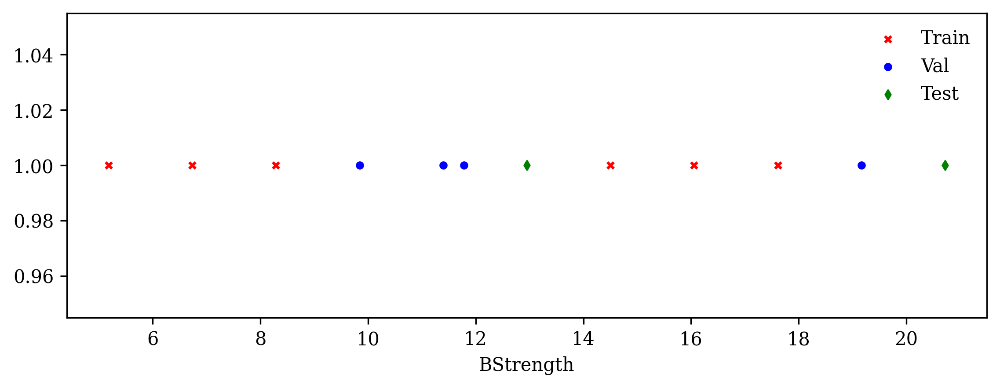

In [15]:
plt.scatter(BS_train, np.ones(6), s=12, c='red', marker='x', label="Train")
plt.scatter(BS_val, np.ones(4), s=12, c='blue', marker='o', label="Val")
plt.scatter(BS_test, np.ones(2), s=12, c='green', marker='d', label="Test")
plt.xlabel("BStrength")
plt.legend()

In [16]:
batch_dict = dut.get_next_batch(data_obj["train_dataloader"], device=device)
val_dict = dut.get_next_batch(data_obj["val_dataloader"], device=device)
test_dict = dut.get_next_batch(data_obj["test_dataloader"], device=device)

raw_train_pred = model(batch_dict["tp_to_predict"], batch_dict["observed_data"])
raw_val_pred = model(val_dict["tp_to_predict"], val_dict["observed_data"])
raw_test_pred = model(test_dict["tp_to_predict"], test_dict["observed_data"])


with torch.no_grad():
    train_pred = torch.permute(torch.squeeze(raw_train_pred), (1, 0, 2)) * (trainMax - trainMin) + trainMin
    val_pred = torch.permute(torch.squeeze(raw_val_pred), (1, 0, 2)) * (trainMax - trainMin) + trainMin
    test_pred = torch.permute(torch.squeeze(raw_test_pred), (1, 0, 2)) * (trainMax - trainMin) + trainMin

train_target = batch_dict["data_to_predict"] * (trainMax - trainMin) + trainMin
val_target = val_dict["data_to_predict"] * (trainMax - trainMin) + trainMin
test_target = test_dict["data_to_predict"] * (trainMax - trainMin) + trainMin

print(train_target.shape, val_target.shape, test_target.shape)

train_pred_rs = train_pred.reshape((-1, len(batch_dict["tp_to_predict"]), 32, 128)).cpu()
val_pred_rs = val_pred.reshape((-1, len(val_dict["tp_to_predict"]), 32, 128)).cpu()
test_pred_rs = test_pred.reshape((-1, len(test_dict["tp_to_predict"]), 32, 128)).cpu()

train_target_rs = train_target.reshape((-1, len(batch_dict["tp_to_predict"]), 32, 128)).cpu()
val_target_rs = val_target.reshape((-1, len(val_dict["tp_to_predict"]), 32, 128)).cpu()
test_target_rs = test_target.reshape((-1, len(test_dict["tp_to_predict"]), 32, 128)).cpu()

torch.Size([6, 44, 4096]) torch.Size([4, 44, 4096]) torch.Size([2, 44, 4096])


In [17]:
tpredict = batch_dict["tp_to_predict"]

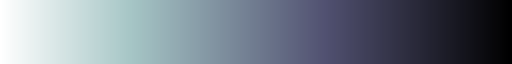

In [18]:
from sunpy.visualization import colormaps as cm

lc3_reg = cm.cmlist['soholasco3']
lc3_reg

lc3 = cm.cmlist['soholasco3'].reversed()
lc3

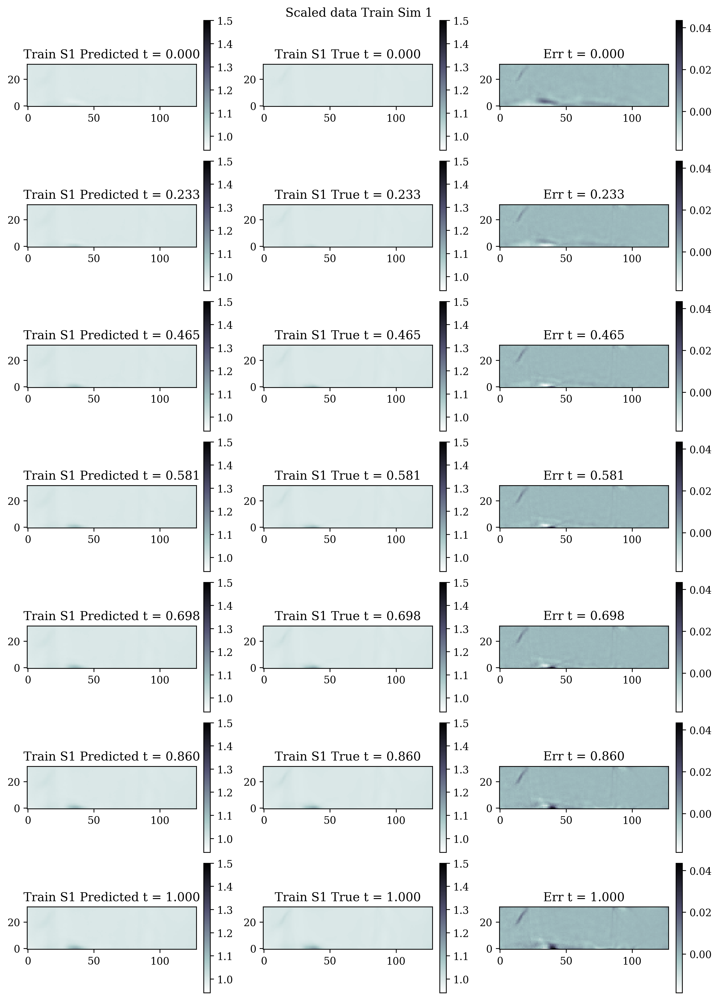

In [19]:
time_idx_to_plot = np.array([0, 10, 20, 25, 30, 37, 43])
sim_idx = 0

train_err_sim = train_target_rs[sim_idx, :, :, :] - train_pred_rs[sim_idx, :, :]


fig, axs = plt.subplots(nrows=7, ncols=3, figsize=(10, 14))

for row in range(7):
    im = axs[row, 0].imshow(train_pred_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 0])
    axs[row, 0].set_title("Train S1 Predicted t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
      

for row in range(7):
    im = axs[row, 1].imshow(train_target_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 1])
    axs[row, 1].set_title("Train S1 True t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
    
    
for row in range(7):
    im = axs[row, 2].imshow(train_err_sim[time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                            vmin=train_err_sim.min(),
                            vmax=train_err_sim.max()
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 2])
    axs[row, 2].set_title("Err t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))

fig.suptitle("Scaled data Train Sim 1")
fig.tight_layout()

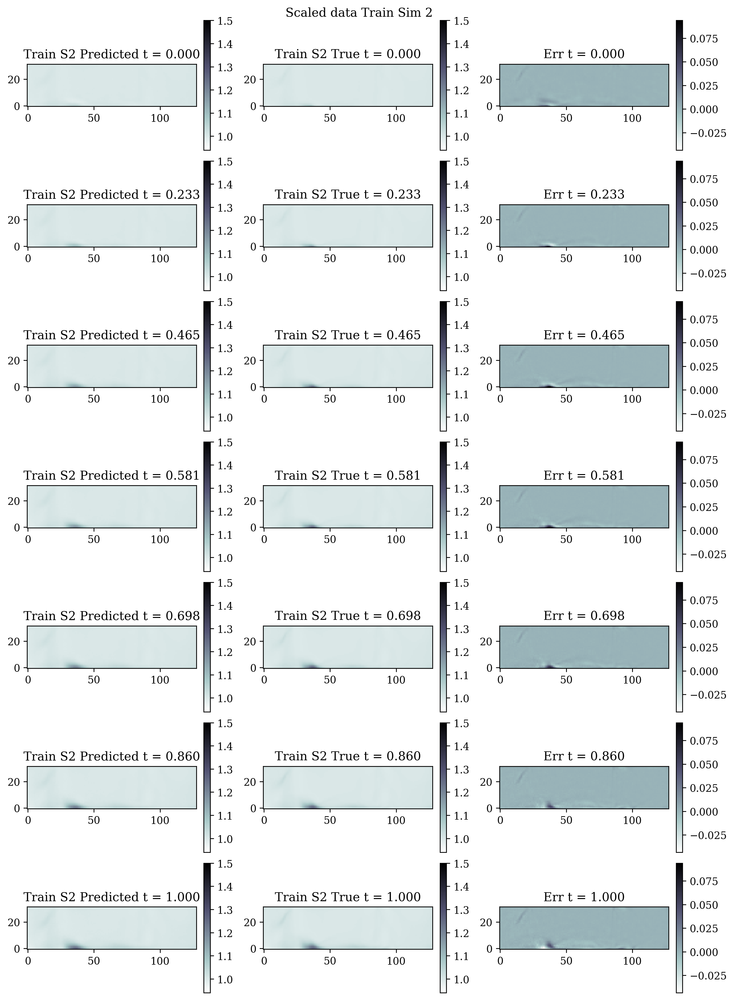

In [20]:
time_idx_to_plot = np.array([0, 10, 20, 25, 30, 37, 43])
sim_idx = 1

train_err_sim = train_target_rs[sim_idx, :, :, :] - train_pred_rs[sim_idx, :, :]


fig, axs = plt.subplots(nrows=7, ncols=3, figsize=(10, 14))

for row in range(7):
    im = axs[row, 0].imshow(train_pred_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 0])
    axs[row, 0].set_title("Train S2 Predicted t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
      

for row in range(7):
    im = axs[row, 1].imshow(train_target_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 1])
    axs[row, 1].set_title("Train S2 True t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
    
    
for row in range(7):
    im = axs[row, 2].imshow(train_err_sim[time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                            vmin=train_err_sim.min(),
                            vmax=train_err_sim.max()
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 2])
    axs[row, 2].set_title("Err t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))

fig.suptitle("Scaled data Train Sim 2")
fig.tight_layout()

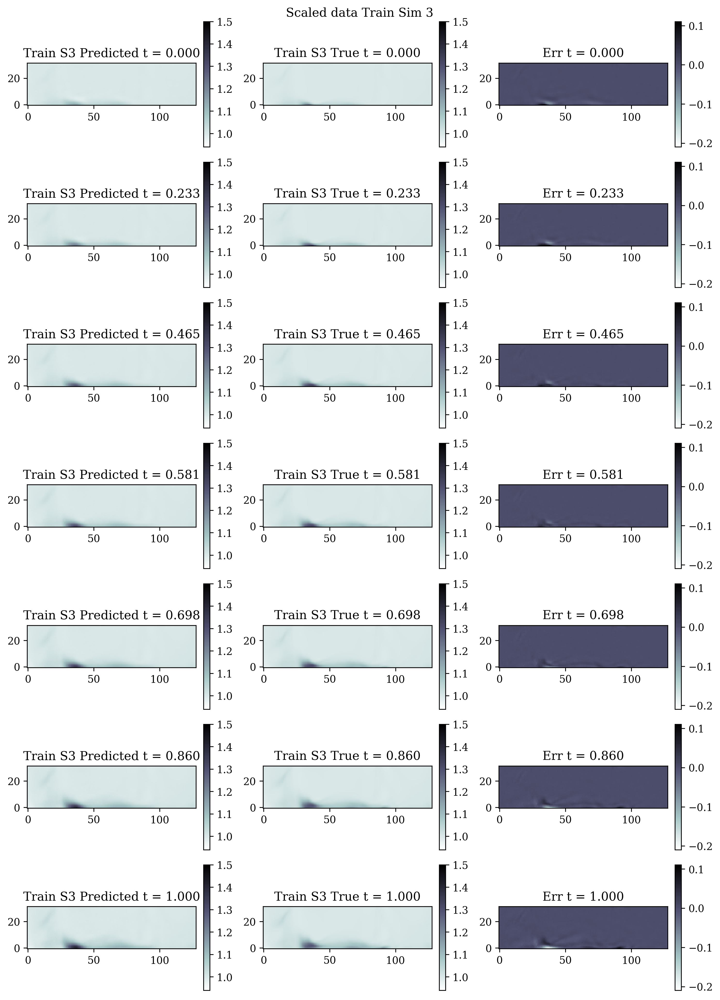

In [21]:
time_idx_to_plot = np.array([0, 10, 20, 25, 30, 37, 43])
sim_idx = 2

train_err_sim = train_target_rs[sim_idx, :, :, :] - train_pred_rs[sim_idx, :, :]


fig, axs = plt.subplots(nrows=7, ncols=3, figsize=(10, 14))

for row in range(7):
    im = axs[row, 0].imshow(train_pred_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 0])
    axs[row, 0].set_title("Train S3 Predicted t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
      

for row in range(7):
    im = axs[row, 1].imshow(train_target_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 1])
    axs[row, 1].set_title("Train S3 True t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
    
    
for row in range(7):
    im = axs[row, 2].imshow(train_err_sim[time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                            vmin=train_err_sim.min(),
                            vmax=train_err_sim.max()
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 2])
    axs[row, 2].set_title("Err t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))

fig.suptitle("Scaled data Train Sim 3")
fig.tight_layout()

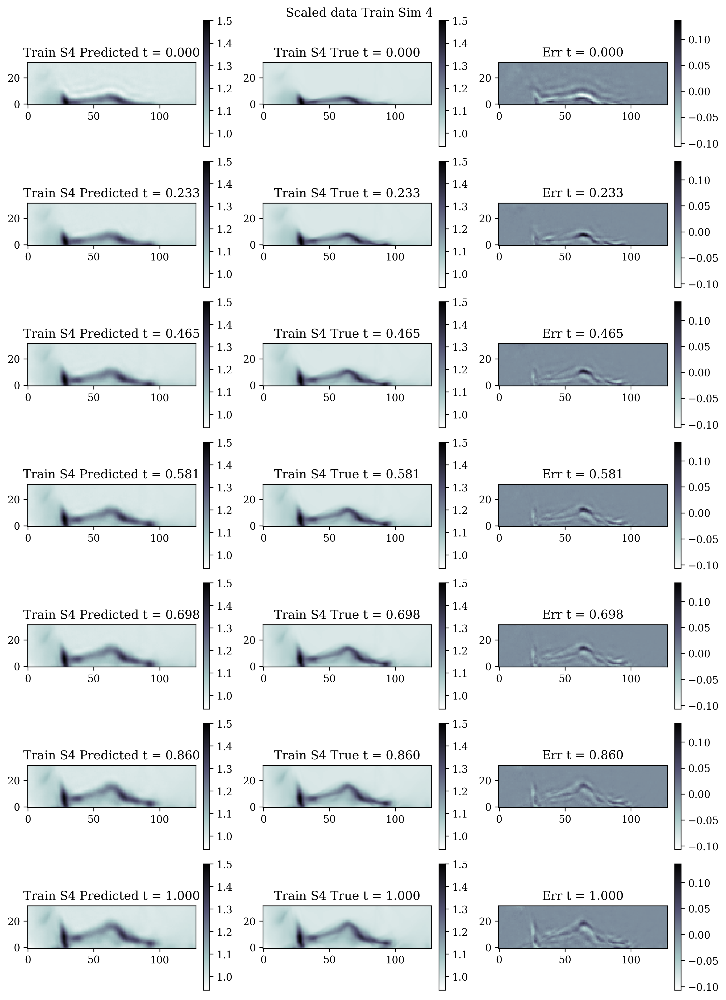

In [22]:
time_idx_to_plot = np.array([0, 10, 20, 25, 30, 37, 43])
sim_idx = 3

train_err_sim = train_target_rs[sim_idx, :, :, :] - train_pred_rs[sim_idx, :, :]


fig, axs = plt.subplots(nrows=7, ncols=3, figsize=(10, 14))

for row in range(7):
    im = axs[row, 0].imshow(train_pred_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 0])
    axs[row, 0].set_title("Train S4 Predicted t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
      

for row in range(7):
    im = axs[row, 1].imshow(train_target_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 1])
    axs[row, 1].set_title("Train S4 True t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
    
    
for row in range(7):
    im = axs[row, 2].imshow(train_err_sim[time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                            vmin=train_err_sim.min(),
                            vmax=train_err_sim.max()
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 2])
    axs[row, 2].set_title("Err t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))

fig.suptitle("Scaled data Train Sim 4")
fig.tight_layout()

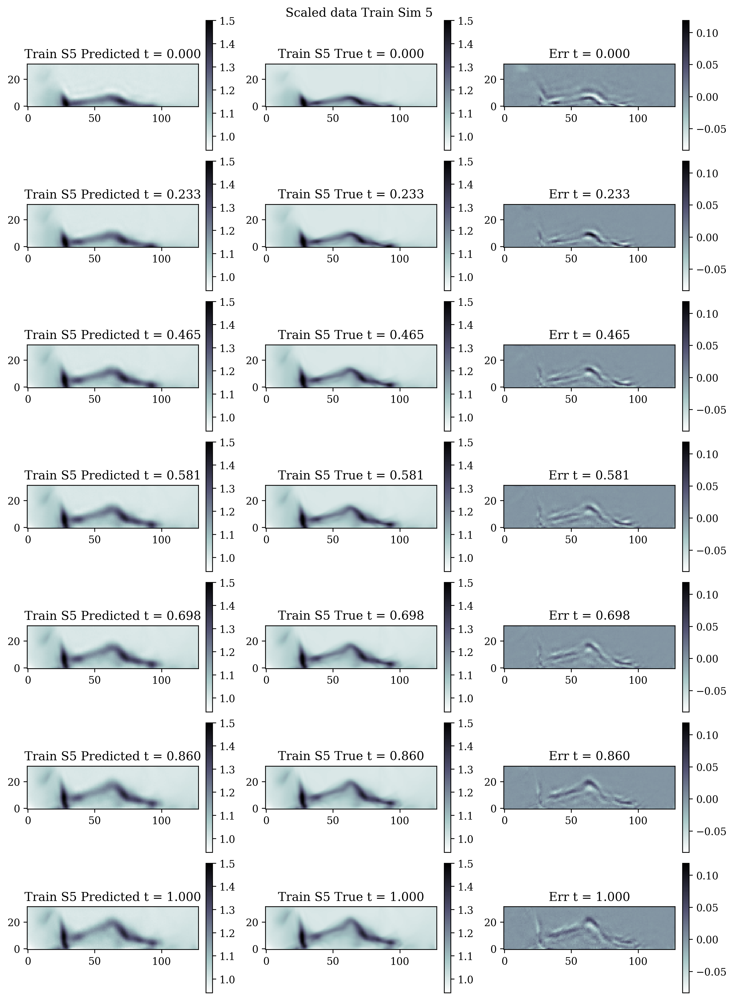

In [23]:
time_idx_to_plot = np.array([0, 10, 20, 25, 30, 37, 43])
sim_idx = 4

train_err_sim = train_target_rs[sim_idx, :, :, :] - train_pred_rs[sim_idx, :, :]


fig, axs = plt.subplots(nrows=7, ncols=3, figsize=(10, 14))

for row in range(7):
    im = axs[row, 0].imshow(train_pred_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 0])
    axs[row, 0].set_title("Train S5 Predicted t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
      

for row in range(7):
    im = axs[row, 1].imshow(train_target_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 1])
    axs[row, 1].set_title("Train S5 True t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
    
    
for row in range(7):
    im = axs[row, 2].imshow(train_err_sim[time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                            vmin=train_err_sim.min(),
                            vmax=train_err_sim.max()
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 2])
    axs[row, 2].set_title("Err t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))

fig.suptitle("Scaled data Train Sim 5")
fig.tight_layout()

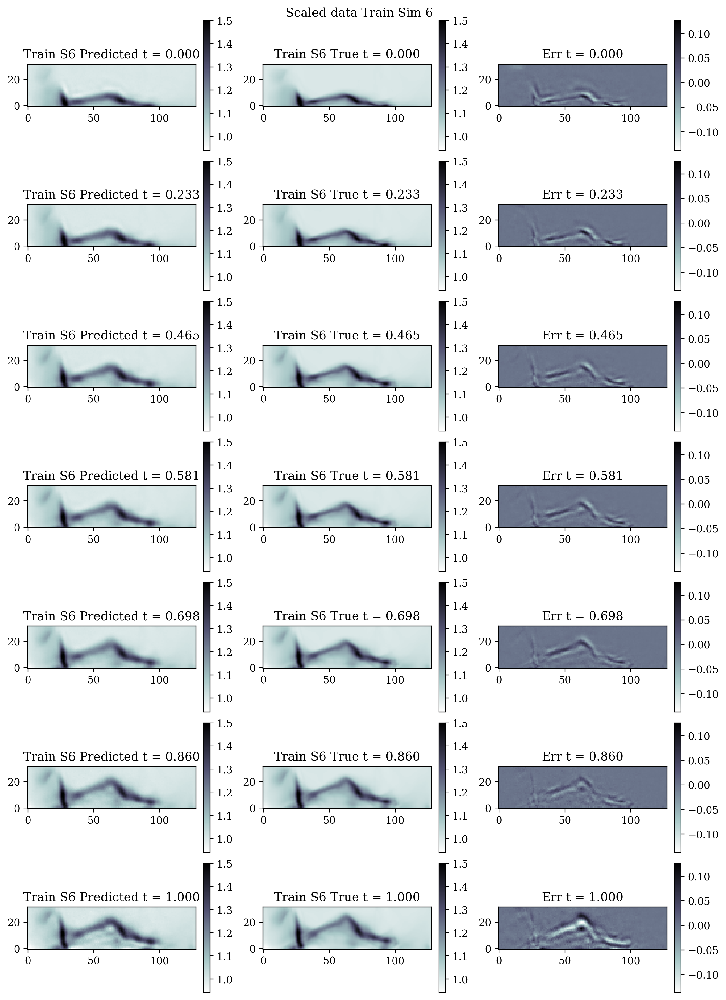

In [24]:
time_idx_to_plot = np.array([0, 10, 20, 25, 30, 37, 43])
sim_idx = 5

train_err_sim = train_target_rs[sim_idx, :, :, :] - train_pred_rs[sim_idx, :, :]


fig, axs = plt.subplots(nrows=7, ncols=3, figsize=(10, 14))

for row in range(7):
    im = axs[row, 0].imshow(train_pred_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 0])
    axs[row, 0].set_title("Train S6 Predicted t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
      

for row in range(7):
    im = axs[row, 1].imshow(train_target_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 1])
    axs[row, 1].set_title("Train S6 True t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
    
    
for row in range(7):
    im = axs[row, 2].imshow(train_err_sim[time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                            vmin=train_err_sim.min(),
                            vmax=train_err_sim.max()
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 2])
    axs[row, 2].set_title("Err t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))

fig.suptitle("Scaled data Train Sim 6")
fig.tight_layout()

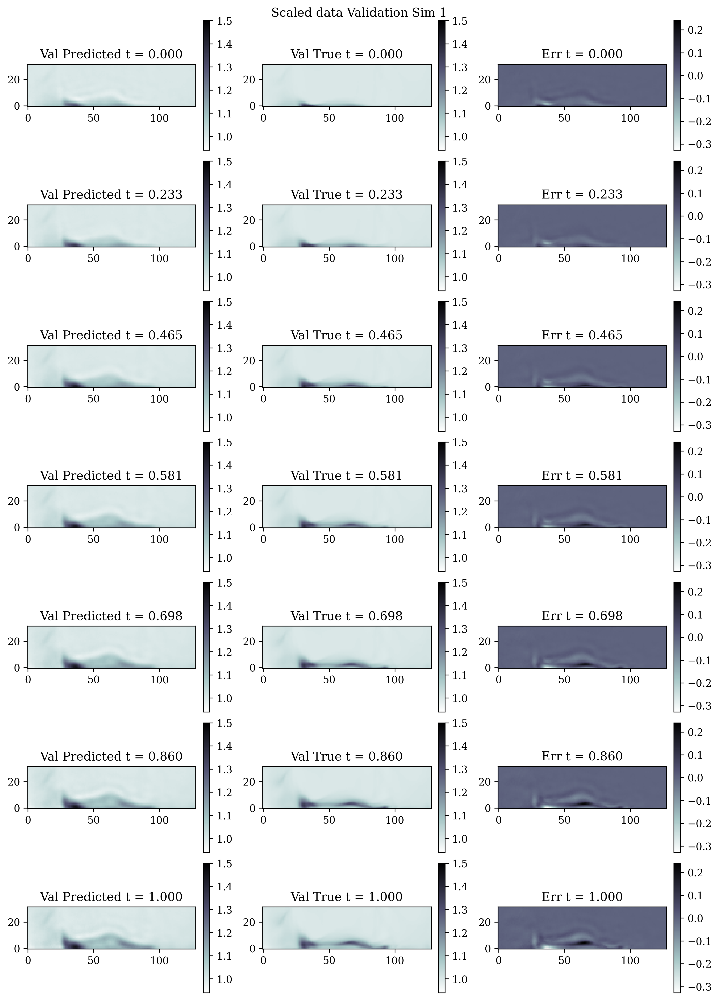

In [25]:
time_idx_to_plot = np.array([0, 10, 20, 25, 30, 37, 43])
sim_idx = 0
val_err_sim = val_target_rs[sim_idx, :, :, :] - val_pred_rs[sim_idx, :, :]


fig, axs = plt.subplots(nrows=7, ncols=3, figsize=(10, 14))

for row in range(7):
    im = axs[row, 0].imshow(val_pred_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 0])
    axs[row, 0].set_title("Val Predicted t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
      

for row in range(7):
    im = axs[row, 1].imshow(val_target_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 1])
    axs[row, 1].set_title("Val True t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
    
    
for row in range(7):
    im = axs[row, 2].imshow(val_err_sim[time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                            vmin=val_err_sim.min(),
                            vmax=val_err_sim.max()
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 2])
    axs[row, 2].set_title("Err t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))

fig.suptitle("Scaled data Validation Sim 1")
fig.tight_layout()

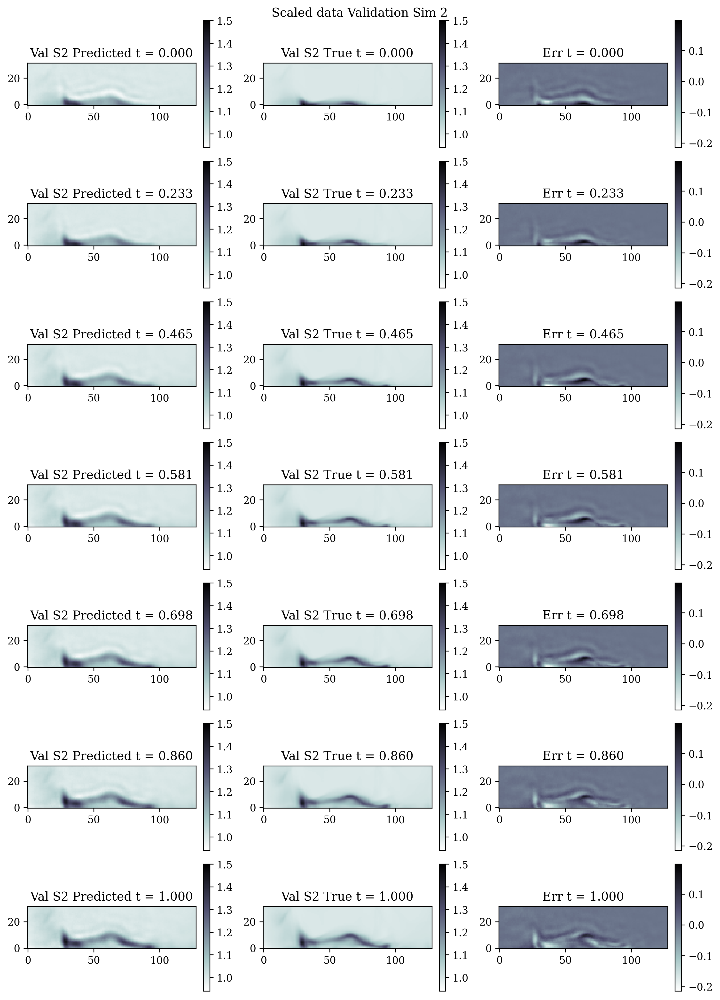

In [26]:
time_idx_to_plot = np.array([0, 10, 20, 25, 30, 37, 43])
sim_idx = 1
val_err_sim = val_target_rs[sim_idx, :, :, :] - val_pred_rs[sim_idx, :, :]


fig, axs = plt.subplots(nrows=7, ncols=3, figsize=(10, 14))

for row in range(7):
    im = axs[row, 0].imshow(val_pred_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 0])
    axs[row, 0].set_title("Val S2 Predicted t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
      

for row in range(7):
    im = axs[row, 1].imshow(val_target_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 1])
    axs[row, 1].set_title("Val S2 True t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
    
    
for row in range(7):
    im = axs[row, 2].imshow(val_err_sim[time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                            vmin=val_err_sim.min(),
                            vmax=val_err_sim.max()
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 2])
    axs[row, 2].set_title("Err t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))

fig.suptitle("Scaled data Validation Sim 2")
fig.tight_layout()

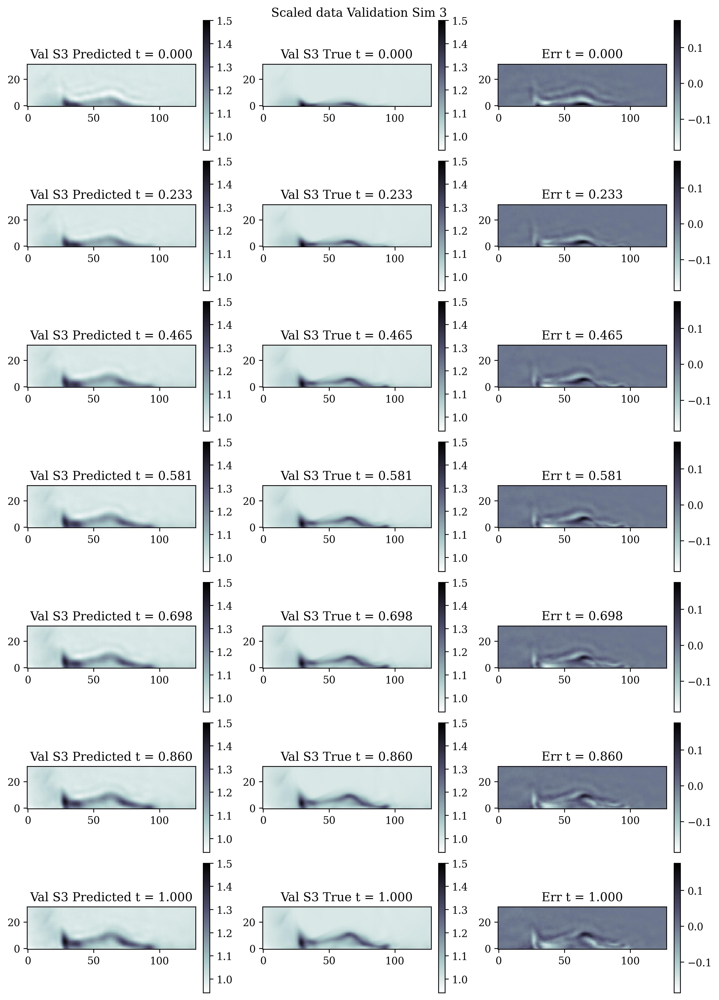

In [27]:
time_idx_to_plot = np.array([0, 10, 20, 25, 30, 37, 43])
sim_idx = 2
val_err_sim = val_target_rs[sim_idx, :, :, :] - val_pred_rs[sim_idx, :, :]


fig, axs = plt.subplots(nrows=7, ncols=3, figsize=(10, 14))

for row in range(7):
    im = axs[row, 0].imshow(val_pred_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 0])
    axs[row, 0].set_title("Val S3 Predicted t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
      

for row in range(7):
    im = axs[row, 1].imshow(val_target_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 1])
    axs[row, 1].set_title("Val S3 True t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
    
    
for row in range(7):
    im = axs[row, 2].imshow(val_err_sim[time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                            vmin=val_err_sim.min(),
                            vmax=val_err_sim.max()
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 2])
    axs[row, 2].set_title("Err t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))

fig.suptitle("Scaled data Validation Sim 3")
fig.tight_layout()

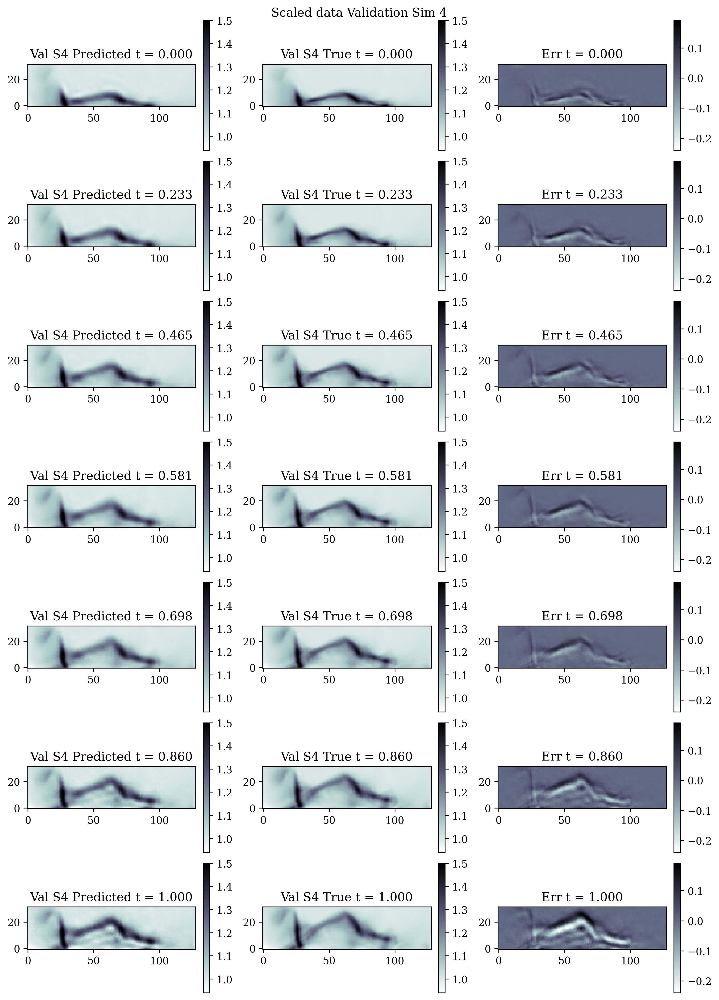

In [28]:
time_idx_to_plot = np.array([0, 10, 20, 25, 30, 37, 43])
sim_idx = 3
val_err_sim = val_target_rs[sim_idx, :, :, :] - val_pred_rs[sim_idx, :, :]


fig, axs = plt.subplots(nrows=7, ncols=3, figsize=(10, 14))

for row in range(7):
    im = axs[row, 0].imshow(val_pred_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 0])
    axs[row, 0].set_title("Val S4 Predicted t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
      

for row in range(7):
    im = axs[row, 1].imshow(val_target_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 1])
    axs[row, 1].set_title("Val S4 True t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
    
    
for row in range(7):
    im = axs[row, 2].imshow(val_err_sim[time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                            vmin=val_err_sim.min(),
                            vmax=val_err_sim.max()
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 2])
    axs[row, 2].set_title("Err t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))

fig.suptitle("Scaled data Validation Sim 4")
fig.tight_layout()

### Plot Test Predictions

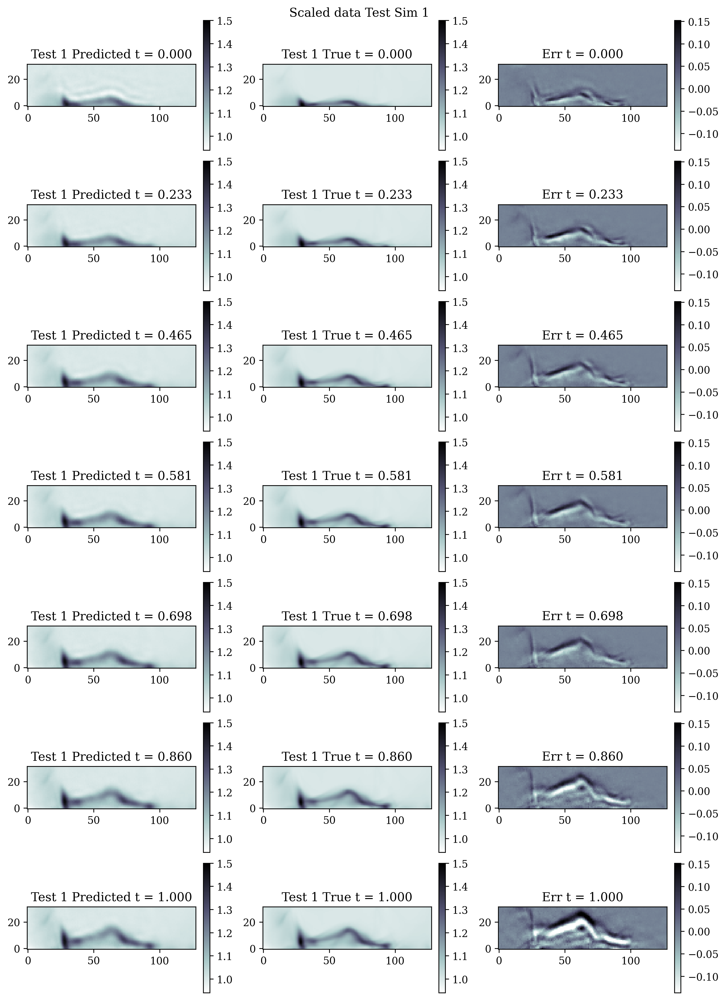

In [29]:
time_idx_to_plot = np.array([0, 10, 20, 25, 30, 37, 43])
sim_idx = 0
test_err_sim = test_target_rs[sim_idx, :, :, :] - test_pred_rs[sim_idx, :, :]


fig, axs = plt.subplots(nrows=7, ncols=3, figsize=(10, 14))

for row in range(7):
    im = axs[row, 0].imshow(test_pred_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 0])
    axs[row, 0].set_title("Test 1 Predicted t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
      

for row in range(7):
    im = axs[row, 1].imshow(test_target_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 1])
    axs[row, 1].set_title("Test 1 True t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
    
    
for row in range(7):
    im = axs[row, 2].imshow(val_err_sim[time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                            vmin=test_err_sim.min(),
                            vmax=test_err_sim.max()
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 2])
    axs[row, 2].set_title("Err t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))

fig.suptitle("Scaled data Test Sim 1")
fig.tight_layout()

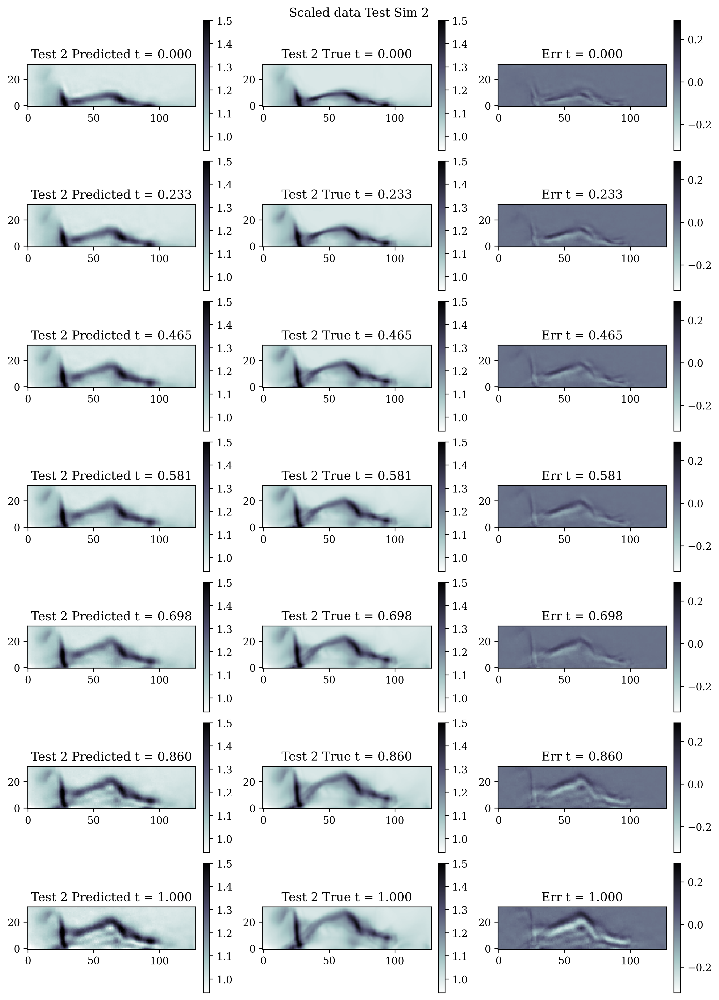

In [30]:
time_idx_to_plot = np.array([0, 10, 20, 25, 30, 37, 43])
sim_idx = 1
test_err_sim = test_target_rs[sim_idx, :, :, :] - test_pred_rs[sim_idx, :, :]


fig, axs = plt.subplots(nrows=7, ncols=3, figsize=(10, 14))

for row in range(7):
    im = axs[row, 0].imshow(test_pred_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 0])
    axs[row, 0].set_title("Test 2 Predicted t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
      

for row in range(7):
    im = axs[row, 1].imshow(test_target_rs[sim_idx, time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                           vmin=trainMin,
                           vmax=trainMax
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 1])
    axs[row, 1].set_title("Test 2 True t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))
    
    
for row in range(7):
    im = axs[row, 2].imshow(val_err_sim[time_idx_to_plot[row], :, :],
                           origin="lower",
                           cmap=lc3,
                            vmin=test_err_sim.min(),
                            vmax=test_err_sim.max()
                           )
    plt.colorbar(im, fraction=0.046, pad=0.04, ax=axs[row, 2])
    axs[row, 2].set_title("Err t = {:.3f}".format(tpredict[time_idx_to_plot[row]]))

fig.suptitle("Scaled data Test Sim 2")
fig.tight_layout()

### Visualize Latent Space

In [31]:
# batch_dict = dut.get_next_batch(data_obj["train_dataloader"], device=device)
# val_dict = dut.get_next_batch(data_obj["val_dataloader"], device=device)
# test_dict = dut.get_next_batch(data_obj["test_dataloader"], device=device)


def getLatentStatesFromModel(batch_data, model):
    input_dim = data_obj["input_dim"]
    y = batch_data["observed_data"]
    t = batch_data["tp_to_predict"]
    init_state = y[:, :, :input_dim]
    nbatch, ntraj, nseq = init_state.shape
    init_state = init_state.reshape((nbatch * ntraj, 1, 32, 128))
    init_latent = model.encoder(init_state).reshape((nbatch, ntraj, args["latents"]))
    init_latent = torch.cat((init_latent, y[:, :, input_dim:]),-1)
    latent_states = odeint(model.pnode, init_latent, t)
    return latent_states[:, 0, :, :args["latents"]].cpu().detach().numpy()

raw_train_latent = getLatentStatesFromModel(batch_dict, model)
raw_val_latent = getLatentStatesFromModel(val_dict, model)
raw_test_latent = getLatentStatesFromModel(test_dict, model)

print(raw_train_latent.shape, raw_val_latent.shape, raw_test_latent.shape)


# raw_train_pred = model(batch_dict["tp_to_predict"], batch_dict["observed_data"])
# raw_val_pred = model(val_dict["tp_to_predict"], val_dict["observed_data"])
# raw_test_pred = model(test_dict["tp_to_predict"], test_dict["observed_data"])


# with torch.no_grad():
#     train_pred = torch.permute(torch.squeeze(raw_train_pred), (1, 0, 2)) * (trainMax - trainMin) + trainMin
#     val_pred = torch.permute(torch.squeeze(raw_val_pred), (1, 0, 2)) * (trainMax - trainMin) + trainMin
#     test_pred = torch.permute(torch.squeeze(raw_test_pred), (1, 0, 2)) * (trainMax - trainMin) + trainMin

# train_target = batch_dict["data_to_predict"] * (trainMax - trainMin) + trainMin
# val_target = val_dict["data_to_predict"] * (trainMax - trainMin) + trainMin
# test_target = test_dict["data_to_predict"] * (trainMax - trainMin) + trainMin

# print(train_target.shape, val_target.shape, test_target.shape)

# train_pred_rs = train_pred.reshape((-1, len(batch_dict["tp_to_predict"]), 32, 128)).cpu()
# val_pred_rs = val_pred.reshape((-1, len(val_dict["tp_to_predict"]), 32, 128)).cpu()
# test_pred_rs = test_pred.reshape((-1, len(test_dict["tp_to_predict"]), 32, 128)).cpu()

# train_target_rs = train_target.reshape((-1, len(batch_dict["tp_to_predict"]), 32, 128)).cpu()
# val_target_rs = val_target.reshape((-1, len(val_dict["tp_to_predict"]), 32, 128)).cpu()
# test_target_rs = test_target.reshape((-1, len(test_dict["tp_to_predict"]), 32, 128)).cpu()

(44, 6, 8) (44, 4, 8) (44, 2, 8)


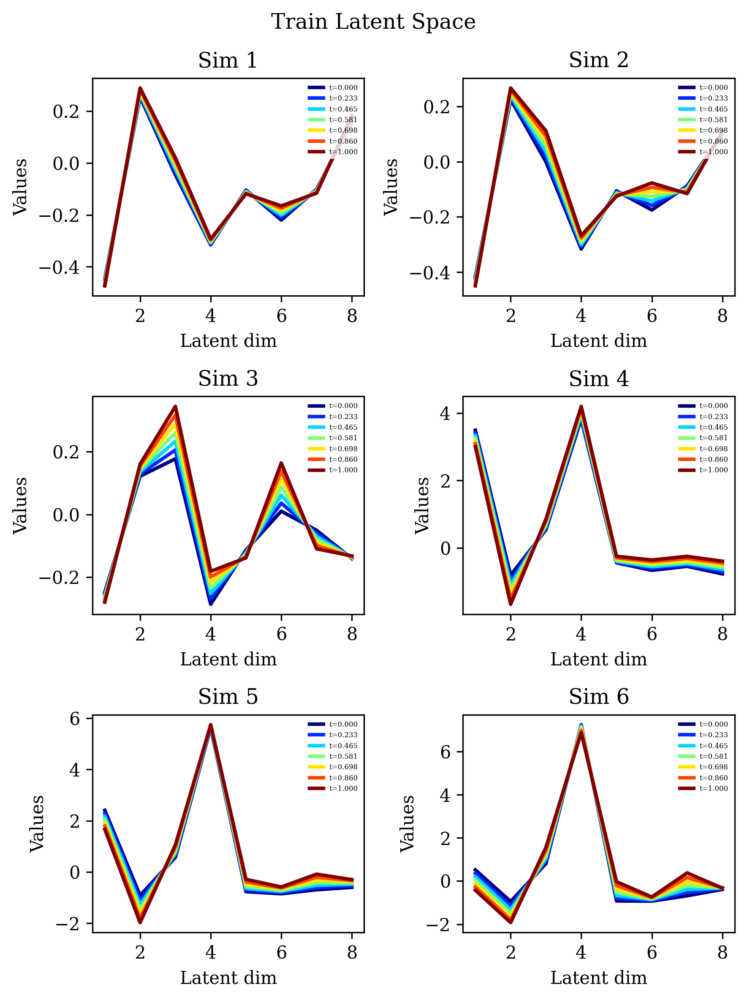

In [32]:
time_idx_to_plot = np.array([0, 10, 20, 25, 30, 37, 43])
nt_to_plot = len(time_idx_to_plot)
colors = plt.cm.jet(np.linspace(0,1,nt_to_plot))

fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(6, 8))

for i, ax in enumerate(axs.flat):
    for j in range(nt_to_plot):
        ax.plot(np.linspace(1, args["latents"], args["latents"]), raw_train_latent[j, i, :],
                    linewidth=2,
                    color=colors[j],
                    label="t={:.3f}".format(data_obj["tpredict"][time_idx_to_plot[j]])
        )
    ax.set_xlabel("Latent dim")
    ax.set_ylabel("Values")
    ax.set_title("Sim {}".format(i + 1))
    ax.legend(loc="upper right", fontsize=4)
      
fig.suptitle("Train Latent Space")
fig.tight_layout()

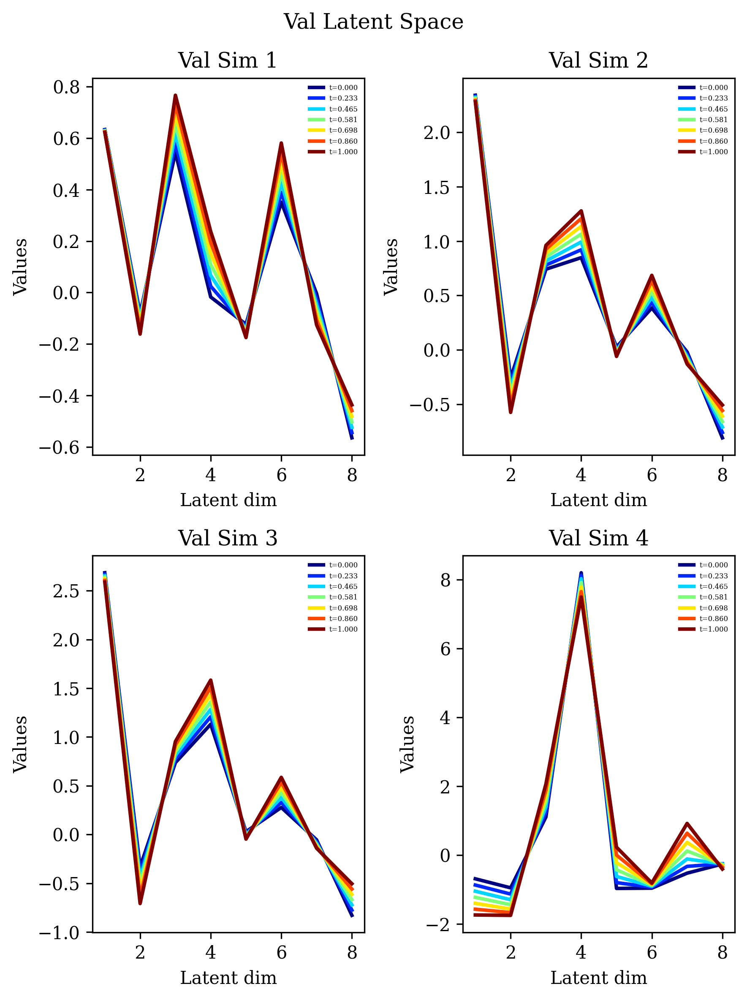

In [33]:
time_idx_to_plot = np.array([0, 10, 20, 25, 30, 37, 43])
nt_to_plot = len(time_idx_to_plot)
colors = plt.cm.jet(np.linspace(0,1,nt_to_plot))

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(6, 8))

for i, ax in enumerate(axs.flat):
    for j in range(nt_to_plot):
        ax.plot(np.linspace(1, args["latents"], args["latents"]), raw_val_latent[j, i, :],
                    linewidth=2,
                    color=colors[j],
                    label="t={:.3f}".format(data_obj["tpredict"][time_idx_to_plot[j]])
        )
    ax.set_xlabel("Latent dim")
    ax.set_ylabel("Values")
    ax.set_title("Val Sim {}".format(i + 1))
    ax.legend(loc="upper right", fontsize=4)
      
fig.suptitle("Val Latent Space")
fig.tight_layout()

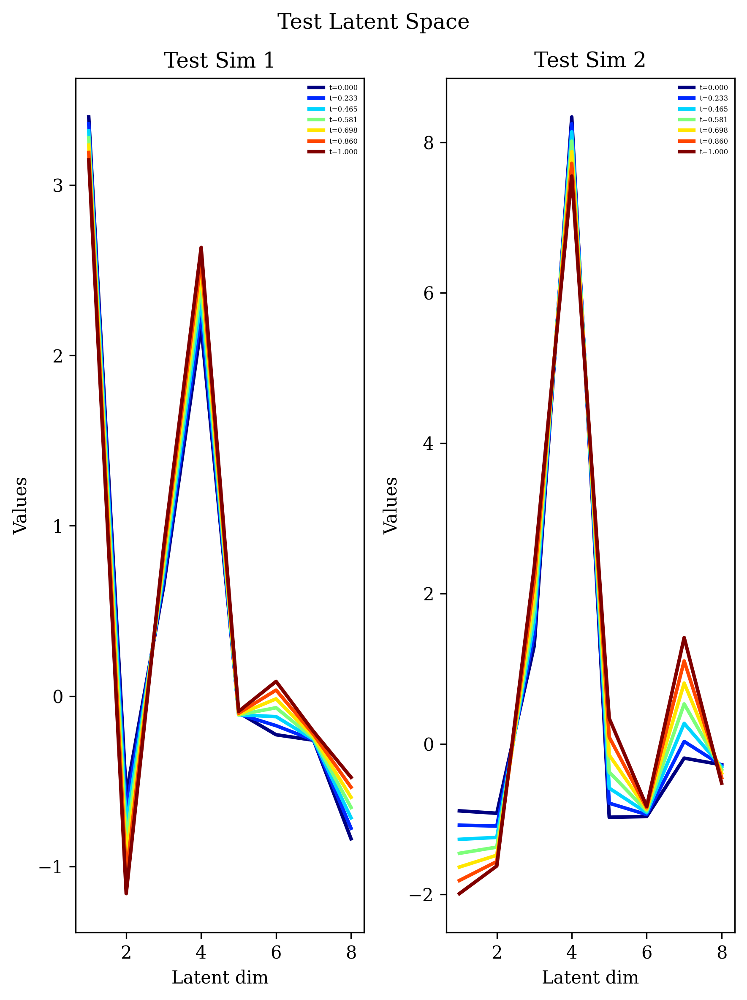

In [34]:
time_idx_to_plot = np.array([0, 10, 20, 25, 30, 37, 43])
nt_to_plot = len(time_idx_to_plot)
colors = plt.cm.jet(np.linspace(0,1,nt_to_plot))

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(6, 8))

for i, ax in enumerate(axs.flat):
    for j in range(nt_to_plot):
        ax.plot(np.linspace(1, args["latents"], args["latents"]), raw_test_latent[j, i, :],
                    linewidth=2,
                    color=colors[j],
                    label="t={:.3f}".format(data_obj["tpredict"][time_idx_to_plot[j]])
        )
    ax.set_xlabel("Latent dim")
    ax.set_ylabel("Values")
    ax.set_title("Test Sim {}".format(i + 1))
    ax.legend(loc="upper right", fontsize=4)
      
fig.suptitle("Test Latent Space")
fig.tight_layout()

In [13]:
# MODEL TESTING (ARCHITECTURE DIMS)
data_obj = dut.parse_datasets(validation_file, sim_file, param_file, args, device)
batch_dict = dut.get_next_batch(data_obj["train_dataloader"], device=device)

y0 = batch_dict['observed_data']
t0 = batch_dict['observed_tp']
yt = batch_dict['data_to_predict']
tt = batch_dict['tp_to_predict']

input_dim = data_obj["input_dim"]
print(input_dim)

model = nut.PNODE_Conv(input_dim=4096, latent_dim=args["latents"], param_dim=2, 
                       device=device,
                      n_layers=args["node-layers"],
                      n_units=args["units"],
                      quadratic=args["quadratic"]).to(device)

init_state = y0[:, :, :input_dim].to(device)
print(init_state.shape)
nbatch, ntraj, nseq = init_state.shape
print(nbatch, ntraj, nseq)
init_state = init_state.reshape((ntraj*nbatch, 1, 32, 128))
print(init_state.shape)

print(model.encoder[0](init_state).shape)
print(model.encoder[0:2](init_state).shape)
print(model.encoder[0:4](init_state).shape)
print(model.encoder[0:5](init_state).shape)
print(model.encoder[0:7](init_state).shape)
print(model.encoder[0:8](init_state).shape)
print(model.encoder[0:10](init_state).shape)
print(model.encoder[0:11](init_state).shape)
print(model.encoder[0:13](init_state).shape)
print(model.encoder[0:15](init_state).shape)
print(model.encoder[0:16](init_state).shape)
print(model.encoder[0:18](init_state).shape)
print(model.encoder(init_state).shape)
print(model.encoder(init_state).reshape((nbatch, ntraj, args["latents"])).shape)

init_latent = model.encoder(init_state).reshape((nbatch, ntraj, args["latents"]))
init_latent = torch.cat((init_latent, y0[:, :, input_dim:]), -1)
print("Shape of Latent IC: ")
print(init_latent.shape)
latent_states = odeint(model.pnode, init_latent, tt)
print(latent_states.shape)

ls_init = latent_states[:, :, :, :args["latents"]]
print(ls_init.shape)

ntraj2, nbatch2, nseq2, _ = ls_init.shape
print(ntraj2, nbatch2, nseq2)

latent_mlp = model.decoder_mlp(ls_init)
print(latent_mlp.shape)

decoder_features = latent_mlp.reshape((-1, 64, 1, 4))
print(decoder_features.shape)

print(model.decoder_conv[0](decoder_features).shape)
print(model.decoder_conv[0:3](decoder_features).shape)
print(model.decoder_conv[0:5](decoder_features).shape)
print(model.decoder_conv[0:8](decoder_features).shape)
print(model.decoder_conv[0:10](decoder_features).shape)

print(model.decoder_conv[0:10](decoder_features).reshape(ntraj2, nbatch2, nseq2, 4096).shape)

print(model(tt, y0).shape)

print(model)

4096
Using regular PNODE
torch.Size([1, 6, 4096])
1 6 4096
torch.Size([6, 1, 32, 128])
torch.Size([6, 1, 47, 143])
torch.Size([6, 4, 16, 64])
torch.Size([6, 4, 23, 71])
torch.Size([6, 8, 8, 32])
torch.Size([6, 8, 11, 35])
torch.Size([6, 16, 4, 16])
torch.Size([6, 16, 5, 17])
torch.Size([6, 32, 2, 8])
torch.Size([6, 32, 2, 8])
torch.Size([6, 64, 1, 4])
torch.Size([6, 256])
torch.Size([6, 8])
torch.Size([6, 8])
torch.Size([1, 6, 8])
Shape of Latent IC: 
torch.Size([1, 6, 10])
torch.Size([44, 1, 6, 10])
torch.Size([44, 1, 6, 8])
44 1 6
torch.Size([44, 1, 6, 256])
torch.Size([264, 64, 1, 4])
torch.Size([264, 32, 2, 8])
torch.Size([264, 16, 4, 16])
torch.Size([264, 8, 8, 32])
torch.Size([264, 4, 16, 64])
torch.Size([264, 1, 32, 128])
torch.Size([44, 1, 6, 4096])
torch.Size([44, 1, 6, 4096])
PNODE_Conv(
  (encoder): Sequential(
    (0): ZeroPad2d((7, 8, 7, 8))
    (1): Conv2d(1, 4, kernel_size=(16, 16), stride=(2, 2))
    (2): ELU(alpha=1.0)
    (3): ZeroPad2d((3, 4, 3, 4))
    (4): Conv2d(4